# 👨‍⚕️ **AI4CKD – Prédiction des Stades de la Maladie Rénale Chronique**

### **Groupe2**
### **Spécialité** : Intelligence Artificielle  
### **Hackathon** : AI4CKD  
### **Institut** : IFRI - UAC  
### **Période** : 27 mars – 12 avril 2025

## 🎯 **Objectif du Projet**

### Développer un modèle robuste et interprétable capable de **prédire les stades de la maladie rénale chronique (MRC/CKD)** à partir des **données médicales des patients** (examens biologiques, historiques de santé, facteurs de risque...).

### L’objectif est aussi de contribuer à un outil d’aide à la décision pour les professionnels de santé.

## 🗂️ **Plan**

### 1. Contexte et Problématique  
### 2. Importation des bibliothèques  
### 3. Prise de connaissance de la base de données et feature selection
### 4. Analyse statistiques des données
### 5. Modélisation (plusieurs modèles testés)  
### 6. Gestion de la base de données
### 7. Analyse statistiques et traitement des données
### 8. Feature Selection et Feature Engineering pour la prédiction du Stage de l'IRC  
### 9. MODELISATION-HACKATHON


## 1. 📚 **Contexte et Problématique**

#### La maladie rénale chronique est une pathologie silencieuse qui évolue par stades.  
#### Grâce à l’IA, il est possible d’analyser de grandes quantités de données cliniques pour prédire ces stades.

#### Ce projet vise à mettre en œuvre des **modèles d’apprentissage automatique explicables** capables de :
#### - prédire le stade de CKD d’un patient,
#### - identifier les facteurs de risque déterminants,
#### - fournir des résultats compréhensibles aux professionnels de santé.

## 2. 📦 **Importation des bibliothèques**


In [ ]:
import pandas as pd
import numpy as np
from scipy.stats import chi2
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
import missingno as msno
import matplotlib.pyplot as plt
from scipy.stats import chi2_contingency
import seaborn as sns
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.model_selection import train_test_split
from imblearn.over_sampling import SMOTE
from sklearn.preprocessing import OneHotEncoder
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from scipy import stats
from scipy.stats import skew
from scipy.stats import shapiro
from sklearn.impute import KNNImputer
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from sklearn.model_selection import RandomizedSearchCV
from sklearn.preprocessing import StandardScaler
from xgboost import XGBClassifier


## 3. 📁 **Prise de connaissance de la base de données et feature selection**

In [ ]:
df = pd.read_csv("Data AI4CKD - Original.csv")
df.head()

,ID,Sexe,Age,Nationalité,Profession (selon catégorie professionnelle),Adresse (Département),Situation Matrimoniale,Motif(s) d'Admission/Asthénie,Motif(s) d'Admission/Altération de la fonction rénale,Motif(s) d'Admission/HTA,Motif(s) d'Admission/Œdème,Motif(s) d'Admission/Diabète,Motif(s) d'Admission/Douleur abdominale,Autres Motifs d'Admission,Personnels Médicaux/HTA,Personnels Médicaux/Diabète 1,Personnels Médicaux/Diabète 2,Personnels Médicaux/IRC,"Personnels Médicaux/Maladies Cardiovasculaire(Cardiopathie, AVC, preeclampsie)",Personnels Médicaux/Ulcère,"Personnels Médicaux/Pathologies virales (HB, HC, HIV)",Autres Antécédents Personnels Médicaux,Durée HTA (mois),Durée Diabète 1 (mois),Durée Diabète 2 (mois),Durée IRC (mois),Personnels Chirurgicaux/Appendicectomie,Personnels Chirurgicaux/Césarienne,Personnels Chirurgicaux/Hystérectomie,Autre Antécédent Personnel Chirurgical,Personnels Familiaux/HTA,Personnels Familiaux/Diabète,Autres Antécédents Personnels Familiaux,Enquête Sociale/Tabac,Enquête Sociale/AlNS (+),Enquête Sociale/Alcool,Enquête Sociale/Phytothérapie traditionnelle,Enquête Sociale/Epice,Enquête Sociale/PEC oui,Enquête Sociale/PEC non,Autres détails de l'Enquête Sociale à Préciser,Début des symptômes (mois),Symptômes/Fièvre,Symptômes/Frissons,Symptômes/Céphalées,Symptômes/Douleur Lombaire,Symptômes/Dysurie,Symptômes/Oligurie,Symptômes/Diarrhée,Symptômes/Douleur Thoracique,Symptômes/Anorexie,Symptômes/Anémie,Symptômes/Nausées,Symptômes/Douleur abdominale,Symptômes/Articulaire,Symptômes/HTA,Symptômes/Flou visuel,Symptômes/Asthénie,Symptômes/Vomissements,Symptômes/Insomnie,Symptômes/Nycturie,Symptômes/Toux Grave,Symptômes/Détresse Respiratoire,Symptômes/Perte de poids,Symptômes/OMI,Symptômes/Bouffissure du Visage,Autre Symptôme à Notifier,Automédication ?,Evolution de l'Etat Générale/Favorable,Evolution de l'Etat Générale/Pas Favorable,Evolution de l'Etat Générale/Patient Perdu de vue,Etat Général (EG) à l'Admission,Etat Général (EG)/OMI,Etat Général (EG)/Plis de déshydratation,Etat Général (EG)/Muqueuse Bulbaire,Etat Général (EG)/Muqueuse Palpébrale,Etat Général (EG)/Autre,Sueur,Température (C°),TA (mmHg)/Systole,TA (mmHg)/Diastole,Poul (bpm),Poids (Kg),Taille (m),IMC,SaO^2 (%),FR (cpm),Diurèse,BU/Leucocytose,BU/Nitrite,BU/Hématurie,BU/Protéinurie,BU/Glucosurie,BU/Albuminuerie,Coloration des Urines,Aspect des Urines,Vibrations Vocales (VV),Amplification Thoracique,Sonorité Pulmonaire,Murmure Vésiculaire,Râles crépitants,Autres Détails de l'Examen Pleuropulmonaire,B1 et B2/Réguliers,B1 et B2/Perçu sans souffle,Choc de Pointe/Perçu,Choc de Pointe/Palpé,Lieu de la Palpation/ EICG (Espace InterCostal Gauche),Pouls Périphériques/Régulier,Présence de bruits surajoutés,TSJ (Signe de Hazer),RHJ,Mollets souples,OMI/Siégeant au niveau des pieds,OMI/Bilatéral,OMI/Indolores,OMI/Mous,OMI/Douloureux,OMI/Prenant le godet,OMI/Remontant jusqu'au,Hygiène buccodentaire,Langue,Abdomen/Souple,Abdomen/Balloné (et infiltré),Abdomen/Douloureux,Douleur Epigastrique,Douleur Hypogastrique,Douleur à l'hypochondre,Abdomen/Participe bien à la respiration,Matité des flancs,Hépatomégalie (augmentation du foi),Points Urétéraux douloureux,Contact Lombaire,Fosse Lombaire/Symétrique,Fosse Lombaire/Douloureux,Présence de Masse Lombaire,Signe de Giordano,Miction (Incontinence Urinaire)/Vue,Miction (Incontinence Urinaire)/Confortable,Miction (Incontinence Urinaire)/Normale,Brûlures mictionnelles,Globe vésical,Douleur pelvienne,Vessie de Lutte,Ballotement Rénal,Conscience,Score de Glasgow (/15),Motricité,Sensibilité,Convulsions,Glycémie à jeun (taux de Glucose),Urée (g/L),Créatinine (mg/L),Protéinurie,Protéinurie à la bandellette urinaire (g/24h),Na^+ (meq/L),K^+ (meq/L),Ca^2+ (meq/L),Cl^- (meq/L),P (meq/L),Hb (g/dL),Hte (%),Hématie (T/L),VGM (fL),TCMH (pg),CCMH (%),NB (G/L),PN (G/L),PE (G/L),PB (G/L),Mo (G/L),Ly (G/L),Ret (g/L),Plaquettes (g/L),Anémie,Cholestérol Total,Cholestérol HDL,Cholestérol LDL,Triglycérides,Tests Populaires/VIH,Tests Populaires/

### Liste des colonnes du DataFrame df

In [ ]:
print("List of columns:", df.columns.tolist())
print("Total number of columns:", len(df.columns))


List of columns: ['ID', 'Sexe', 'Age', 'Nationalité', 'Profession (selon catégorie professionnelle)', 'Adresse (Département)', 'Situation Matrimoniale', "Motif(s) d'Admission/Asthénie", "Motif(s) d'Admission/Altération de la fonction rénale", "Motif(s) d'Admission/HTA", "Motif(s) d'Admission/Œdème", "Motif(s) d'Admission/Diabète", "Motif(s) d'Admission/Douleur abdominale", "Autres Motifs d'Admission", 'Personnels Médicaux/HTA', 'Personnels Médicaux/Diabète 1', 'Personnels Médicaux/Diabète 2', 'Personnels Médicaux/IRC', 'Personnels Médicaux/Maladies Cardiovasculaire(Cardiopathie, AVC, preeclampsie)', 'Personnels Médicaux/Ulcère', 'Personnels Médicaux/Pathologies virales (HB, HC, HIV)', 'Autres Antécédents Personnels Médicaux', 'Durée HTA (mois)', 'Durée Diabète 1 (mois)', 'Durée Diabète 2 (mois)', 'Durée IRC (mois)', 'Personnels Chirurgicaux/Appendicectomie', 'Personnels Chirurgicaux/Césarienne', 'Personnels Chirurgicaux/Hystérectomie', 'Autre Antécédent Personnel Chirurgical', 'Personn

### Dimensions du DataFrame df

In [ ]:
df.shape

(309, 201)

#### Le DataFrame a 309 lignes (patients, observations…) et 201 colonnes (variables médicales, mesures, antécédents, etc.).

### Liste des colonnes médicales

In [ ]:
medicales = [
    "Motif(s) d'Admission/Asthénie", "Motif(s) d'Admission/Altération de la fonction rénale", "Motif(s) d'Admission/HTA",
    "Motif(s) d'Admission/Œdème", "Motif(s) d'Admission/Diabète", "Motif(s) d'Admission/Douleur abdominale",
    "Autres Motifs d'Admission", 'Personnels Médicaux/HTA', 'Personnels Médicaux/Diabète 1', 'Personnels Médicaux/Diabète 2',
    'Personnels Médicaux/IRC', 'Personnels Médicaux/Maladies Cardiovasculaire(Cardiopathie, AVC, preeclampsie)',
    'Personnels Médicaux/Ulcère', 'Personnels Médicaux/Pathologies virales (HB, HC, HIV)',
    'Autres Antécédents Personnels Médicaux', 'Durée HTA (mois)', 'Durée Diabète 1 (mois)', 'Durée Diabète 2 (mois)',
    'Durée IRC (mois)', 'Personnels Chirurgicaux/Appendicectomie', 'Personnels Chirurgicaux/Césarienne',
    'Personnels Chirurgicaux/Hystérectomie', 'Autre Antécédent Personnel Chirurgical', 'Personnels Familiaux/HTA',
    'Personnels Familiaux/Diabète', 'Autres Antécédents Personnels Familiaux', 'Début des symptômes (mois)',
    'Symptômes/Fièvre', 'Symptômes/Frissons', 'Symptômes/Céphalées', 'Symptômes/Douleur Lombaire', 'Symptômes/Dysurie',
    'Symptômes/Oligurie', 'Symptômes/Diarrhée', 'Symptômes/Douleur Thoracique', 'Symptômes/Anorexie', 'Symptômes/Anémie',
    'Symptômes/Nausées', 'Symptômes/Douleur abdominale', 'Symptômes/Articulaire', 'Symptômes/HTA', 'Symptômes/Flou visuel',
    'Symptômes/Asthénie', 'Symptômes/Vomissements', 'Symptômes/Insomnie', 'Symptômes/Nycturie', 'Symptômes/Toux Grave',
    'Symptômes/Détresse Respiratoire', 'Symptômes/Perte de poids', 'Symptômes/OMI', 'Symptômes/Bouffissure du Visage',
    'Autre Symptôme à Notifier', 'Automédication ?', "Evolution de l'Etat Générale/Favorable",
    "Evolution de l'Etat Générale/Pas Favorable", "Evolution de l'Etat Générale/Patient Perdu de vue",
    "Etat Général (EG) à l'Admission", 'Etat Général (EG)/OMI', 'Etat Général (EG)/Plis de déshydratation',
    'Etat Général (EG)/Muqueuse Bulbaire', 'Etat Général (EG)/Muqueuse Palpébrale', 'Etat Général (EG)/Autre', 'Sueur',
    'Température (C°)', 'TA (mmHg)/Systole', 'TA (mmHg)/Diastole', 'Poul (bpm)', 'Poids (Kg)', 'Taille (m)', 'IMC',
    'SaO^2 (%)', 'FR (cpm)', 'Diurèse', 'BU/Leucocytose', 'BU/Nitrite', 'BU/Hématurie', 'BU/Protéinurie', 'BU/Glucosurie',
    'BU/Albuminuerie', 'Coloration des Urines', 'Aspect des Urines', 'Vibrations Vocales (VV)', 'Amplification Thoracique',
    'Sonorité Pulmonaire', 'Murmure Vésiculaire', 'Râles crépitants', "Autres Détails de l'Examen Pleuropulmonaire",
    'B1 et B2/Réguliers', 'B1 et B2/Perçu sans souffle', 'Choc de Pointe/Perçu', 'Choc de Pointe/Palpé',
    'Lieu de la Palpation/ EICG (Espace InterCostal Gauche)  ', 'Pouls Périphériques/Régulier',
    'Présence de bruits surajoutés', 'TSJ (Signe de Hazer)', 'RHJ', 'Mollets souples', 'OMI/Siégeant au niveau des pieds',
    'OMI/Bilatéral', 'OMI/Indolores', 'OMI/Mous', 'OMI/Douloureux', 'OMI/Prenant le godet', "OMI/Remontant jusqu'au",
    'Hygiène buccodentaire', 'Langue', 'Abdomen/Souple', 'Abdomen/Balloné (et infiltré)', 'Abdomen/Douloureux',
    'Douleur Epigastrique', 'Douleur Hypogastrique', "Douleur à l'hypochondre", 'Abdomen/Participe bien à la respiration',
    'Matité des flancs', 'Hépatomégalie (augmentation du foi)', 'Points Urétéraux douloureux', 'Contact Lombaire',
    'Fosse Lombaire/Symétrique', 'Fosse Lombaire/Douloureux', 'Présence de Masse Lombaire', 'Signe de Giordano',
    'Miction (Incontinence Urinaire)/Vue', 'Miction (Incontinence Urinaire)/Confortable', 'Miction (Incontinence Urinaire)/Normale',
    'Brûlures mictionnelles', 'Globe vésical', 'Douleur pelvienne', 'Vessie de Lutte', 'Ballotement Rénal', 'Conscience',
    'Score de Glasgow (/15)', 'Motricité', 'Sensibilité', 'Convulsions', 'Glycémie à jeun (taux de Glucose)', 'Urée (g/L)',
    'Créatinine (mg/L)', 'Protéinurie', 'Protéinurie à la bandellette urinaire (g/24h)', 'Na^+ (meq/L)', 'K^+ (meq/L)',
    'Ca^2+ (meq/L)', 'Cl^- (meq/L)', 'P (meq/L)', 'Hb (g/dL)', 'Hte (%)', 'Hématie (T/L)', 'VGM (fL)', 'TCMH (pg)',
    'CCMH (%)', 'NB (G/L)', 'PN (G/L)', 'PE (G/L)', 'PB (G/L)', 'Mo (G/L)', 'Ly (G/L)', 'Ret (g/L)', 'Plaquettes (g/L)',
    'Anémie', 'Cholestérol Total', 'Cholestérol HDL', 'Cholestérol LDL', 'Triglycérides', 'Tests Populaires/VIH',
    'Tests Populaires/Ag HBs', 'Tests Populaires/Ac HVC', 'Tests Populaires/PU (g/24h)', 'Grosseur Rein Gauche ',
    'Grosseur Rein Droit ', 'Calcul Rénal', 'Kyste', 'Différenciation des reins', 'Echogénicité',
    'Contour régulier/Rein droit', 'Contour régulier/Rein gauche', 'Pathologies/Rétinopathie hypertensive',
    'Pathologies/Rétinopathie diabétique', 'Pathologies/Artériosclérose', 'Pathologies/Glaucome', 'Autres Pathologies',
    'Rythme Cardiaque/Sinusal', 'Rythme Cardiaque/Régulier', 'Trouble de la Repolarisation', "Stage de l'IRC",
    'Causes Majeure après Diagnostic/HTA', 'Causes Majeure après Diagnostic/Diabète'
]

In [ ]:
medicale = df[medicales]

In [ ]:
medicale

,Motif(s) d'Admission/Asthénie,Motif(s) d'Admission/Altération de la fonction rénale,Motif(s) d'Admission/HTA,Motif(s) d'Admission/Œdème,Motif(s) d'Admission/Diabète,Motif(s) d'Admission/Douleur abdominale,Autres Motifs d'Admission,Personnels Médicaux/HTA,Personnels Médicaux/Diabète 1,Personnels Médicaux/Diabète 2,Personnels Médicaux/IRC,"Personnels Médicaux/Maladies Cardiovasculaire(Cardiopathie, AVC, preeclampsie)",Personnels Médicaux/Ulcère,"Personnels Médicaux/Pathologies virales (HB, HC, HIV)",Autres Antécédents Personnels Médicaux,Durée HTA (mois),Durée Diabète 1 (mois),Durée Diabète 2 (mois),Durée IRC (mois),Personnels Chirurgicaux/Appendicectomie,Personnels Chirurgicaux/Césarienne,Personnels Chirurgicaux/Hystérectomie,Autre Antécédent Personnel Chirurgical,Personnels Familiaux/HTA,Personnels Familiaux/Diabète,Autres Antécédents Personnels Familiaux,Début des symptômes (mois),Symptômes/Fièvre,Symptômes/Frissons,Symptômes/Céphalées,Symptômes/Douleur Lombaire,Symptômes/Dysurie,Symptômes/Oligurie,Symptômes/Diarrhée,Symptômes/Douleur Thoracique,Symptômes/Anorexie,Symptômes/Anémie,Symptômes/Nausées,Symptômes/Douleur abdominale,Symptômes/Articulaire,Symptômes/HTA,Symptômes/Flou visuel,Symptômes/Asthénie,Symptômes/Vomissements,Symptômes/Insomnie,Symptômes/Nycturie,Symptômes/Toux Grave,Symptômes/Détresse Respiratoire,Symptômes/Perte de poids,Symptômes/OMI,Symptômes/Bouffissure du Visage,Autre Symptôme à Notifier,Automédication ?,Evolution de l'Etat Générale/Favorable,Evolution de l'Etat Générale/Pas Favorable,Evolution de l'Etat Générale/Patient Perdu de vue,Etat Général (EG) à l'Admission,Etat Général (EG)/OMI,Etat Général (EG)/Plis de déshydratation,Etat Général (EG)/Muqueuse Bulbaire,Etat Général (EG)/Muqueuse Palpébrale,Etat Général (EG)/Autre,Sueur,Température (C°),TA (mmHg)/Systole,TA (mmHg)/Diastole,Poul (bpm),Poids (Kg),Taille (m),IMC,SaO^2 (%),FR (cpm),Diurèse,BU/Leucocytose,BU/Nitrite,BU/Hématurie,BU/Protéinurie,BU/Glucosurie,BU/Albuminuerie,Coloration des Urines,Aspect des Urines,Vibrations Vocales (VV),Amplification Thoracique,Sonorité Pulmonaire,Murmure Vésiculaire,Râles crépitants,Autres Détails de l'Examen Pleuropulmonaire,B1 et B2/Réguliers,B1 et B2/Perçu sans souffle,Choc de Pointe/Perçu,Choc de Pointe/Palpé,Lieu de la Palpation/ EICG (Espace InterCostal Gauche),Pouls Périphériques/Régulier,Présence de bruits surajoutés,TSJ (Signe de Hazer),RHJ,Mollets souples,OMI/Siégeant au niveau des pieds,OMI/Bilatéral,OMI/Indolores,OMI/Mous,OMI/Douloureux,OMI/Prenant le godet,OMI/Remontant jusqu'au,Hygiène buccodentaire,Langue,Abdomen/Souple,Abdomen/Balloné (et infiltré),Abdomen/Douloureux,Douleur Epigastrique,Douleur Hypogastrique,Douleur à l'hypochondre,Abdomen/Participe bien à la respiration,Matité des flancs,Hépatomégalie (augmentation du foi),Points Urétéraux douloureux,Contact Lombaire,Fosse Lombaire/Symétrique,Fosse Lombaire/Douloureux,Présence de Masse Lombaire,Signe de Giordano,Miction (Incontinence Urinaire)/Vue,Miction (Incontinence Urinaire)/Confortable,Miction (Incontinence Urinaire)/Normale,Brûlures mictionnelles,Globe vésical,Douleur pelvienne,Vessie de Lutte,Ballotement Rénal,Conscience,Score de Glasgow (/15),Motricité,Sensibilité,Convulsions,Glycémie à jeun (taux de Glucose),Urée (g/L),Créatinine (mg/L),Protéinurie,Protéinurie à la bandellette urinaire (g/24h),Na^+ (meq/L),K^+ (meq/L),Ca^2+ (meq/L),Cl^- (meq/L),P (meq/L),Hb (g/dL),Hte (%),Hématie (T/L),VGM (fL),TCMH (pg),CCMH (%),NB (G/L),PN (G/L),PE (G/L),PB (G/L),Mo (G/L),Ly (G/L),Ret (g/L),Plaquettes (g/L),Anémie,Cholestérol Total,Cholestérol HDL,Cholestérol LDL,Triglycérides,Tests Populaires/VIH,Tests Populaires/Ag HBs,Tests Populaires/Ac HVC,Tests Populaires/PU (g/24h),Grosseur Rein Gauche,Grosseur Rein Droit,Calcul Rénal,Kyste,Différenciation des reins,Echogénicité,Contour régulier/Rein droit,Contour régulier/Rein gauche,Pathologies/Rétinopathie hypertensive,Pathologies/Rétinopathie diabétique,Pathologies/Artériosclérose,Pathologies/Glaucome,Autres P

### Nombre de colonnes avec 0% à 30% de valeurs manquantes chaque colonne du DataFrame df

In [ ]:


# Calcul du pourcentage de valeurs manquantes par colonne
missing_percentage = df.isnull().mean() * 100

# Tri par pourcentage décroissant
missing_percentage_sorted = missing_percentage.sort_values(ascending=False)

# Création d'un DataFrame complet
missing_df = pd.DataFrame({
    'Column': missing_percentage_sorted.index,
    'Missing_Percentage': missing_percentage_sorted.values
})

# 1. Colonnes avec 0% ≤ manquants ≤ 30%
low_missing = missing_df[(missing_df['Missing_Percentage'] >= 0) &
                         (missing_df['Missing_Percentage'] <= 30)]

# 2. Colonnes avec 30% < manquants ≤ 50%
medium_missing = missing_df[(missing_df['Missing_Percentage'] > 30) &
                           (missing_df['Missing_Percentage'] <= 50)]

# Affichage des résultats
print("="*50)
print("Colonnes avec 0% à 30% de valeurs manquantes :")
print(f"Nombre : {len(low_missing)}")
print(low_missing.to_string(index=False))  # Affichage sans index

print("\n" + "="*50)
print("Colonnes avec 30% à 50% de valeurs manquantes :")
print(f"Nombre : {len(medium_missing)}")
print(medium_missing.to_string(index=False))

Colonnes avec 0% à 30% de valeurs manquantes :
Nombre : 134
                                                                        Column  Missing_Percentage
                                             Glycémie à jeun (taux de Glucose)           28.802589
                                                                        Anémie           24.271845
                                                     Rythme Cardiaque/Régulier           23.624595
                                                                    Poul (bpm)           22.977346
                                                  Trouble de la Repolarisation           20.388350
                                                            TA (mmHg)/Diastole           20.388350
                                                             TA (mmHg)/Systole           20.388350
                                                         Adresse (Département)           18.446602
                                                 

### Pourcentage de valeurs manquantes dans chaque colonne du DataFrame medicale et Suppression des colonnes qui ont un pourcentage élevé de valeurs manquantes

In [ ]:


# Calcul du pourcentage de valeurs manquantes
missing_percentage = medicale.isnull().mean() * 100

# Colonnes avec > 50% de manquants (comme précédemment)
columns_to_drop = missing_percentage[missing_percentage > 50].index.tolist()

# Colonnes avec 30% < manquants ≤ 50%
medium_missing = missing_percentage[(missing_percentage > 30) & (missing_percentage <= 50)].index.tolist()

# Fusion des deux listes (colonnes à supprimer)
all_columns_to_drop = list(set(columns_to_drop + medium_missing))  # Évite les doublons

# Suppression des colonnes problématiques
medicale_clean = medicale.drop(columns=all_columns_to_drop, inplace=False)  # inplace=False pour ne pas modifier l'original

# Vérification
print(f"Colonnes supprimées : {len(all_columns_to_drop)}")
print(f"Shape avant/après : {medicale.shape} → {medicale_clean.shape}")

Colonnes supprimées : 65
Shape avant/après : (309, 186) → (309, 121)


In [ ]:
medicale_clean

,Motif(s) d'Admission/Asthénie,Motif(s) d'Admission/Altération de la fonction rénale,Motif(s) d'Admission/HTA,Motif(s) d'Admission/Œdème,Motif(s) d'Admission/Diabète,Motif(s) d'Admission/Douleur abdominale,Personnels Médicaux/HTA,Personnels Médicaux/Diabète 1,Personnels Médicaux/Diabète 2,Personnels Médicaux/IRC,"Personnels Médicaux/Maladies Cardiovasculaire(Cardiopathie, AVC, preeclampsie)",Personnels Médicaux/Ulcère,"Personnels Médicaux/Pathologies virales (HB, HC, HIV)",Personnels Chirurgicaux/Appendicectomie,Personnels Chirurgicaux/Césarienne,Personnels Chirurgicaux/Hystérectomie,Personnels Familiaux/HTA,Personnels Familiaux/Diabète,Symptômes/Fièvre,Symptômes/Frissons,Symptômes/Céphalées,Symptômes/Douleur Lombaire,Symptômes/Dysurie,Symptômes/Oligurie,Symptômes/Diarrhée,Symptômes/Douleur Thoracique,Symptômes/Anorexie,Symptômes/Anémie,Symptômes/Nausées,Symptômes/Douleur abdominale,Symptômes/Articulaire,Symptômes/HTA,Symptômes/Flou visuel,Symptômes/Asthénie,Symptômes/Vomissements,Symptômes/Insomnie,Symptômes/Nycturie,Symptômes/Toux Grave,Symptômes/Détresse Respiratoire,Symptômes/Perte de poids,Symptômes/OMI,Symptômes/Bouffissure du Visage,Automédication ?,Evolution de l'Etat Générale/Favorable,Evolution de l'Etat Générale/Pas Favorable,Evolution de l'Etat Générale/Patient Perdu de vue,Etat Général (EG) à l'Admission,Etat Général (EG)/OMI,Etat Général (EG)/Plis de déshydratation,Etat Général (EG)/Muqueuse Bulbaire,Etat Général (EG)/Muqueuse Palpébrale,Sueur,TA (mmHg)/Systole,TA (mmHg)/Diastole,Poul (bpm),Diurèse,Vibrations Vocales (VV),Amplification Thoracique,Sonorité Pulmonaire,Murmure Vésiculaire,B1 et B2/Réguliers,B1 et B2/Perçu sans souffle,Choc de Pointe/Perçu,Pouls Périphériques/Régulier,Présence de bruits surajoutés,TSJ (Signe de Hazer),RHJ,Mollets souples,OMI/Siégeant au niveau des pieds,OMI/Bilatéral,OMI/Indolores,OMI/Mous,OMI/Douloureux,OMI/Prenant le godet,Hygiène buccodentaire,Langue,Abdomen/Souple,Abdomen/Balloné (et infiltré),Abdomen/Douloureux,Douleur Epigastrique,Douleur Hypogastrique,Douleur à l'hypochondre,Abdomen/Participe bien à la respiration,Matité des flancs,Hépatomégalie (augmentation du foi),Points Urétéraux douloureux,Contact Lombaire,Fosse Lombaire/Symétrique,Fosse Lombaire/Douloureux,Présence de Masse Lombaire,Signe de Giordano,Miction (Incontinence Urinaire)/Vue,Miction (Incontinence Urinaire)/Confortable,Miction (Incontinence Urinaire)/Normale,Brûlures mictionnelles,Globe vésical,Douleur pelvienne,Vessie de Lutte,Ballotement Rénal,Conscience,Score de Glasgow (/15),Motricité,Sensibilité,Convulsions,Glycémie à jeun (taux de Glucose),Urée (g/L),Créatinine (mg/L),Na^+ (meq/L),K^+ (meq/L),Cl^- (meq/L),Hb (g/dL),Anémie,Pathologies/Rétinopathie hypertensive,Pathologies/Rétinopathie diabétique,Pathologies/Glaucome,Rythme Cardiaque/Sinusal,Rythme Cardiaque/Régulier,Trouble de la Repolarisation,Stage de l'IRC,Causes Majeure après Diagnostic/HTA,Causes Majeure après Diagnostic/Diabète
0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,1,1,1,0,0,0,1,0,1,0,1,0,0,0,0,0,0,0,1,0,0,Non,0,Oui,0,1,1,Altéré,0,0,Anictérique,Pâle,Non,140,80,85,Non quantifiée,Bien transmises,Bonne,Bonne,Bien perçu,Oui,Oui,NaN,Oui,Non,Non,Non,Oui,Non,Non,Non,Non,Non,0,NaN,NaN,Oui,Non,Non,Non,Non,Non,Oui,Non,Non,Non,Non,Oui,Non,Non,Absent,Non,Oui,Non,Non,Non,Non,Non,Non,NaN,NaN,NaN,NaN,Oui,NaN,"1,29",169,131,"6,4",96,"11,4",Oui,0,0,0,0,NaN,NaN,CKD 5,0,0
1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,1,0,0,0,0,0,1,1,0,0,1,0,0,Oui,0,Oui,0,1,1,Altéré,1,0,Anictérique,Pâle,Non,130,80,110,Non quantifiée,Bien transmises,Bonne,NaN,Aboli,Oui,Oui,Non,NaN,Oui,Non,Non,Non,Non,Oui,Oui,Oui,Non,1,Acceptable,NaN,Oui,Non,Oui,Oui,Non,Non,Oui,Non,Non,Non,Non,Oui,Non,Non,Absent,Non,Oui,Non,Non,Non,Non,Non,Non,Claire,NaN,NaN,NaN,Non,NaN,"0,66",17,134,"5,3",95,"9,5",Oui,0,0,0,0,NaN,NaN,CKD 5,0,0
2,1,1,0,0,0,0,1,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,Oui,0,Oui,0,1,1,Altéré,1,0,Anictérique,Moyennement colorée,Non,93,34,19,Non quantifiée

### Liste des colonnes non médicales

In [ ]:
non_medicales = [
    'ID', 'Sexe', 'Age', 'Nationalité', 'Profession (selon catégorie professionnelle)', 'Adresse (Département)',
    'Situation Matrimoniale', 'Enquête Sociale/Tabac', 'Enquête Sociale/AlNS (+)', 'Enquête Sociale/Alcool',
    'Enquête Sociale/Phytothérapie traditionnelle', 'Enquête Sociale/Epice', 'Enquête Sociale/PEC oui',
    'Enquête Sociale/PEC non', "Autres détails de l'Enquête Sociale à Préciser", "Etat Général (EG) à l'Admission",
    'Etat Général (EG)/OMI', 'Etat Général (EG)/Plis de déshydratation', 'Etat Général (EG)/Muqueuse Bulbaire',
    'Etat Général (EG)/Muqueuse Palpébrale', 'Etat Général (EG)/Autre', 'Sueur', 'Température (C°)', 'TA (mmHg)/Systole',
    'TA (mmHg)/Diastole', 'Poul (bpm)', 'Poids (Kg)', 'Taille (m)', 'IMC', 'SaO^2 (%)', 'FR (cpm)', 'Diurèse',
    'Coloration des Urines', 'Aspect des Urines', 'Hygiène buccodentaire', 'Langue', 'Conscience', 'Score de Glasgow (/15)',
    'Motricité', 'Sensibilité', 'Convulsions', 'Tests Populaires/VIH', 'Tests Populaires/Ag HBs', 'Tests Populaires/Ac HVC',
    'Tests Populaires/PU (g/24h)'
]


In [ ]:
non_medicales = df[non_medicales]

In [ ]:
non_medicales

,ID,Sexe,Age,Nationalité,Profession (selon catégorie professionnelle),Adresse (Département),Situation Matrimoniale,Enquête Sociale/Tabac,Enquête Sociale/AlNS (+),Enquête Sociale/Alcool,Enquête Sociale/Phytothérapie traditionnelle,Enquête Sociale/Epice,Enquête Sociale/PEC oui,Enquête Sociale/PEC non,Autres détails de l'Enquête Sociale à Préciser,Etat Général (EG) à l'Admission,Etat Général (EG)/OMI,Etat Général (EG)/Plis de déshydratation,Etat Général (EG)/Muqueuse Bulbaire,Etat Général (EG)/Muqueuse Palpébrale,Etat Général (EG)/Autre,Sueur,Température (C°),TA (mmHg)/Systole,TA (mmHg)/Diastole,Poul (bpm),Poids (Kg),Taille (m),IMC,SaO^2 (%),FR (cpm),Diurèse,Coloration des Urines,Aspect des Urines,Hygiène buccodentaire,Langue,Conscience,Score de Glasgow (/15),Motricité,Sensibilité,Convulsions,Tests Populaires/VIH,Tests Populaires/Ag HBs,Tests Populaires/Ac HVC,Tests Populaires/PU (g/24h)
0,1,F,50,Béninoise,Artisan,Littoral,Marié(e),0,0,0,0,0,0,0,NaN,Altéré,0,0,Anictérique,Pâle,NaN,Non,37,140,80,85,NaN,NaN,NaN,97,20,Non quantifiée,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Oui,-,-,-,-
1,2,M,28,Béninoise,Artisan,Zou,Marié(e),0,1,1,1,0,0,1,NaN,Altéré,1,0,Anictérique,Pâle,NaN,Non,39,130,80,110,NaN,NaN,NaN,96,40,Non quantifiée,Rouge Coca-Cola,Trouble,Acceptable,NaN,Claire,NaN,NaN,NaN,Non,-,-,-,+
2,3,F,69,Béninoise,NaN,Atlantique,Marié(e),0,0,1,0,0,1,0,NaN,Altéré,1,0,Anictérique,Moyennement colorée,NaN,Non,"37,6",93,34,19,NaN,NaN,NaN,96,19,Non quantifiée,NaN,NaN,NaN,NaN,Claire,14,Conservée,Conservée,Oui,-,-,-,-
3,4,M,68,Béninoise,Entrepreneur,Plateau,Marié(e),0,0,1,1,0,0,1,NaN,Altéré,1,0,Anictérique,Moyennement colorée,NaN,Non,"37,8",130,70,82,NaN,NaN,NaN,98,19,Oligurie,NaN,NaN,Bonne,Propre,Claire,15,Conservée,Conservée,Non,-,-,-,+
4,5,F,68,Béninoise,NaN,NaN,Marié(e),0,0,0,1,1,1,0,NaN,Aceptable,1,0,Anictérique,Moyennement colorée,NaN,Non,37,225,111,69,NaN,NaN,NaN,99,18,Préservée,NaN,NaN,Acceptable,Propre,NaN,NaN,NaN,NaN,Non,-,-,-,+
5,6,M,58,Béninoise,Entrepreneur,Mono,Marié(e),0,0,1,1,0,0,1,NaN,Aceptable,1,0,Ictérique,Bien colorée,NaN,Non,"37,6",150,80,70,NaN,NaN,NaN,16,18,Oligurie,Jaune Paille,Claire,Acceptable,NaN,Claire,15,Paralysie faciale périphérique gauche,Conservée,Non,-,-,-,NaN
6,7,M,48,Béninoise,Salarié(e),Atlantique,Marié(e),0,0,0,1,0,0,0,NaN,Aceptable,1,0,Anictérique,Moyennement colorée,NaN,Non,"37,5",108,63,67,NaN,NaN,NaN,98,19,Non quantifiée,NaN,NaN,Acceptable,Propre,NaN,NaN,NaN,NaN,Non,-,-,+,+
7,8,M,41,Béninoise,NaN,NaN,NaN,0,1,1,1,0,0,0,NaN,Aceptable,1,0,Anictérique,Moyennement colorée,NaN,Non,NaN,215,135,102,NaN,NaN,NaN,96,42,Oligurie,Pâle,Transparente,Acceptable,Propre,NaN,NaN,NaN,NaN,Non,-,NaN,NaN,-
8,9,F,42,Béninoise,Agent commercial,Atlantique,Marié(e),0,1,0,1,0,0,1,NaN,Aceptable,0,0,Anictérique,Moyennement colorée,NaN,Non,"36,4",169,111,86,NaN,NaN,NaN,99,28,Anurie,Rouge Coca-Cola,Trouble,Bonne,Propre,Claire,NaN,Conservée,Conservée,Non,NaN,-,-,+
9,10,F,55,Béninoise,Artisan,Ouémé,Marié(e),0,0,0,0,0,0,1,NaN,Aceptable,0,0,Anictérique,Moyennement colorée,NaN,Non,"37,3",110,60,114,NaN,NaN,NaN,0,18,Oligurie,NaN,NaN,Bonne,Propre,Claire,NaN,Conservée,Conservée,Non,-,NaN,NaN,-


### Pourcentage de valeurs manquantes dans chaque colonne du DataFrame non medicale et Suppression des colonnes qui ont un pourcentage élevé de valeurs manquantes

In [ ]:


# Calcul du pourcentage de valeurs manquantes
missing_percentage1 = non_medicales.isnull().mean() * 100

# Colonnes avec > 50% de manquants (comme précédemment)
columns_to_drop1 = missing_percentage1[missing_percentage1 > 50].index.tolist()

# Colonnes avec 30% < manquants ≤ 50%
medium_missing1 = missing_percentage1[(missing_percentage1 > 30) & (missing_percentage1 <= 50)].index.tolist()

# Fusion des deux listes (colonnes à supprimer)
all_columns_to_drop1 = list(set(columns_to_drop1 + medium_missing1))  # Évite les doublons

# Suppression des colonnes problématiques
non_medicales_clean = non_medicales.drop(columns=all_columns_to_drop1, inplace=False)  # inplace=False pour ne pas modifier l'original

# Vérification
print(f"Colonnes supprimées : {len(all_columns_to_drop1)}")
print(f"Shape avant/après : {non_medicales_clean.shape} → {non_medicales.shape}")

Colonnes supprimées : 15
Shape avant/après : (309, 30) → (309, 45)


### Autres colonnes

### Affichage des DataFrame medicale_clean et non_medicales_clean

In [ ]:
medicale_clean

,Motif(s) d'Admission/Asthénie,Motif(s) d'Admission/Altération de la fonction rénale,Motif(s) d'Admission/HTA,Motif(s) d'Admission/Œdème,Motif(s) d'Admission/Diabète,Motif(s) d'Admission/Douleur abdominale,Personnels Médicaux/HTA,Personnels Médicaux/Diabète 1,Personnels Médicaux/Diabète 2,Personnels Médicaux/IRC,"Personnels Médicaux/Maladies Cardiovasculaire(Cardiopathie, AVC, preeclampsie)",Personnels Médicaux/Ulcère,"Personnels Médicaux/Pathologies virales (HB, HC, HIV)",Personnels Chirurgicaux/Appendicectomie,Personnels Chirurgicaux/Césarienne,Personnels Chirurgicaux/Hystérectomie,Personnels Familiaux/HTA,Personnels Familiaux/Diabète,Symptômes/Fièvre,Symptômes/Frissons,Symptômes/Céphalées,Symptômes/Douleur Lombaire,Symptômes/Dysurie,Symptômes/Oligurie,Symptômes/Diarrhée,Symptômes/Douleur Thoracique,Symptômes/Anorexie,Symptômes/Anémie,Symptômes/Nausées,Symptômes/Douleur abdominale,Symptômes/Articulaire,Symptômes/HTA,Symptômes/Flou visuel,Symptômes/Asthénie,Symptômes/Vomissements,Symptômes/Insomnie,Symptômes/Nycturie,Symptômes/Toux Grave,Symptômes/Détresse Respiratoire,Symptômes/Perte de poids,Symptômes/OMI,Symptômes/Bouffissure du Visage,Automédication ?,Evolution de l'Etat Générale/Favorable,Evolution de l'Etat Générale/Pas Favorable,Evolution de l'Etat Générale/Patient Perdu de vue,Etat Général (EG) à l'Admission,Etat Général (EG)/OMI,Etat Général (EG)/Plis de déshydratation,Etat Général (EG)/Muqueuse Bulbaire,Etat Général (EG)/Muqueuse Palpébrale,Sueur,TA (mmHg)/Systole,TA (mmHg)/Diastole,Poul (bpm),Diurèse,Vibrations Vocales (VV),Amplification Thoracique,Sonorité Pulmonaire,Murmure Vésiculaire,B1 et B2/Réguliers,B1 et B2/Perçu sans souffle,Choc de Pointe/Perçu,Pouls Périphériques/Régulier,Présence de bruits surajoutés,TSJ (Signe de Hazer),RHJ,Mollets souples,OMI/Siégeant au niveau des pieds,OMI/Bilatéral,OMI/Indolores,OMI/Mous,OMI/Douloureux,OMI/Prenant le godet,Hygiène buccodentaire,Langue,Abdomen/Souple,Abdomen/Balloné (et infiltré),Abdomen/Douloureux,Douleur Epigastrique,Douleur Hypogastrique,Douleur à l'hypochondre,Abdomen/Participe bien à la respiration,Matité des flancs,Hépatomégalie (augmentation du foi),Points Urétéraux douloureux,Contact Lombaire,Fosse Lombaire/Symétrique,Fosse Lombaire/Douloureux,Présence de Masse Lombaire,Signe de Giordano,Miction (Incontinence Urinaire)/Vue,Miction (Incontinence Urinaire)/Confortable,Miction (Incontinence Urinaire)/Normale,Brûlures mictionnelles,Globe vésical,Douleur pelvienne,Vessie de Lutte,Ballotement Rénal,Conscience,Score de Glasgow (/15),Motricité,Sensibilité,Convulsions,Glycémie à jeun (taux de Glucose),Urée (g/L),Créatinine (mg/L),Na^+ (meq/L),K^+ (meq/L),Cl^- (meq/L),Hb (g/dL),Anémie,Pathologies/Rétinopathie hypertensive,Pathologies/Rétinopathie diabétique,Pathologies/Glaucome,Rythme Cardiaque/Sinusal,Rythme Cardiaque/Régulier,Trouble de la Repolarisation,Stage de l'IRC,Causes Majeure après Diagnostic/HTA,Causes Majeure après Diagnostic/Diabète
0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,1,1,1,0,0,0,1,0,1,0,1,0,0,0,0,0,0,0,1,0,0,Non,0,Oui,0,1,1,Altéré,0,0,Anictérique,Pâle,Non,140,80,85,Non quantifiée,Bien transmises,Bonne,Bonne,Bien perçu,Oui,Oui,NaN,Oui,Non,Non,Non,Oui,Non,Non,Non,Non,Non,0,NaN,NaN,Oui,Non,Non,Non,Non,Non,Oui,Non,Non,Non,Non,Oui,Non,Non,Absent,Non,Oui,Non,Non,Non,Non,Non,Non,NaN,NaN,NaN,NaN,Oui,NaN,"1,29",169,131,"6,4",96,"11,4",Oui,0,0,0,0,NaN,NaN,CKD 5,0,0
1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,1,0,0,0,0,0,1,1,0,0,1,0,0,Oui,0,Oui,0,1,1,Altéré,1,0,Anictérique,Pâle,Non,130,80,110,Non quantifiée,Bien transmises,Bonne,NaN,Aboli,Oui,Oui,Non,NaN,Oui,Non,Non,Non,Non,Oui,Oui,Oui,Non,1,Acceptable,NaN,Oui,Non,Oui,Oui,Non,Non,Oui,Non,Non,Non,Non,Oui,Non,Non,Absent,Non,Oui,Non,Non,Non,Non,Non,Non,Claire,NaN,NaN,NaN,Non,NaN,"0,66",17,134,"5,3",95,"9,5",Oui,0,0,0,0,NaN,NaN,CKD 5,0,0
2,1,1,0,0,0,0,1,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,Oui,0,Oui,0,1,1,Altéré,1,0,Anictérique,Moyennement colorée,Non,93,34,19,Non quantifiée

In [ ]:
non_medicales_clean

,ID,Sexe,Age,Nationalité,Profession (selon catégorie professionnelle),Adresse (Département),Enquête Sociale/Tabac,Enquête Sociale/AlNS (+),Enquête Sociale/Alcool,Enquête Sociale/Phytothérapie traditionnelle,Enquête Sociale/Epice,Enquête Sociale/PEC oui,Enquête Sociale/PEC non,Etat Général (EG) à l'Admission,Etat Général (EG)/OMI,Etat Général (EG)/Plis de déshydratation,Etat Général (EG)/Muqueuse Bulbaire,Etat Général (EG)/Muqueuse Palpébrale,Sueur,TA (mmHg)/Systole,TA (mmHg)/Diastole,Poul (bpm),Diurèse,Hygiène buccodentaire,Langue,Conscience,Score de Glasgow (/15),Motricité,Sensibilité,Convulsions
0,1,F,50,Béninoise,Artisan,Littoral,0,0,0,0,0,0,0,Altéré,0,0,Anictérique,Pâle,Non,140,80,85,Non quantifiée,NaN,NaN,NaN,NaN,NaN,NaN,Oui
1,2,M,28,Béninoise,Artisan,Zou,0,1,1,1,0,0,1,Altéré,1,0,Anictérique,Pâle,Non,130,80,110,Non quantifiée,Acceptable,NaN,Claire,NaN,NaN,NaN,Non
2,3,F,69,Béninoise,NaN,Atlantique,0,0,1,0,0,1,0,Altéré,1,0,Anictérique,Moyennement colorée,Non,93,34,19,Non quantifiée,NaN,NaN,Claire,14,Conservée,Conservée,Oui
3,4,M,68,Béninoise,Entrepreneur,Plateau,0,0,1,1,0,0,1,Altéré,1,0,Anictérique,Moyennement colorée,Non,130,70,82,Oligurie,Bonne,Propre,Claire,15,Conservée,Conservée,Non
4,5,F,68,Béninoise,NaN,NaN,0,0,0,1,1,1,0,Aceptable,1,0,Anictérique,Moyennement colorée,Non,225,111,69,Préservée,Acceptable,Propre,NaN,NaN,NaN,NaN,Non
5,6,M,58,Béninoise,Entrepreneur,Mono,0,0,1,1,0,0,1,Aceptable,1,0,Ictérique,Bien colorée,Non,150,80,70,Oligurie,Acceptable,NaN,Claire,15,Paralysie faciale périphérique gauche,Conservée,Non
6,7,M,48,Béninoise,Salarié(e),Atlantique,0,0,0,1,0,0,0,Aceptable,1,0,Anictérique,Moyennement colorée,Non,108,63,67,Non quantifiée,Acceptable,Propre,NaN,NaN,NaN,NaN,Non
7,8,M,41,Béninoise,NaN,NaN,0,1,1,1,0,0,0,Aceptable,1,0,Anictérique,Moyennement colorée,Non,215,135,102,Oligurie,Acceptable,Propre,NaN,NaN,NaN,NaN,Non
8,9,F,42,Béninoise,Agent commercial,Atlantique,0,1,0,1,0,0,1,Aceptable,0,0,Anictérique,Moyennement colorée,Non,169,111,86,Anurie,Bonne,Propre,Claire,NaN,Conservée,Conservée,Non
9,10,F,55,Béninoise,Artisan,Ouémé,0,0,0,0,0,0,1,Aceptable,0,0,Anictérique,Moyennement colorée,Non,110,60,114,Oligurie,Bonne,Propre,Claire,NaN,Conservée,Conservée,Non


### Combinaison des DataFrames (medicale_clean, et non_medicales_clean)

In [ ]:
combined_df = pd.concat([medicale_clean, non_medicales_clean], axis=1).loc[:, ~pd.concat([medicale_clean, non_medicales_clean], axis=1).columns.duplicated()]

### Dimensions du DataFrame combined_df

In [ ]:
combined_df.shape

(309, 134)

In [ ]:
combined_df.head()

,Motif(s) d'Admission/Asthénie,Motif(s) d'Admission/Altération de la fonction rénale,Motif(s) d'Admission/HTA,Motif(s) d'Admission/Œdème,Motif(s) d'Admission/Diabète,Motif(s) d'Admission/Douleur abdominale,Personnels Médicaux/HTA,Personnels Médicaux/Diabète 1,Personnels Médicaux/Diabète 2,Personnels Médicaux/IRC,"Personnels Médicaux/Maladies Cardiovasculaire(Cardiopathie, AVC, preeclampsie)",Personnels Médicaux/Ulcère,"Personnels Médicaux/Pathologies virales (HB, HC, HIV)",Personnels Chirurgicaux/Appendicectomie,Personnels Chirurgicaux/Césarienne,Personnels Chirurgicaux/Hystérectomie,Personnels Familiaux/HTA,Personnels Familiaux/Diabète,Symptômes/Fièvre,Symptômes/Frissons,Symptômes/Céphalées,Symptômes/Douleur Lombaire,Symptômes/Dysurie,Symptômes/Oligurie,Symptômes/Diarrhée,Symptômes/Douleur Thoracique,Symptômes/Anorexie,Symptômes/Anémie,Symptômes/Nausées,Symptômes/Douleur abdominale,Symptômes/Articulaire,Symptômes/HTA,Symptômes/Flou visuel,Symptômes/Asthénie,Symptômes/Vomissements,Symptômes/Insomnie,Symptômes/Nycturie,Symptômes/Toux Grave,Symptômes/Détresse Respiratoire,Symptômes/Perte de poids,Symptômes/OMI,Symptômes/Bouffissure du Visage,Automédication ?,Evolution de l'Etat Générale/Favorable,Evolution de l'Etat Générale/Pas Favorable,Evolution de l'Etat Générale/Patient Perdu de vue,Etat Général (EG) à l'Admission,Etat Général (EG)/OMI,Etat Général (EG)/Plis de déshydratation,Etat Général (EG)/Muqueuse Bulbaire,Etat Général (EG)/Muqueuse Palpébrale,Sueur,TA (mmHg)/Systole,TA (mmHg)/Diastole,Poul (bpm),Diurèse,Vibrations Vocales (VV),Amplification Thoracique,Sonorité Pulmonaire,Murmure Vésiculaire,B1 et B2/Réguliers,B1 et B2/Perçu sans souffle,Choc de Pointe/Perçu,Pouls Périphériques/Régulier,Présence de bruits surajoutés,TSJ (Signe de Hazer),RHJ,Mollets souples,OMI/Siégeant au niveau des pieds,OMI/Bilatéral,OMI/Indolores,OMI/Mous,OMI/Douloureux,OMI/Prenant le godet,Hygiène buccodentaire,Langue,Abdomen/Souple,Abdomen/Balloné (et infiltré),Abdomen/Douloureux,Douleur Epigastrique,Douleur Hypogastrique,Douleur à l'hypochondre,Abdomen/Participe bien à la respiration,Matité des flancs,Hépatomégalie (augmentation du foi),Points Urétéraux douloureux,Contact Lombaire,Fosse Lombaire/Symétrique,Fosse Lombaire/Douloureux,Présence de Masse Lombaire,Signe de Giordano,Miction (Incontinence Urinaire)/Vue,Miction (Incontinence Urinaire)/Confortable,Miction (Incontinence Urinaire)/Normale,Brûlures mictionnelles,Globe vésical,Douleur pelvienne,Vessie de Lutte,Ballotement Rénal,Conscience,Score de Glasgow (/15),Motricité,Sensibilité,Convulsions,Glycémie à jeun (taux de Glucose),Urée (g/L),Créatinine (mg/L),Na^+ (meq/L),K^+ (meq/L),Cl^- (meq/L),Hb (g/dL),Anémie,Pathologies/Rétinopathie hypertensive,Pathologies/Rétinopathie diabétique,Pathologies/Glaucome,Rythme Cardiaque/Sinusal,Rythme Cardiaque/Régulier,Trouble de la Repolarisation,Stage de l'IRC,Causes Majeure après Diagnostic/HTA,Causes Majeure après Diagnostic/Diabète,ID,Sexe,Age,Nationalité,Profession (selon catégorie professionnelle),Adresse (Département),Enquête Sociale/Tabac,Enquête Sociale/AlNS (+),Enquête Sociale/Alcool,Enquête Sociale/Phytothérapie traditionnelle,Enquête Sociale/Epice,Enquête Sociale/PEC oui,Enquête Sociale/PEC non
0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,1,1,1,0,0,0,1,0,1,0,1,0,0,0,0,0,0,0,1,0,0,Non,0,Oui,0,1,1,Altéré,0,0,Anictérique,Pâle,Non,140,80,85,Non quantifiée,Bien transmises,Bonne,Bonne,Bien perçu,Oui,Oui,NaN,Oui,Non,Non,Non,Oui,Non,Non,Non,Non,Non,0,NaN,NaN,Oui,Non,Non,Non,Non,Non,Oui,Non,Non,Non,Non,Oui,Non,Non,Absent,Non,Oui,Non,Non,Non,Non,Non,Non,NaN,NaN,NaN,NaN,Oui,NaN,"1,29",169,131,"6,4",96,"11,4",Oui,0,0,0,0,NaN,NaN,CKD 5,0,0,1,F,50,Béninoise,Artisan,Littoral,0,0,0,0,0,0,0
1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,1,0,0,0,0,0,1,1,0,0,1,0,0,Oui,0,Oui,0,1,1,Altéré,1,0,Anictérique,Pâle,Non,130,80,110,Non quantifiée,Bien transmises,Bonne,NaN,Aboli,Oui,Oui,Non,NaN,Oui,Non,Non,Non,Non,Oui,Oui,Oui,Non,1,Acceptable,NaN,Oui,Non,Oui,Oui,Non,Non,O

In [ ]:
combined_df.shape

(309, 134)

### Pourcentage de valeurs manquantes dans chaque colonne du DataFrame combiné

In [ ]:
# Calcul du pourcentage de valeurs manquantes pour le DataFrame combiné
missing_percentage_combined = combined_df.isnull().mean() * 100

# Tri par pourcentage décroissant
missing_percentage_combined_sorted = missing_percentage_combined.sort_values(ascending=False)

# Affichage des valeurs manquantes avec le pourcentage en ordre décroissant
missing_percentage_combined_sorted


,0
Glycémie à jeun (taux de Glucose),28.802589
Anémie,24.271845
Rythme Cardiaque/Régulier,23.624595
Poul (bpm),22.977346
TA (mmHg)/Diastole,20.388350
Trouble de la Repolarisation,20.388350
TA (mmHg)/Systole,20.388350
Adresse (Département),18.446602
Hb (g/dL),16.828479
Cl^- (meq/L),16.504854


### Suppression des trois dernières lignes du DataFrame combined_df car elles ne contiennent que des valeurs manquantes NaN

In [ ]:
df_clean = combined_df.iloc[:-3]

In [ ]:
df_clean.head()

,Motif(s) d'Admission/Asthénie,Motif(s) d'Admission/Altération de la fonction rénale,Motif(s) d'Admission/HTA,Motif(s) d'Admission/Œdème,Motif(s) d'Admission/Diabète,Motif(s) d'Admission/Douleur abdominale,Personnels Médicaux/HTA,Personnels Médicaux/Diabète 1,Personnels Médicaux/Diabète 2,Personnels Médicaux/IRC,"Personnels Médicaux/Maladies Cardiovasculaire(Cardiopathie, AVC, preeclampsie)",Personnels Médicaux/Ulcère,"Personnels Médicaux/Pathologies virales (HB, HC, HIV)",Personnels Chirurgicaux/Appendicectomie,Personnels Chirurgicaux/Césarienne,Personnels Chirurgicaux/Hystérectomie,Personnels Familiaux/HTA,Personnels Familiaux/Diabète,Symptômes/Fièvre,Symptômes/Frissons,Symptômes/Céphalées,Symptômes/Douleur Lombaire,Symptômes/Dysurie,Symptômes/Oligurie,Symptômes/Diarrhée,Symptômes/Douleur Thoracique,Symptômes/Anorexie,Symptômes/Anémie,Symptômes/Nausées,Symptômes/Douleur abdominale,Symptômes/Articulaire,Symptômes/HTA,Symptômes/Flou visuel,Symptômes/Asthénie,Symptômes/Vomissements,Symptômes/Insomnie,Symptômes/Nycturie,Symptômes/Toux Grave,Symptômes/Détresse Respiratoire,Symptômes/Perte de poids,Symptômes/OMI,Symptômes/Bouffissure du Visage,Automédication ?,Evolution de l'Etat Générale/Favorable,Evolution de l'Etat Générale/Pas Favorable,Evolution de l'Etat Générale/Patient Perdu de vue,Etat Général (EG) à l'Admission,Etat Général (EG)/OMI,Etat Général (EG)/Plis de déshydratation,Etat Général (EG)/Muqueuse Bulbaire,Etat Général (EG)/Muqueuse Palpébrale,Sueur,TA (mmHg)/Systole,TA (mmHg)/Diastole,Poul (bpm),Diurèse,Vibrations Vocales (VV),Amplification Thoracique,Sonorité Pulmonaire,Murmure Vésiculaire,B1 et B2/Réguliers,B1 et B2/Perçu sans souffle,Choc de Pointe/Perçu,Pouls Périphériques/Régulier,Présence de bruits surajoutés,TSJ (Signe de Hazer),RHJ,Mollets souples,OMI/Siégeant au niveau des pieds,OMI/Bilatéral,OMI/Indolores,OMI/Mous,OMI/Douloureux,OMI/Prenant le godet,Hygiène buccodentaire,Langue,Abdomen/Souple,Abdomen/Balloné (et infiltré),Abdomen/Douloureux,Douleur Epigastrique,Douleur Hypogastrique,Douleur à l'hypochondre,Abdomen/Participe bien à la respiration,Matité des flancs,Hépatomégalie (augmentation du foi),Points Urétéraux douloureux,Contact Lombaire,Fosse Lombaire/Symétrique,Fosse Lombaire/Douloureux,Présence de Masse Lombaire,Signe de Giordano,Miction (Incontinence Urinaire)/Vue,Miction (Incontinence Urinaire)/Confortable,Miction (Incontinence Urinaire)/Normale,Brûlures mictionnelles,Globe vésical,Douleur pelvienne,Vessie de Lutte,Ballotement Rénal,Conscience,Score de Glasgow (/15),Motricité,Sensibilité,Convulsions,Glycémie à jeun (taux de Glucose),Urée (g/L),Créatinine (mg/L),Na^+ (meq/L),K^+ (meq/L),Cl^- (meq/L),Hb (g/dL),Anémie,Pathologies/Rétinopathie hypertensive,Pathologies/Rétinopathie diabétique,Pathologies/Glaucome,Rythme Cardiaque/Sinusal,Rythme Cardiaque/Régulier,Trouble de la Repolarisation,Stage de l'IRC,Causes Majeure après Diagnostic/HTA,Causes Majeure après Diagnostic/Diabète,ID,Sexe,Age,Nationalité,Profession (selon catégorie professionnelle),Adresse (Département),Enquête Sociale/Tabac,Enquête Sociale/AlNS (+),Enquête Sociale/Alcool,Enquête Sociale/Phytothérapie traditionnelle,Enquête Sociale/Epice,Enquête Sociale/PEC oui,Enquête Sociale/PEC non
0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,1,1,1,0,0,0,1,0,1,0,1,0,0,0,0,0,0,0,1,0,0,Non,0,Oui,0,1,1,Altéré,0,0,Anictérique,Pâle,Non,140,80,85,Non quantifiée,Bien transmises,Bonne,Bonne,Bien perçu,Oui,Oui,NaN,Oui,Non,Non,Non,Oui,Non,Non,Non,Non,Non,0,NaN,NaN,Oui,Non,Non,Non,Non,Non,Oui,Non,Non,Non,Non,Oui,Non,Non,Absent,Non,Oui,Non,Non,Non,Non,Non,Non,NaN,NaN,NaN,NaN,Oui,NaN,"1,29",169,131,"6,4",96,"11,4",Oui,0,0,0,0,NaN,NaN,CKD 5,0,0,1,F,50,Béninoise,Artisan,Littoral,0,0,0,0,0,0,0
1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,1,0,0,0,0,0,1,1,0,0,1,0,0,Oui,0,Oui,0,1,1,Altéré,1,0,Anictérique,Pâle,Non,130,80,110,Non quantifiée,Bien transmises,Bonne,NaN,Aboli,Oui,Oui,Non,NaN,Oui,Non,Non,Non,Non,Oui,Oui,Oui,Non,1,Acceptable,NaN,Oui,Non,Oui,Oui,Non,Non,O

### Nombre de colonnes avec 0% à 30% et 30% à 50% de valeurs manquantes dans chaque colonne du DataFrame df_clean

In [ ]:


# Calcul du pourcentage de valeurs manquantes par colonne
missing_percentage = df_clean.isnull().mean() * 100

# Tri par pourcentage décroissant
missing_percentage_sorted = missing_percentage.sort_values(ascending=False)

# Création d'un DataFrame complet
missing_df = pd.DataFrame({
    'Column': missing_percentage_sorted.index,
    'Missing_Percentage': missing_percentage_sorted.values
})

# 1. Colonnes avec 0% ≤ manquants ≤ 30%
low_missing = missing_df[(missing_df['Missing_Percentage'] >= 0) &
                         (missing_df['Missing_Percentage'] <= 30)]

# 2. Colonnes avec 30% < manquants ≤ 50%
medium_missing = missing_df[(missing_df['Missing_Percentage'] > 30) &
                           (missing_df['Missing_Percentage'] <= 50)]

# Affichage des résultats
print("="*50)
print("Colonnes avec 0% à 30% de valeurs manquantes :")
print(f"Nombre : {len(low_missing)}")
print(low_missing.to_string(index=False))  # Affichage sans index

print("\n" + "="*50)
print("Colonnes avec 30% à 50% de valeurs manquantes :")
print(f"Nombre : {len(medium_missing)}")
print(medium_missing.to_string(index=False))

Colonnes avec 0% à 30% de valeurs manquantes :
Nombre : 134
                                                                        Column  Missing_Percentage
                                             Glycémie à jeun (taux de Glucose)           28.431373
                                                                        Anémie           23.856209
                                                     Rythme Cardiaque/Régulier           23.202614
                                                                    Poul (bpm)           22.549020
                                                            TA (mmHg)/Diastole           19.934641
                                                  Trouble de la Repolarisation           19.934641
                                                             TA (mmHg)/Systole           19.934641
                                                         Adresse (Département)           17.973856
                                                 

### Liste des colonnes à exclure du DataFrame

In [ ]:
colonnes_sans_importances = ['Adresse (Département)',
                             'Profession (selon catégorie professionnelle)',
                             'Nationalité',
                             'ID'
                             ]

### Supression de ces colonnes

In [ ]:
# Supprimer les colonnes spécifiées
df_clean = df_clean.drop(columns=colonnes_sans_importances)


### Affichage des noms de toutes les colonnes du DataFrame df_clean

In [ ]:
df_clean.columns

Index(['Motif(s) d'Admission/Asthénie',
       'Motif(s) d'Admission/Altération de la fonction rénale',
       'Motif(s) d'Admission/HTA', 'Motif(s) d'Admission/Œdème',
       'Motif(s) d'Admission/Diabète',
       'Motif(s) d'Admission/Douleur abdominale', 'Personnels Médicaux/HTA',
       'Personnels Médicaux/Diabète 1', 'Personnels Médicaux/Diabète 2',
       'Personnels Médicaux/IRC',
       ...
       'Causes Majeure après Diagnostic/Diabète', 'Sexe', 'Age',
       'Enquête Sociale/Tabac', 'Enquête Sociale/AlNS (+)',
       'Enquête Sociale/Alcool',
       'Enquête Sociale/Phytothérapie traditionnelle', 'Enquête Sociale/Epice',
       'Enquête Sociale/PEC oui', 'Enquête Sociale/PEC non'],
      dtype='object', length=130)

### Dimensions de df_clean

In [ ]:
df_clean.shape

(306, 130)

### Liste des valeurs uniques dans la colonne "Score de Glasgow (/15)" du DataFrame df

In [ ]:
df["Score de Glasgow (/15)"].unique()

array([nan, '14', '15', '8', '9', '13', '11', '12', '10%'], dtype=object)

### Liste des colonnes de types numériques, booléennes et des colonnes à mapper

In [ ]:
# Numériques
numerique = ["Age", "TA (mmHg)/Systole", "TA (mmHg)/Diastole", "Poul (bpm)", "Score de Glasgow (/15)", "Glycémie à jeun (taux de Glucose)",
             "Urée (g/L)", "Créatinine (mg/L)",	"Na^+ (meq/L)", "K^+ (meq/L)", "Cl^- (meq/L)", "Hb (g/dL)"]



# Bool
boole = ["Enquête Sociale/Tabac", "Enquête Sociale/AlNS (+)", "Enquête Sociale/Alcool", "Enquête Sociale/Phytothérapie traditionnelle",
        "Enquête Sociale/Epice", "Enquête Sociale/PEC oui", "Enquête Sociale/PEC non", "Automédication ?", "Evolution de l'Etat Générale/Favorable",
        "Evolution de l'Etat Générale/Pas Favorable", "Evolution de l'Etat Générale/Patient Perdu de vue", "Etat Général (EG)/OMI", "Etat Général (EG)/Plis de déshydratation",
        "Motif(s) d'Admission/Asthénie", "Motif(s) d'Admission/Altération de la fonction rénale", "Motif(s) d'Admission/HTA", "Motif(s) d'Admission/Œdème",	"Motif(s) d'Admission/Diabète",
        "Motif(s) d'Admission/Douleur abdominale",	"Personnels Médicaux/HTA",	"Personnels Médicaux/Diabète 1",	"Personnels Médicaux/Diabète 2", "Personnels Médicaux/IRC",	"Personnels Médicaux/Maladies Cardiovasculaire(Cardiopathie, AVC, preeclampsie)",
        "Personnels Médicaux/Ulcère",	"Personnels Médicaux/Pathologies virales (HB, HC, HIV)",
        "Personnels Chirurgicaux/Appendicectomie", "Personnels Chirurgicaux/Césarienne",	"Personnels Chirurgicaux/Hystérectomie",	"Personnels Familiaux/HTA",	"Personnels Familiaux/Diabète",
        "Symptômes/Fièvre",	"Symptômes/Frissons", "Symptômes/Céphalées",	"Symptômes/Douleur Lombaire",	"Symptômes/Dysurie","Symptômes/Oligurie",	"Symptômes/Diarrhée",	"Symptômes/Douleur Thoracique",
        "Symptômes/Anorexie",	"Symptômes/Anémie",	"Symptômes/Nausées",	"Symptômes/Douleur abdominale",	"Symptômes/Articulaire","Symptômes/HTA",	"Symptômes/Flou visuel",
        "Symptômes/Asthénie", "Symptômes/Vomissements", "Symptômes/Insomnie",	"Symptômes/Nycturie", "Symptômes/Toux Grave",	"Symptômes/Détresse Respiratoire", "Symptômes/Perte de poids",
        "Symptômes/Bouffissure du Visage", "OMI/Prenant le godet", "Pathologies/Rétinopathie hypertensive",	"Pathologies/Rétinopathie diabétique",	"Pathologies/Glaucome",	"Rythme Cardiaque/Sinusal",
        "Causes Majeure après Diagnostic/HTA",	"Causes Majeure après Diagnostic/Diabète"

        ]


# A mapper

map = ["Sexe", "Etat Général (EG) à l'Admission", "Etat Général (EG)/Muqueuse Bulbaire", "Etat Général (EG)/Muqueuse Palpébrale", "Automédication ?",
       "Sueur", "Diurèse", "Symptômes/OMI", "Vibrations Vocales (VV)", "Amplification Thoracique", "Sonorité Pulmonaire", "Murmure Vésiculaire", "B1 et B2/Réguliers", "B1 et B2/Perçu sans souffle", "Choc de Pointe/Perçu",
       "Pouls Périphériques/Régulier", "Présence de bruits surajoutés", "TSJ (Signe de Hazer)",	"RHJ","Mollets souples","OMI/Siégeant au niveau des pieds", 	"OMI/Bilatéral",
       "OMI/Indolores", "OMI/Mous", "OMI/Douloureux", "Hygiène buccodentaire", "Langue",	"Abdomen/Souple",	"Abdomen/Balloné (et infiltré)",	"Abdomen/Douloureux",
       "Douleur Epigastrique", "Douleur Hypogastrique", "Douleur à l'hypochondre",	"Abdomen/Participe bien à la respiration", 	"Matité des flancs",	"Hépatomégalie (augmentation du foi)",
       "Points Urétéraux douloureux", "Contact Lombaire", "Fosse Lombaire/Symétrique",	"Fosse Lombaire/Douloureux", "Présence de Masse Lombaire","Signe de Giordano",
       	"Miction (Incontinence Urinaire)/Vue",	"Miction (Incontinence Urinaire)/Confortable","Miction (Incontinence Urinaire)/Normale", "Brûlures mictionnelles",
       "Globe vésical", "Douleur pelvienne",	"Vessie de Lutte","Ballotement Rénal", "Conscience", "Motricité",	"Sensibilité","Convulsions", "Anémie", "Rythme Cardiaque/Régulier", "Trouble de la Repolarisation",
       "Stage de l'IRC",

       ]


In [ ]:
numerique = [
    "Age", "TA (mmHg)/Systole", "TA (mmHg)/Diastole", "Poul (bpm)",
    "Score de Glasgow (/15)", "Glycémie à jeun (taux de Glucose)",
    "Urée (g/L)", "Créatinine (mg/L)", "Na^+ (meq/L)", "K^+ (meq/L)",
    "Cl^- (meq/L)", "Hb (g/dL)"
]

### Nombre de valeurs manquantes pour chaque colonne définie dans la liste numerique du DataFrame df_clean

In [ ]:
df_clean[numerique].isnull().sum()

,0
Age,7
TA (mmHg)/Systole,61
TA (mmHg)/Diastole,61
Poul (bpm),69
Score de Glasgow (/15),31
Glycémie à jeun (taux de Glucose),87
Urée (g/L),23
Créatinine (mg/L),0
Na^+ (meq/L),35
K^+ (meq/L),30


### Nettoyage et conversion des colonnes de type object en colonnes numériques de la liste "numerique"

In [ ]:



# Liste des colonnes numériques
numerique = [
    "Age", "TA (mmHg)/Systole", "TA (mmHg)/Diastole", "Poul (bpm)",
    "Score de Glasgow (/15)", "Glycémie à jeun (taux de Glucose)",
    "Urée (g/L)", "Créatinine (mg/L)", "Na^+ (meq/L)", "K^+ (meq/L)",
    "Cl^- (meq/L)", "Hb (g/dL)"
]

for col in numerique:
    if col in df_clean.columns:
        # Étape 1: Nettoyage préalable des strings
        temp_col = df_clean[col].astype(str).str.replace(',', '.').str.replace(r'[^\d.-]', '', regex=True)

        # Étape 2: Conversion numérique en conservant les NaN originaux
        if col in ["Age", "Score de Glasgow (/15)", "Poul (bpm)"]:
            # Pour les entiers
            df_clean[col] = pd.to_numeric(temp_col, errors='coerce').astype('Int64')
        else:
            # Pour les floats
            df_clean[col] = pd.to_numeric(temp_col, errors='coerce')

        # Vérification des valeurs problématiques
        problematic_values = df_clean.loc[df_clean[col].isna() & ~df_clean[col].astype(str).str.strip().isin(['', 'nan', 'NaN']), col]
        if not problematic_values.empty:
            print(f"\nValeurs problématiques dans {col}:")
            print(problematic_values.unique())

# Vérification finale
print("\nTypes après conversion:")
print(df_clean[numerique].dtypes)

print("\nExemple de valeurs:")
print(df_clean[numerique].head())


Valeurs problématiques dans Age:
<IntegerArray>
[<NA>]
Length: 1, dtype: Int64

Valeurs problématiques dans Poul (bpm):
<IntegerArray>
[<NA>]
Length: 1, dtype: Int64

Valeurs problématiques dans Score de Glasgow (/15):
<IntegerArray>
[<NA>]
Length: 1, dtype: Int64

Types après conversion:
Age                                    Int64
TA (mmHg)/Systole                    float64
TA (mmHg)/Diastole                   float64
Poul (bpm)                             Int64
Score de Glasgow (/15)                 Int64
Glycémie à jeun (taux de Glucose)    float64
Urée (g/L)                           float64
Créatinine (mg/L)                    float64
Na^+ (meq/L)                         float64
K^+ (meq/L)                          float64
Cl^- (meq/L)                         float64
Hb (g/dL)                            float64
dtype: object

Exemple de valeurs:
   Age  TA (mmHg)/Systole  TA (mmHg)/Diastole  Poul (bpm)  \
0   50              140.0                80.0          85   
1   28      

In [ ]:
df_clean[numerique].head()

,Age,TA (mmHg)/Systole,TA (mmHg)/Diastole,Poul (bpm),Score de Glasgow (/15),Glycémie à jeun (taux de Glucose),Urée (g/L),Créatinine (mg/L),Na^+ (meq/L),K^+ (meq/L),Cl^- (meq/L),Hb (g/dL)
0,50,140.0,80.0,85,<NA>,NaN,1.29,169.0,131.0,6.4,96.0,11.4
1,28,130.0,80.0,110,<NA>,NaN,0.66,17.0,134.0,5.3,95.0,9.5
2,69,93.0,34.0,19,14,2.87,0.79,48.0,139.0,3.4,100.0,9.6
3,68,130.0,70.0,82,15,1.00,1.14,42.0,142.0,5.7,104.0,8.2
4,68,225.0,111.0,69,<NA>,NaN,NaN,500.0,NaN,NaN,NaN,9.0


### Affichage des valeurs uniques dans la colonne "Score de Glasgow (/15)" après application des transformations

In [ ]:
df_clean[numerique]['Score de Glasgow (/15)'].unique()

<IntegerArray>
[<NA>, 14, 15, 8, 9, 13, 11, 12]
Length: 8, dtype: Int64

In [ ]:
numeric = df_clean[numerique]
numeric.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 306 entries, 0 to 305
Data columns (total 12 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   Age                                299 non-null    Int64  
 1   TA (mmHg)/Systole                  245 non-null    float64
 2   TA (mmHg)/Diastole                 245 non-null    float64
 3   Poul (bpm)                         237 non-null    Int64  
 4   Score de Glasgow (/15)             275 non-null    Int64  
 5   Glycémie à jeun (taux de Glucose)  219 non-null    float64
 6   Urée (g/L)                         283 non-null    float64
 7   Créatinine (mg/L)                  306 non-null    float64
 8   Na^+ (meq/L)                       271 non-null    float64
 9   K^+ (meq/L)                        276 non-null    float64
 10  Cl^- (meq/L)                       257 non-null    float64
 11  Hb (g/dL)                          256 non-null    float64

In [ ]:
# Bool
boole = ["Enquête Sociale/Tabac", "Enquête Sociale/AlNS (+)", "Enquête Sociale/Alcool", "Enquête Sociale/Phytothérapie traditionnelle",
        "Enquête Sociale/Epice", "Enquête Sociale/PEC oui", "Enquête Sociale/PEC non", "Evolution de l'Etat Générale/Favorable",
        "Evolution de l'Etat Générale/Pas Favorable", "Evolution de l'Etat Générale/Patient Perdu de vue", "Etat Général (EG)/OMI", "Etat Général (EG)/Plis de déshydratation",
        "Motif(s) d'Admission/Asthénie", "Motif(s) d'Admission/Altération de la fonction rénale", "Motif(s) d'Admission/HTA", "Motif(s) d'Admission/Œdème",	"Motif(s) d'Admission/Diabète",
        "Motif(s) d'Admission/Douleur abdominale",	"Personnels Médicaux/HTA",	"Personnels Médicaux/Diabète 1",	"Personnels Médicaux/Diabète 2", "Personnels Médicaux/IRC",	"Personnels Médicaux/Maladies Cardiovasculaire(Cardiopathie, AVC, preeclampsie)",
        "Personnels Médicaux/Ulcère",	"Personnels Médicaux/Pathologies virales (HB, HC, HIV)",
        "Personnels Chirurgicaux/Appendicectomie", "Personnels Chirurgicaux/Césarienne",	"Personnels Chirurgicaux/Hystérectomie",	"Personnels Familiaux/HTA",	"Personnels Familiaux/Diabète",
        "Symptômes/Fièvre",	"Symptômes/Frissons", "Symptômes/Céphalées",	"Symptômes/Douleur Lombaire",	"Symptômes/Dysurie","Symptômes/Oligurie",	"Symptômes/Diarrhée",	"Symptômes/Douleur Thoracique",
        "Symptômes/Anorexie",	"Symptômes/Anémie",	"Symptômes/Nausées",	"Symptômes/Douleur abdominale",	"Symptômes/Articulaire","Symptômes/HTA",	"Symptômes/Flou visuel",
        "Symptômes/Asthénie", "Symptômes/Vomissements", "Symptômes/Insomnie",	"Symptômes/Nycturie", "Symptômes/Toux Grave",	"Symptômes/Détresse Respiratoire", "Symptômes/Perte de poids",
        "Symptômes/Bouffissure du Visage", "OMI/Prenant le godet", "Pathologies/Rétinopathie hypertensive",	"Pathologies/Rétinopathie diabétique",	"Pathologies/Glaucome",	"Rythme Cardiaque/Sinusal",
        "Causes Majeure après Diagnostic/HTA",	"Causes Majeure après Diagnostic/Diabète"

        ]

In [ ]:
boolen = df_clean[boole]

In [ ]:
boolen

,Enquête Sociale/Tabac,Enquête Sociale/AlNS (+),Enquête Sociale/Alcool,Enquête Sociale/Phytothérapie traditionnelle,Enquête Sociale/Epice,Enquête Sociale/PEC oui,Enquête Sociale/PEC non,Evolution de l'Etat Générale/Favorable,Evolution de l'Etat Générale/Pas Favorable,Evolution de l'Etat Générale/Patient Perdu de vue,Etat Général (EG)/OMI,Etat Général (EG)/Plis de déshydratation,Motif(s) d'Admission/Asthénie,Motif(s) d'Admission/Altération de la fonction rénale,Motif(s) d'Admission/HTA,Motif(s) d'Admission/Œdème,Motif(s) d'Admission/Diabète,Motif(s) d'Admission/Douleur abdominale,Personnels Médicaux/HTA,Personnels Médicaux/Diabète 1,Personnels Médicaux/Diabète 2,Personnels Médicaux/IRC,"Personnels Médicaux/Maladies Cardiovasculaire(Cardiopathie, AVC, preeclampsie)",Personnels Médicaux/Ulcère,"Personnels Médicaux/Pathologies virales (HB, HC, HIV)",Personnels Chirurgicaux/Appendicectomie,Personnels Chirurgicaux/Césarienne,Personnels Chirurgicaux/Hystérectomie,Personnels Familiaux/HTA,Personnels Familiaux/Diabète,Symptômes/Fièvre,Symptômes/Frissons,Symptômes/Céphalées,Symptômes/Douleur Lombaire,Symptômes/Dysurie,Symptômes/Oligurie,Symptômes/Diarrhée,Symptômes/Douleur Thoracique,Symptômes/Anorexie,Symptômes/Anémie,Symptômes/Nausées,Symptômes/Douleur abdominale,Symptômes/Articulaire,Symptômes/HTA,Symptômes/Flou visuel,Symptômes/Asthénie,Symptômes/Vomissements,Symptômes/Insomnie,Symptômes/Nycturie,Symptômes/Toux Grave,Symptômes/Détresse Respiratoire,Symptômes/Perte de poids,Symptômes/Bouffissure du Visage,OMI/Prenant le godet,Pathologies/Rétinopathie hypertensive,Pathologies/Rétinopathie diabétique,Pathologies/Glaucome,Rythme Cardiaque/Sinusal,Causes Majeure après Diagnostic/HTA,Causes Majeure après Diagnostic/Diabète
0,0,0,0,0,0,0,0,0,1,1,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,1,1,1,0,0,0,1,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
1,0,1,1,1,0,0,1,0,1,1,1,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,1,0,0,0,0,0,1,1,0,0,1,0,0,0,1,0,0,0,0,0,0
2,0,0,1,0,0,1,0,0,1,1,1,0,1,1,0,0,0,0,1,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0
3,0,0,1,1,0,0,1,1,0,0,1,0,1,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,1,0,0,0,1,1,0,0,0,0,0,0
4,0,0,0,1,1,1,0,0,1,1,1,0,1,1,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,1,1,1,0,1,0,1,0
5,0,0,1,1,0,0,1,0,1,1,1,0,0,1,0,0,0,0,1,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,1,0,1,0,0,0,0,1,0,0,0,0,0,1
6,0,0,0,1,0,0,0,0,0,1,1,0,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,1,0,1,0,0,1,1,0,0,0,0,0,1,0,0,1,1,0,0,1,0,0,0,1,0,0,0,0,0,1
7,0,1,1,1,0,0,0,0,1,1,1,0,0,0,1,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,1,0,1,0,0,0,1,1,0,0,1,1,0
8,0,1,0,1,0,0,1,1,0,1,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,1,0,0,0,0,0,0,1,0,1,0,0,1,1,0
9,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0


### Nettoyage et conversion des colonnes de type object en colonnes booléenne de la liste "boole"

In [ ]:
# Dictionnaire de conversion standard
conversion_dict = {
    # Toutes les variantes de True → 1
    'Oui': 1, 'Yes': 1, 'Vrai': 1, 'True': 1, '1': 1, 1: 1,
    'oui': 1, 'vrai': 1, 'true': 1, 't': 1, 'y': 1,
    # Toutes les variantes de False → 0
    'Non': 0, 'No': 0, 'Faux': 0, 'False': 0, '0': 0, 0: 0,
    'non': 0, 'faux': 0, 'false': 0, 'f': 0, 'n': 0
}

for col in boole:
    if col in df_clean.columns:
        # Conversion en strings et nettoyage
        temp = df_clean[col].astype(str).str.strip().str.lower()

        # Mapping des valeurs connues
        df_clean[col] = temp.map(lambda x: conversion_dict.get(x, np.nan))

        # Conversion en float (pour conserver les NaN)
        df_clean[col] = pd.to_numeric(df_clean[col], errors='coerce')

        # Identification des valeurs non converties
        mask = df_clean[col].isna() & ~temp.isin(['', 'nan', 'nat'])
        if mask.any():
            print(f"Valeurs non reconnues dans {col}: {df_clean.loc[mask, col].unique()}")

# Vérification
print("\nStatistiques après conversion:")
print(df_clean[boole].apply(lambda x: x.value_counts(dropna=False)))


Statistiques après conversion:
   Enquête Sociale/Tabac  Enquête Sociale/AlNS (+)  Enquête Sociale/Alcool  \
0                    301                       274                     262   
1                      5                        32                      44   

   Enquête Sociale/Phytothérapie traditionnelle  Enquête Sociale/Epice  \
0                                           224                    297   
1                                            82                      9   

   Enquête Sociale/PEC oui  Enquête Sociale/PEC non  \
0                      262                      205   
1                       44                      101   

   Evolution de l'Etat Générale/Favorable  \
0                                     210   
1                                      96   

   Evolution de l'Etat Générale/Pas Favorable  \
0                                         138   
1                                         168   

   Evolution de l'Etat Générale/Patient Perdu de vue  Etat G

In [ ]:
boolen = df_clean[boole]

In [ ]:
boolen.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 306 entries, 0 to 305
Data columns (total 60 columns):
 #   Column                                                                          Non-Null Count  Dtype
---  ------                                                                          --------------  -----
 0   Enquête Sociale/Tabac                                                           306 non-null    int64
 1   Enquête Sociale/AlNS (+)                                                        306 non-null    int64
 2   Enquête Sociale/Alcool                                                          306 non-null    int64
 3   Enquête Sociale/Phytothérapie traditionnelle                                    306 non-null    int64
 4   Enquête Sociale/Epice                                                           306 non-null    int64
 5   Enquête Sociale/PEC oui                                                         306 non-null    int64
 6   Enquête Sociale/PEC non           

In [ ]:
boolen.head()

,Enquête Sociale/Tabac,Enquête Sociale/AlNS (+),Enquête Sociale/Alcool,Enquête Sociale/Phytothérapie traditionnelle,Enquête Sociale/Epice,Enquête Sociale/PEC oui,Enquête Sociale/PEC non,Evolution de l'Etat Générale/Favorable,Evolution de l'Etat Générale/Pas Favorable,Evolution de l'Etat Générale/Patient Perdu de vue,Etat Général (EG)/OMI,Etat Général (EG)/Plis de déshydratation,Motif(s) d'Admission/Asthénie,Motif(s) d'Admission/Altération de la fonction rénale,Motif(s) d'Admission/HTA,Motif(s) d'Admission/Œdème,Motif(s) d'Admission/Diabète,Motif(s) d'Admission/Douleur abdominale,Personnels Médicaux/HTA,Personnels Médicaux/Diabète 1,Personnels Médicaux/Diabète 2,Personnels Médicaux/IRC,"Personnels Médicaux/Maladies Cardiovasculaire(Cardiopathie, AVC, preeclampsie)",Personnels Médicaux/Ulcère,"Personnels Médicaux/Pathologies virales (HB, HC, HIV)",Personnels Chirurgicaux/Appendicectomie,Personnels Chirurgicaux/Césarienne,Personnels Chirurgicaux/Hystérectomie,Personnels Familiaux/HTA,Personnels Familiaux/Diabète,Symptômes/Fièvre,Symptômes/Frissons,Symptômes/Céphalées,Symptômes/Douleur Lombaire,Symptômes/Dysurie,Symptômes/Oligurie,Symptômes/Diarrhée,Symptômes/Douleur Thoracique,Symptômes/Anorexie,Symptômes/Anémie,Symptômes/Nausées,Symptômes/Douleur abdominale,Symptômes/Articulaire,Symptômes/HTA,Symptômes/Flou visuel,Symptômes/Asthénie,Symptômes/Vomissements,Symptômes/Insomnie,Symptômes/Nycturie,Symptômes/Toux Grave,Symptômes/Détresse Respiratoire,Symptômes/Perte de poids,Symptômes/Bouffissure du Visage,OMI/Prenant le godet,Pathologies/Rétinopathie hypertensive,Pathologies/Rétinopathie diabétique,Pathologies/Glaucome,Rythme Cardiaque/Sinusal,Causes Majeure après Diagnostic/HTA,Causes Majeure après Diagnostic/Diabète
0,0,0,0,0,0,0,0,0,1,1,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,1,1,1,0,0,0,1,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
1,0,1,1,1,0,0,1,0,1,1,1,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,1,0,0,0,0,0,1,1,0,0,1,0,0,0,1,0,0,0,0,0,0
2,0,0,1,0,0,1,0,0,1,1,1,0,1,1,0,0,0,0,1,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0
3,0,0,1,1,0,0,1,1,0,0,1,0,1,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,1,0,0,0,1,1,0,0,0,0,0,0
4,0,0,0,1,1,1,0,0,1,1,1,0,1,1,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,1,1,1,0,1,0,1,0


### Somme des valeurs manquantes pour chaque colonne du DataFrame boolen

In [ ]:
boolen.isnull().sum().sort_values(ascending = False)

,0
Enquête Sociale/Tabac,0
Enquête Sociale/AlNS (+),0
Enquête Sociale/Alcool,0
Enquête Sociale/Phytothérapie traditionnelle,0
Enquête Sociale/Epice,0
Enquête Sociale/PEC oui,0
Enquête Sociale/PEC non,0
Evolution de l'Etat Générale/Favorable,0
Evolution de l'Etat Générale/Pas Favorable,0
Evolution de l'Etat Générale/Patient Perdu de vue,0


In [ ]:
map = ["Sexe", "Etat Général (EG) à l'Admission", "Etat Général (EG)/Muqueuse Bulbaire", "Etat Général (EG)/Muqueuse Palpébrale", "Automédication ?",
       "Sueur", "Diurèse", "Symptômes/OMI", "Vibrations Vocales (VV)", "Amplification Thoracique", "Sonorité Pulmonaire", "Murmure Vésiculaire", "B1 et B2/Réguliers", "B1 et B2/Perçu sans souffle", "Choc de Pointe/Perçu",
       "Pouls Périphériques/Régulier", "Présence de bruits surajoutés", "TSJ (Signe de Hazer)",	"RHJ","Mollets souples","OMI/Siégeant au niveau des pieds", 	"OMI/Bilatéral",
       "OMI/Indolores", "OMI/Mous", "OMI/Douloureux", "Hygiène buccodentaire", "Langue",	"Abdomen/Souple",	"Abdomen/Balloné (et infiltré)",	"Abdomen/Douloureux",
       "Douleur Epigastrique", "Douleur Hypogastrique", "Douleur à l'hypochondre",	"Abdomen/Participe bien à la respiration", 	"Matité des flancs",	"Hépatomégalie (augmentation du foi)",
       "Points Urétéraux douloureux", "Contact Lombaire", "Fosse Lombaire/Symétrique",	"Fosse Lombaire/Douloureux", "Présence de Masse Lombaire","Signe de Giordano",
       	"Miction (Incontinence Urinaire)/Vue",	"Miction (Incontinence Urinaire)/Confortable","Miction (Incontinence Urinaire)/Normale", "Brûlures mictionnelles",
       "Globe vésical", "Douleur pelvienne",	"Vessie de Lutte","Ballotement Rénal", "Conscience", "Motricité",	"Sensibilité","Convulsions", "Anémie", "Rythme Cardiaque/Régulier", "Trouble de la Repolarisation",
       "Stage de l'IRC"
       ]

In [ ]:
df_clean[map]

,Sexe,Etat Général (EG) à l'Admission,Etat Général (EG)/Muqueuse Bulbaire,Etat Général (EG)/Muqueuse Palpébrale,Automédication ?,Sueur,Diurèse,Symptômes/OMI,Vibrations Vocales (VV),Amplification Thoracique,Sonorité Pulmonaire,Murmure Vésiculaire,B1 et B2/Réguliers,B1 et B2/Perçu sans souffle,Choc de Pointe/Perçu,Pouls Périphériques/Régulier,Présence de bruits surajoutés,TSJ (Signe de Hazer),RHJ,Mollets souples,OMI/Siégeant au niveau des pieds,OMI/Bilatéral,OMI/Indolores,OMI/Mous,OMI/Douloureux,Hygiène buccodentaire,Langue,Abdomen/Souple,Abdomen/Balloné (et infiltré),Abdomen/Douloureux,Douleur Epigastrique,Douleur Hypogastrique,Douleur à l'hypochondre,Abdomen/Participe bien à la respiration,Matité des flancs,Hépatomégalie (augmentation du foi),Points Urétéraux douloureux,Contact Lombaire,Fosse Lombaire/Symétrique,Fosse Lombaire/Douloureux,Présence de Masse Lombaire,Signe de Giordano,Miction (Incontinence Urinaire)/Vue,Miction (Incontinence Urinaire)/Confortable,Miction (Incontinence Urinaire)/Normale,Brûlures mictionnelles,Globe vésical,Douleur pelvienne,Vessie de Lutte,Ballotement Rénal,Conscience,Motricité,Sensibilité,Convulsions,Anémie,Rythme Cardiaque/Régulier,Trouble de la Repolarisation,Stage de l'IRC
0,F,Altéré,Anictérique,Pâle,Oui,Non,Non quantifiée,Non,Bien transmises,Bonne,Bonne,Bien perçu,Oui,Oui,NaN,Oui,Non,Non,Non,Oui,Non,Non,Non,Non,Non,NaN,NaN,Oui,Non,Non,Non,Non,Non,Oui,Non,Non,Non,Non,Oui,Non,Non,Absent,Non,Oui,Non,Non,Non,Non,Non,Non,NaN,NaN,NaN,Oui,Oui,NaN,NaN,CKD 5
1,M,Altéré,Anictérique,Pâle,Oui,Non,Non quantifiée,Oui,Bien transmises,Bonne,NaN,Aboli,Oui,Oui,Non,NaN,Oui,Non,Non,Non,Non,Oui,Oui,Oui,Non,Acceptable,NaN,Oui,Non,Oui,Oui,Non,Non,Oui,Non,Non,Non,Non,Oui,Non,Non,Absent,Non,Oui,Non,Non,Non,Non,Non,Non,Claire,NaN,NaN,Non,Oui,NaN,NaN,CKD 5
2,F,Altéré,Anictérique,Moyennement colorée,Oui,Non,Non quantifiée,Oui,Bien transmises,NaN,NaN,Bien perçu,Oui,Oui,Non,NaN,Non,Non,Non,Non,Non,Oui,Non,Oui,Non,NaN,NaN,Oui,Non,Non,Non,Non,Non,Non,Non,Non,Non,NaN,Oui,Non,Non,Absent,Non,Oui,Non,Non,Non,Non,Non,Non,Claire,Conservée,Conservée,Oui,Oui,NaN,NaN,CKD 5
3,M,Altéré,Anictérique,Moyennement colorée,Oui,Non,Oligurie,Oui,Diminuées,Bonne,Bonne,Bien perçu,Oui,Oui,Non,Oui,Non,Non,Non,Non,Oui,Oui,Oui,Oui,Non,Bonne,Propre,NaN,Oui,NaN,Non,Non,Non,Oui,Non,Non,Non,Non,Oui,Non,Non,Absent,Non,Oui,Oui,Non,Non,Non,Non,Non,Claire,Conservée,Conservée,Non,Oui,NaN,Oui,CKD 5
4,F,Aceptable,Anictérique,Moyennement colorée,Non,Non,Préservée,Oui,Bien transmises,Bonne,NaN,Bien perçu,Oui,Oui,NaN,NaN,Non,Non,Non,Non,Oui,Oui,Oui,Oui,Non,Acceptable,Propre,Oui,Non,Non,Non,Non,Non,Oui,Non,Non,Non,Non,Oui,Non,Non,Absent,NaN,NaN,NaN,Non,Non,Non,Non,Non,NaN,NaN,NaN,Non,Oui,Non,Non,CKD 5
5,M,Aceptable,Ictérique,Bien colorée,Oui,Non,Oligurie,Oui,Bien transmises,NaN,NaN,Bien perçu,Oui,Oui,Non,NaN,Non,Non,Non,Oui,Non,Oui,Oui,Non,Non,Acceptable,NaN,NaN,Oui,Non,Non,Non,Non,Non,Non,Non,Non,Non,Oui,Non,Non,Absent,Non,Oui,Non,Non,Non,Non,Non,Non,Claire,Paralysie faciale périphérique gauche,Conservée,Non,Oui,Oui,Oui,CKD 5
6,M,Aceptable,Anictérique,Moyennement colorée,Non,Non,Non quantifiée,Oui,Bien transmises,Bonne,NaN,Bien perçu,Oui,Oui,NaN,NaN,Non,Non,Non,Oui,Non,Oui,Oui,Oui,Non,Acceptable,Propre,Oui,Non,Non,Non,Non,Non,Non,Non,Non,Non,Non,Oui,Non,Non,Absent,Non,Oui,Non,Non,Non,Non,Non,Non,NaN,NaN,NaN,Non,Oui,NaN,NaN,CKD 5
7,M,Aceptable,Anictérique,Moyennement colorée,Non,Non,Oligurie,Oui,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Oui,Non,Oui,Non,Non,Non,Oui,Oui,Non,Non,Acceptable,Propre,Oui,Non,NaN,Oui,Non,Non,Non,Non,Non,Non,Non,Oui,Non,Non,Absent,Non,Oui,Non,Non,Non,Non,Non,Non,NaN,NaN,NaN,Non,Oui,Oui,Oui,CKD 5
8,F,Aceptable,Anictérique,Moyennement colorée,Non,Non,Anurie,Non,Bien transmises,Bonne,Bonne,Bien perçu,Oui,Oui,Non,NaN,Non,Non,Non,Oui,Non,Non,Non,Non,Non,Bonne,Propre,Oui,Non,Oui,Non,Non,Non,Non,Non,Non,Non,Non,Oui,Non,Non,Absent,Non,Oui,Non,Non,Non,Non,Non,Non,Claire,Conservée,Conservée,Non,Oui,Oui,Non,CKD 5
9,F,Aceptable,Anictérique,Moyennement colorée,Oui,

### Conversion des colonnes spécifiques de la liste "map" en valeurs numériques

In [ ]:
# Dictionnaire pour stocker les mappings
mappings = {}

for col in map:
    if col in df_clean.columns:
        # 1. Analyse des valeurs uniques
        unique_vals = df_clean[col].dropna().unique()
        print(f"\nColonne: {col}")
        print("Valeurs uniques:", unique_vals)

        # 2. Création du mapping automatique
        val_to_num = {val: i for i, val in enumerate(sorted(set(unique_vals)))}
        mappings[col] = val_to_num

        # 3. Application du mapping
        df_clean[col] = df_clean[col].map(val_to_num)

        # 4. Conversion en type catégoriel numérique
        df_clean[col] = pd.Categorical(df_clean[col], categories=val_to_num.values(), ordered=True)

        # 5. Conservation des NaN
        df_clean[col] = df_clean[col].where(df_clean[col].notna())

# Affichage des mappings créés
print("\nMappings appliqués:")
for col, mapping in mappings.items():
    print(f"\n{col}:")
    for val, num in mapping.items():
        print(f"  {val} → {num}")

# Vérification finale
print("\nTypes après conversion:")
print(df_clean[map].dtypes)

print("\nExemple de valeurs:")
print(df_clean[map].head())


Colonne: Sexe
Valeurs uniques: ['F' 'M']

Colonne: Etat Général (EG) à l'Admission
Valeurs uniques: ['Altéré' 'Aceptable' 'Bon']

Colonne: Etat Général (EG)/Muqueuse Bulbaire
Valeurs uniques: ['Anictérique' 'Ictérique']

Colonne: Etat Général (EG)/Muqueuse Palpébrale
Valeurs uniques: ['Pâle' 'Moyennement colorée' 'Bien colorée']

Colonne: Automédication ?
Valeurs uniques: ['Oui' 'Non' 'RAS']

Colonne: Sueur
Valeurs uniques: ['Non' 'Oui']

Colonne: Diurèse
Valeurs uniques: ['Non quantifiée' 'Oligurie' 'Préservée' 'Anurie']

Colonne: Symptômes/OMI
Valeurs uniques: ['Non' 'Oui']

Colonne: Vibrations Vocales (VV)
Valeurs uniques: ['Bien transmises' 'Diminuées' 'Exagérées']

Colonne: Amplification Thoracique
Valeurs uniques: ['Bonne ' 'Mauvaise']

Colonne: Sonorité Pulmonaire
Valeurs uniques: ['Bonne ' 'Matité']

Colonne: Murmure Vésiculaire
Valeurs uniques: ['Bien perçu' 'Aboli']

Colonne: B1 et B2/Réguliers
Valeurs uniques: ['Oui' 'Non']

Colonne: B1 et B2/Perçu sans souffle
Valeurs uniq

In [ ]:
mapping = df_clean[map]

In [ ]:
mapping.head()

,Sexe,Etat Général (EG) à l'Admission,Etat Général (EG)/Muqueuse Bulbaire,Etat Général (EG)/Muqueuse Palpébrale,Automédication ?,Sueur,Diurèse,Symptômes/OMI,Vibrations Vocales (VV),Amplification Thoracique,Sonorité Pulmonaire,Murmure Vésiculaire,B1 et B2/Réguliers,B1 et B2/Perçu sans souffle,Choc de Pointe/Perçu,Pouls Périphériques/Régulier,Présence de bruits surajoutés,TSJ (Signe de Hazer),RHJ,Mollets souples,OMI/Siégeant au niveau des pieds,OMI/Bilatéral,OMI/Indolores,OMI/Mous,OMI/Douloureux,Hygiène buccodentaire,Langue,Abdomen/Souple,Abdomen/Balloné (et infiltré),Abdomen/Douloureux,Douleur Epigastrique,Douleur Hypogastrique,Douleur à l'hypochondre,Abdomen/Participe bien à la respiration,Matité des flancs,Hépatomégalie (augmentation du foi),Points Urétéraux douloureux,Contact Lombaire,Fosse Lombaire/Symétrique,Fosse Lombaire/Douloureux,Présence de Masse Lombaire,Signe de Giordano,Miction (Incontinence Urinaire)/Vue,Miction (Incontinence Urinaire)/Confortable,Miction (Incontinence Urinaire)/Normale,Brûlures mictionnelles,Globe vésical,Douleur pelvienne,Vessie de Lutte,Ballotement Rénal,Conscience,Motricité,Sensibilité,Convulsions,Anémie,Rythme Cardiaque/Régulier,Trouble de la Repolarisation,Stage de l'IRC
0,0,1,0,2,1,0,1,0,0,0,0,1,1,1,NaN,1,0,0,0,1,0,0,0,0,0,NaN,NaN,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,NaN,NaN,NaN,1,1,NaN,NaN,5
1,1,1,0,2,1,0,1,1,0,0,NaN,0,1,1,0,NaN,1,0,0,0,0,1,1,1,0,0,NaN,1,0,1,1,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,2,NaN,NaN,0,1,NaN,NaN,5
2,0,1,0,1,1,0,1,1,0,NaN,NaN,1,1,1,0,NaN,0,0,0,0,0,1,0,1,0,NaN,NaN,1,0,0,0,0,0,0,0,0,0,NaN,1,0,0,0,0,1,0,0,0,0,0,0,2,0,0,1,1,NaN,NaN,5
3,1,1,0,1,1,0,2,1,1,0,0,1,1,1,0,1,0,0,0,0,1,1,1,1,0,1,1,NaN,1,NaN,0,0,0,1,0,0,0,0,1,0,0,0,0,1,1,0,0,0,0,0,2,0,0,0,1,NaN,1,5
4,0,0,0,1,0,0,3,1,0,0,NaN,1,1,1,NaN,NaN,0,0,0,0,1,1,1,1,0,0,1,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,NaN,NaN,NaN,0,0,0,0,0,NaN,NaN,NaN,0,1,0,0,5


### Somme des valeurs manquantes pour chaque colonne du DataFrame mapping

In [ ]:
mapping.isnull().sum().sort_values(ascending = False)

,0
Anémie,73
Rythme Cardiaque/Régulier,71
Trouble de la Repolarisation,61
Pouls Périphériques/Régulier,47
Choc de Pointe/Perçu,42
B1 et B2/Perçu sans souffle,19
Langue,18
Abdomen/Souple,15
Sonorité Pulmonaire,13
Hygiène buccodentaire,12


In [ ]:
numeric
boolen
mapping

,Sexe,Etat Général (EG) à l'Admission,Etat Général (EG)/Muqueuse Bulbaire,Etat Général (EG)/Muqueuse Palpébrale,Automédication ?,Sueur,Diurèse,Symptômes/OMI,Vibrations Vocales (VV),Amplification Thoracique,Sonorité Pulmonaire,Murmure Vésiculaire,B1 et B2/Réguliers,B1 et B2/Perçu sans souffle,Choc de Pointe/Perçu,Pouls Périphériques/Régulier,Présence de bruits surajoutés,TSJ (Signe de Hazer),RHJ,Mollets souples,OMI/Siégeant au niveau des pieds,OMI/Bilatéral,OMI/Indolores,OMI/Mous,OMI/Douloureux,Hygiène buccodentaire,Langue,Abdomen/Souple,Abdomen/Balloné (et infiltré),Abdomen/Douloureux,Douleur Epigastrique,Douleur Hypogastrique,Douleur à l'hypochondre,Abdomen/Participe bien à la respiration,Matité des flancs,Hépatomégalie (augmentation du foi),Points Urétéraux douloureux,Contact Lombaire,Fosse Lombaire/Symétrique,Fosse Lombaire/Douloureux,Présence de Masse Lombaire,Signe de Giordano,Miction (Incontinence Urinaire)/Vue,Miction (Incontinence Urinaire)/Confortable,Miction (Incontinence Urinaire)/Normale,Brûlures mictionnelles,Globe vésical,Douleur pelvienne,Vessie de Lutte,Ballotement Rénal,Conscience,Motricité,Sensibilité,Convulsions,Anémie,Rythme Cardiaque/Régulier,Trouble de la Repolarisation,Stage de l'IRC
0,0,1,0,2,1,0,1,0,0,0,0,1,1,1,NaN,1,0,0,0,1,0,0,0,0,0,NaN,NaN,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,NaN,NaN,NaN,1,1,NaN,NaN,5
1,1,1,0,2,1,0,1,1,0,0,NaN,0,1,1,0,NaN,1,0,0,0,0,1,1,1,0,0,NaN,1,0,1,1,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,2,NaN,NaN,0,1,NaN,NaN,5
2,0,1,0,1,1,0,1,1,0,NaN,NaN,1,1,1,0,NaN,0,0,0,0,0,1,0,1,0,NaN,NaN,1,0,0,0,0,0,0,0,0,0,NaN,1,0,0,0,0,1,0,0,0,0,0,0,2,0,0,1,1,NaN,NaN,5
3,1,1,0,1,1,0,2,1,1,0,0,1,1,1,0,1,0,0,0,0,1,1,1,1,0,1,1,NaN,1,NaN,0,0,0,1,0,0,0,0,1,0,0,0,0,1,1,0,0,0,0,0,2,0,0,0,1,NaN,1,5
4,0,0,0,1,0,0,3,1,0,0,NaN,1,1,1,NaN,NaN,0,0,0,0,1,1,1,1,0,0,1,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,NaN,NaN,NaN,0,0,0,0,0,NaN,NaN,NaN,0,1,0,0,5
5,1,0,1,0,1,0,2,1,0,NaN,NaN,1,1,1,0,NaN,0,0,0,1,0,1,1,0,0,0,NaN,NaN,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,2,5,0,0,1,1,1,5
6,1,0,0,1,0,0,1,1,0,0,NaN,1,1,1,NaN,NaN,0,0,0,1,0,1,1,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,NaN,NaN,NaN,0,1,NaN,NaN,5
7,1,0,0,1,0,0,2,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,0,1,0,0,0,1,1,0,0,0,1,1,0,NaN,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,NaN,NaN,NaN,0,1,1,1,5
8,0,0,0,1,0,0,0,0,0,0,0,1,1,1,0,NaN,0,0,0,1,0,0,0,0,0,1,1,1,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,2,0,0,0,1,1,0,5
9,0,0,0,1,1,0,2,0,0,0,0,1,1,1,0,1,0,0,0,1,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,2,0,0,0,1,NaN,NaN,5


### Fusion des DataFrames numeric, boolen et mapping avec suppression des colonnes dupliquées

In [ ]:

# 1. Fusion horizontale en éliminant les doublons
def safe_concat(dfs):
    """Fusionne les DataFrames en gardant la première occurrence de chaque colonne"""
    combined = pd.concat(dfs, axis=1)
    return combined.loc[:, ~combined.columns.duplicated()]

# 2. Concaténation finale
final_df = safe_concat([numeric, boolen, mapping])

# 3. Vérification
print("Colonnes dupliquées après concaténation :",
      final_df.columns[final_df.columns.duplicated()].tolist())

print("\nShape final :", final_df.shape)
print("Types de données :")
print(final_df.dtypes.value_counts())

Colonnes dupliquées après concaténation : []

Shape final : (306, 130)
Types de données :
int64       60
category    46
float64      9
category     5
Int64        3
category     2
category     2
category     2
category     1
Name: count, dtype: int64


In [ ]:
final_df.head()

,Age,TA (mmHg)/Systole,TA (mmHg)/Diastole,Poul (bpm),Score de Glasgow (/15),Glycémie à jeun (taux de Glucose),Urée (g/L),Créatinine (mg/L),Na^+ (meq/L),K^+ (meq/L),Cl^- (meq/L),Hb (g/dL),Enquête Sociale/Tabac,Enquête Sociale/AlNS (+),Enquête Sociale/Alcool,Enquête Sociale/Phytothérapie traditionnelle,Enquête Sociale/Epice,Enquête Sociale/PEC oui,Enquête Sociale/PEC non,Evolution de l'Etat Générale/Favorable,Evolution de l'Etat Générale/Pas Favorable,Evolution de l'Etat Générale/Patient Perdu de vue,Etat Général (EG)/OMI,Etat Général (EG)/Plis de déshydratation,Motif(s) d'Admission/Asthénie,Motif(s) d'Admission/Altération de la fonction rénale,Motif(s) d'Admission/HTA,Motif(s) d'Admission/Œdème,Motif(s) d'Admission/Diabète,Motif(s) d'Admission/Douleur abdominale,Personnels Médicaux/HTA,Personnels Médicaux/Diabète 1,Personnels Médicaux/Diabète 2,Personnels Médicaux/IRC,"Personnels Médicaux/Maladies Cardiovasculaire(Cardiopathie, AVC, preeclampsie)",Personnels Médicaux/Ulcère,"Personnels Médicaux/Pathologies virales (HB, HC, HIV)",Personnels Chirurgicaux/Appendicectomie,Personnels Chirurgicaux/Césarienne,Personnels Chirurgicaux/Hystérectomie,Personnels Familiaux/HTA,Personnels Familiaux/Diabète,Symptômes/Fièvre,Symptômes/Frissons,Symptômes/Céphalées,Symptômes/Douleur Lombaire,Symptômes/Dysurie,Symptômes/Oligurie,Symptômes/Diarrhée,Symptômes/Douleur Thoracique,Symptômes/Anorexie,Symptômes/Anémie,Symptômes/Nausées,Symptômes/Douleur abdominale,Symptômes/Articulaire,Symptômes/HTA,Symptômes/Flou visuel,Symptômes/Asthénie,Symptômes/Vomissements,Symptômes/Insomnie,Symptômes/Nycturie,Symptômes/Toux Grave,Symptômes/Détresse Respiratoire,Symptômes/Perte de poids,Symptômes/Bouffissure du Visage,OMI/Prenant le godet,Pathologies/Rétinopathie hypertensive,Pathologies/Rétinopathie diabétique,Pathologies/Glaucome,Rythme Cardiaque/Sinusal,Causes Majeure après Diagnostic/HTA,Causes Majeure après Diagnostic/Diabète,Sexe,Etat Général (EG) à l'Admission,Etat Général (EG)/Muqueuse Bulbaire,Etat Général (EG)/Muqueuse Palpébrale,Automédication ?,Sueur,Diurèse,Symptômes/OMI,Vibrations Vocales (VV),Amplification Thoracique,Sonorité Pulmonaire,Murmure Vésiculaire,B1 et B2/Réguliers,B1 et B2/Perçu sans souffle,Choc de Pointe/Perçu,Pouls Périphériques/Régulier,Présence de bruits surajoutés,TSJ (Signe de Hazer),RHJ,Mollets souples,OMI/Siégeant au niveau des pieds,OMI/Bilatéral,OMI/Indolores,OMI/Mous,OMI/Douloureux,Hygiène buccodentaire,Langue,Abdomen/Souple,Abdomen/Balloné (et infiltré),Abdomen/Douloureux,Douleur Epigastrique,Douleur Hypogastrique,Douleur à l'hypochondre,Abdomen/Participe bien à la respiration,Matité des flancs,Hépatomégalie (augmentation du foi),Points Urétéraux douloureux,Contact Lombaire,Fosse Lombaire/Symétrique,Fosse Lombaire/Douloureux,Présence de Masse Lombaire,Signe de Giordano,Miction (Incontinence Urinaire)/Vue,Miction (Incontinence Urinaire)/Confortable,Miction (Incontinence Urinaire)/Normale,Brûlures mictionnelles,Globe vésical,Douleur pelvienne,Vessie de Lutte,Ballotement Rénal,Conscience,Motricité,Sensibilité,Convulsions,Anémie,Rythme Cardiaque/Régulier,Trouble de la Repolarisation,Stage de l'IRC
0,50,140.0,80.0,85,<NA>,NaN,1.29,169.0,131.0,6.4,96.0,11.4,0,0,0,0,0,0,0,0,1,1,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,1,1,1,0,0,0,1,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,2,1,0,1,0,0,0,0,1,1,1,NaN,1,0,0,0,1,0,0,0,0,0,NaN,NaN,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,NaN,NaN,NaN,1,1,NaN,NaN,5
1,28,130.0,80.0,110,<NA>,NaN,0.66,17.0,134.0,5.3,95.0,9.5,0,1,1,1,0,0,1,0,1,1,1,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,1,0,0,0,0,0,1,1,0,0,1,0,0,0,1,0,0,0,0,0,0,1,1,0,2,1,0,1,1,0,0,NaN,0,1,1,0,NaN,1,0,0,0,0,1,1,1,0,0,NaN,1,0,1,1,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,2,NaN,NaN,0,1,NaN,NaN,5
2,69,93.0,34.0,19,14,2.87,0.79,48.0,139.0,3.4,100.0,9.6,0,0,1,0,0,1,0,0,1,1,1,0,1,1,0,0,0,0,1,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,1,1,0,1,1,0,NaN,NaN,1,1,1,0,NaN,0,0,0,0,0,1,0,1

### Nombre de valeurs manquantes  pour chaque colonne du DataFrame final_df

In [ ]:
final_df.isnull().sum().sort_values(ascending = False)

,0
Glycémie à jeun (taux de Glucose),87
Anémie,73
Rythme Cardiaque/Régulier,71
Poul (bpm),69
TA (mmHg)/Diastole,61
TA (mmHg)/Systole,61
Trouble de la Repolarisation,61
Hb (g/dL),50
Cl^- (meq/L),49
Pouls Périphériques/Régulier,47


In [ ]:
final_df.to_csv('final_df.csv', index=False)


## 4. **Analyse statistiques des données**

In [ ]:

df = pd.read_csv('final_df.csv')

df.head()

,Age,TA (mmHg)/Systole,TA (mmHg)/Diastole,Poul (bpm),Score de Glasgow (/15),Glycémie à jeun (taux de Glucose),Urée (g/L),Créatinine (mg/L),Na^+ (meq/L),K^+ (meq/L),Cl^- (meq/L),Hb (g/dL),Enquête Sociale/Tabac,Enquête Sociale/AlNS (+),Enquête Sociale/Alcool,Enquête Sociale/Phytothérapie traditionnelle,Enquête Sociale/Epice,Enquête Sociale/PEC oui,Enquête Sociale/PEC non,Evolution de l'Etat Générale/Favorable,Evolution de l'Etat Générale/Pas Favorable,Evolution de l'Etat Générale/Patient Perdu de vue,Etat Général (EG)/OMI,Etat Général (EG)/Plis de déshydratation,Motif(s) d'Admission/Asthénie,Motif(s) d'Admission/Altération de la fonction rénale,Motif(s) d'Admission/HTA,Motif(s) d'Admission/Œdème,Motif(s) d'Admission/Diabète,Motif(s) d'Admission/Douleur abdominale,Personnels Médicaux/HTA,Personnels Médicaux/Diabète 1,Personnels Médicaux/Diabète 2,Personnels Médicaux/IRC,"Personnels Médicaux/Maladies Cardiovasculaire(Cardiopathie, AVC, preeclampsie)",Personnels Médicaux/Ulcère,"Personnels Médicaux/Pathologies virales (HB, HC, HIV)",Personnels Chirurgicaux/Appendicectomie,Personnels Chirurgicaux/Césarienne,Personnels Chirurgicaux/Hystérectomie,Personnels Familiaux/HTA,Personnels Familiaux/Diabète,Symptômes/Fièvre,Symptômes/Frissons,Symptômes/Céphalées,Symptômes/Douleur Lombaire,Symptômes/Dysurie,Symptômes/Oligurie,Symptômes/Diarrhée,Symptômes/Douleur Thoracique,Symptômes/Anorexie,Symptômes/Anémie,Symptômes/Nausées,Symptômes/Douleur abdominale,Symptômes/Articulaire,Symptômes/HTA,Symptômes/Flou visuel,Symptômes/Asthénie,Symptômes/Vomissements,Symptômes/Insomnie,Symptômes/Nycturie,Symptômes/Toux Grave,Symptômes/Détresse Respiratoire,Symptômes/Perte de poids,Symptômes/Bouffissure du Visage,OMI/Prenant le godet,Pathologies/Rétinopathie hypertensive,Pathologies/Rétinopathie diabétique,Pathologies/Glaucome,Rythme Cardiaque/Sinusal,Causes Majeure après Diagnostic/HTA,Causes Majeure après Diagnostic/Diabète,Sexe,Etat Général (EG) à l'Admission,Etat Général (EG)/Muqueuse Bulbaire,Etat Général (EG)/Muqueuse Palpébrale,Automédication ?,Sueur,Diurèse,Symptômes/OMI,Vibrations Vocales (VV),Amplification Thoracique,Sonorité Pulmonaire,Murmure Vésiculaire,B1 et B2/Réguliers,B1 et B2/Perçu sans souffle,Choc de Pointe/Perçu,Pouls Périphériques/Régulier,Présence de bruits surajoutés,TSJ (Signe de Hazer),RHJ,Mollets souples,OMI/Siégeant au niveau des pieds,OMI/Bilatéral,OMI/Indolores,OMI/Mous,OMI/Douloureux,Hygiène buccodentaire,Langue,Abdomen/Souple,Abdomen/Balloné (et infiltré),Abdomen/Douloureux,Douleur Epigastrique,Douleur Hypogastrique,Douleur à l'hypochondre,Abdomen/Participe bien à la respiration,Matité des flancs,Hépatomégalie (augmentation du foi),Points Urétéraux douloureux,Contact Lombaire,Fosse Lombaire/Symétrique,Fosse Lombaire/Douloureux,Présence de Masse Lombaire,Signe de Giordano,Miction (Incontinence Urinaire)/Vue,Miction (Incontinence Urinaire)/Confortable,Miction (Incontinence Urinaire)/Normale,Brûlures mictionnelles,Globe vésical,Douleur pelvienne,Vessie de Lutte,Ballotement Rénal,Conscience,Motricité,Sensibilité,Convulsions,Anémie,Rythme Cardiaque/Régulier,Trouble de la Repolarisation,Stage de l'IRC
0,50.0,140.0,80.0,85.0,NaN,NaN,1.29,169.0,131.0,6.4,96.0,11.4,0,0,0,0,0,0,0,0,1,1,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,1,1,1,0,0,0,1,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0.0,1.0,0,2,1,0,1,0,0.0,0.0,0.0,1.0,1.0,1.0,NaN,1.0,0,0,0,1,0,0,0,0,0,NaN,NaN,1.0,0,0.0,0,0,0,1.0,0,0,0.0,0.0,1,0,0,0,0.0,1.0,0.0,0,0,0,0,0.0,NaN,NaN,NaN,1.0,1.0,NaN,NaN,5
1,28.0,130.0,80.0,110.0,NaN,NaN,0.66,17.0,134.0,5.3,95.0,9.5,0,1,1,1,0,0,1,0,1,1,1,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,1,0,0,0,0,0,1,1,0,0,1,0,0,0,1,0,0,0,0,0,0,1.0,1.0,0,2,1,0,1,1,0.0,0.0,NaN,0.0,1.0,1.0,0.0,NaN,1,0,0,0,0,1,1,1,0,0.0,NaN,1.0,0,1.0,1,0,0,1.0,0,0,0.0,0.0,1,0,0,0,0.0,1.0,0.0,0,0,0,0,0.0,2.0,NaN,NaN,0.0,1.0,NaN,NaN,5
2,69.0,93.0,34.0,19.0,14.0,2.87,0.79,48.0,139.0,3.4,100.0,9.6,0,0,1,0,0,1,0,0,1,1,1,0,1,1,0,0,0,0,1,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0

In [ ]:
df.describe()

,Age,TA (mmHg)/Systole,TA (mmHg)/Diastole,Poul (bpm),Score de Glasgow (/15),Glycémie à jeun (taux de Glucose),Urée (g/L),Créatinine (mg/L),Na^+ (meq/L),K^+ (meq/L),Cl^- (meq/L),Hb (g/dL),Enquête Sociale/Tabac,Enquête Sociale/AlNS (+),Enquête Sociale/Alcool,Enquête Sociale/Phytothérapie traditionnelle,Enquête Sociale/Epice,Enquête Sociale/PEC oui,Enquête Sociale/PEC non,Evolution de l'Etat Générale/Favorable,Evolution de l'Etat Générale/Pas Favorable,Evolution de l'Etat Générale/Patient Perdu de vue,Etat Général (EG)/OMI,Etat Général (EG)/Plis de déshydratation,Motif(s) d'Admission/Asthénie,Motif(s) d'Admission/Altération de la fonction rénale,Motif(s) d'Admission/HTA,Motif(s) d'Admission/Œdème,Motif(s) d'Admission/Diabète,Motif(s) d'Admission/Douleur abdominale,Personnels Médicaux/HTA,Personnels Médicaux/Diabète 1,Personnels Médicaux/Diabète 2,Personnels Médicaux/IRC,"Personnels Médicaux/Maladies Cardiovasculaire(Cardiopathie, AVC, preeclampsie)",Personnels Médicaux/Ulcère,"Personnels Médicaux/Pathologies virales (HB, HC, HIV)",Personnels Chirurgicaux/Appendicectomie,Personnels Chirurgicaux/Césarienne,Personnels Chirurgicaux/Hystérectomie,Personnels Familiaux/HTA,Personnels Familiaux/Diabète,Symptômes/Fièvre,Symptômes/Frissons,Symptômes/Céphalées,Symptômes/Douleur Lombaire,Symptômes/Dysurie,Symptômes/Oligurie,Symptômes/Diarrhée,Symptômes/Douleur Thoracique,Symptômes/Anorexie,Symptômes/Anémie,Symptômes/Nausées,Symptômes/Douleur abdominale,Symptômes/Articulaire,Symptômes/HTA,Symptômes/Flou visuel,Symptômes/Asthénie,Symptômes/Vomissements,Symptômes/Insomnie,Symptômes/Nycturie,Symptômes/Toux Grave,Symptômes/Détresse Respiratoire,Symptômes/Perte de poids,Symptômes/Bouffissure du Visage,OMI/Prenant le godet,Pathologies/Rétinopathie hypertensive,Pathologies/Rétinopathie diabétique,Pathologies/Glaucome,Rythme Cardiaque/Sinusal,Causes Majeure après Diagnostic/HTA,Causes Majeure après Diagnostic/Diabète,Sexe,Etat Général (EG) à l'Admission,Etat Général (EG)/Muqueuse Bulbaire,Etat Général (EG)/Muqueuse Palpébrale,Automédication ?,Sueur,Diurèse,Symptômes/OMI,Vibrations Vocales (VV),Amplification Thoracique,Sonorité Pulmonaire,Murmure Vésiculaire,B1 et B2/Réguliers,B1 et B2/Perçu sans souffle,Choc de Pointe/Perçu,Pouls Périphériques/Régulier,Présence de bruits surajoutés,TSJ (Signe de Hazer),RHJ,Mollets souples,OMI/Siégeant au niveau des pieds,OMI/Bilatéral,OMI/Indolores,OMI/Mous,OMI/Douloureux,Hygiène buccodentaire,Langue,Abdomen/Souple,Abdomen/Balloné (et infiltré),Abdomen/Douloureux,Douleur Epigastrique,Douleur Hypogastrique,Douleur à l'hypochondre,Abdomen/Participe bien à la respiration,Matité des flancs,Hépatomégalie (augmentation du foi),Points Urétéraux douloureux,Contact Lombaire,Fosse Lombaire/Symétrique,Fosse Lombaire/Douloureux,Présence de Masse Lombaire,Signe de Giordano,Miction (Incontinence Urinaire)/Vue,Miction (Incontinence Urinaire)/Confortable,Miction (Incontinence Urinaire)/Normale,Brûlures mictionnelles,Globe vésical,Douleur pelvienne,Vessie de Lutte,Ballotement Rénal,Conscience,Motricité,Sensibilité,Convulsions,Anémie,Rythme Cardiaque/Régulier,Trouble de la Repolarisation,Stage de l'IRC
count,299.000000,245.000000,245.000000,237.000000,275.000000,219.000000,283.000000,306.000000,271.000000,276.000000,257.000000,256.000000,306.000000,306.000000,306.000000,306.000000,306.000000,306.000000,306.000000,306.000000,306.000000,306.000000,306.000000,306.000000,306.000000,306.000000,306.000000,306.000000,306.000000,306.000000,306.000000,306.000000,306.000000,306.000000,306.000000,306.000000,306.000000,306.000000,306.000000,306.000000,306.000000,306.000000,306.000000,306.000000,306.000000,306.000000,306.000000,306.000000,306.000000,306.000000,306.000000,306.000000,306.000000,306.000000,306.000000,306.000000,306.000000,306.000000,306.000000,306.000000,306.000000,306.000000,306.000000,306.000000,306.000000,306.000000,306.000000,306.000000,306.000000,306.000000,306.000000,306.000000,298.000000,301.000000,306.000000,306.000000,306.00

### **ANALYSE PRELIMINAIRE**

### **Tests Statistiques pour Décider :**

#### **Valeurs manquantes :**

**Test de Little : Vérifie si les données manquent aléatoirement (MCAR).**

Le test de Little est un test statistique qui vérifie si les données manquantes sont Missing Completely At Random (MCAR), c'est-à-dire que leur absence est indépendante des valeurs observées ou manquantes.



```
1. Conditions d'Utilisation
Type de données : Quantitatives (ou catégorielles binaires).

Hypothèses :

H₀ (Hypothèse nulle) : Les données manquent aléatoirement (MCAR).

H₁ (Hypothèse alternative) : Les données manquent non aléatoirement (MNAR/MAR).

Interprétation :

p-value > 0.05 → On accepte H₀ (MCAR).

p-value ≤ 0.05 → On rejette H₀ (données MNAR/MAR).
```



### Liste des colonnes quantitatives et catégorielles binaires

In [ ]:
quantitative = ["Age", "TA (mmHg)/Systole", "TA (mmHg)/Diastole", "Poul (bpm)", "Score de Glasgow (/15)", "Glycémie à jeun (taux de Glucose)",
             "Urée (g/L)", "Créatinine (mg/L)",	"Na^+ (meq/L)", "K^+ (meq/L)", "Cl^- (meq/L)", "Hb (g/dL)"]

categorielle_bin = ["Enquête Sociale/Tabac", "Enquête Sociale/AlNS (+)", "Enquête Sociale/Alcool", "Enquête Sociale/Phytothérapie traditionnelle",
        "Enquête Sociale/Epice", "Enquête Sociale/PEC oui", "Enquête Sociale/PEC non", "Automédication ?", "Evolution de l'Etat Générale/Favorable",
        "Evolution de l'Etat Générale/Pas Favorable", "Evolution de l'Etat Générale/Patient Perdu de vue", "Etat Général (EG)/OMI", "Etat Général (EG)/Plis de déshydratation",
        "Motif(s) d'Admission/Asthénie", "Motif(s) d'Admission/Altération de la fonction rénale", "Motif(s) d'Admission/HTA", "Motif(s) d'Admission/Œdème",	"Motif(s) d'Admission/Diabète",
        "Motif(s) d'Admission/Douleur abdominale",	"Personnels Médicaux/HTA",	"Personnels Médicaux/Diabète 1",	"Personnels Médicaux/Diabète 2", "Personnels Médicaux/IRC",	"Personnels Médicaux/Maladies Cardiovasculaire(Cardiopathie, AVC, preeclampsie)",
        "Personnels Médicaux/Ulcère",	"Personnels Médicaux/Pathologies virales (HB, HC, HIV)",
        "Personnels Chirurgicaux/Appendicectomie", "Personnels Chirurgicaux/Césarienne",	"Personnels Chirurgicaux/Hystérectomie",	"Personnels Familiaux/HTA",	"Personnels Familiaux/Diabète",
        "Symptômes/Fièvre",	"Symptômes/Frissons", "Symptômes/Céphalées",	"Symptômes/Douleur Lombaire",	"Symptômes/Dysurie","Symptômes/Oligurie",	"Symptômes/Diarrhée",	"Symptômes/Douleur Thoracique",
        "Symptômes/Anorexie",	"Symptômes/Anémie",	"Symptômes/Nausées",	"Symptômes/Douleur abdominale",	"Symptômes/Articulaire","Symptômes/HTA",	"Symptômes/Flou visuel",
        "Symptômes/Asthénie", "Symptômes/Vomissements", "Symptômes/Insomnie",	"Symptômes/Nycturie", "Symptômes/Toux Grave",	"Symptômes/Détresse Respiratoire", "Symptômes/Perte de poids",
        "Symptômes/Bouffissure du Visage", "OMI/Prenant le godet", "Pathologies/Rétinopathie hypertensive",	"Pathologies/Rétinopathie diabétique",	"Pathologies/Glaucome",	"Rythme Cardiaque/Sinusal",
        "Causes Majeure après Diagnostic/HTA",	"Causes Majeure après Diagnostic/Diabète"

        ]

### Création d'un DataFrame réduit avec les variables pertinentes pour l'analyse, en combinant quantitative, categorielle_bin et extra (variables supplémentaires potentiellement utiles).

In [ ]:


extra = [
    'Sexe',
    'Etat Général (EG)/Muqueuse Bulbaire',
    'Etat Général (EG)/Muqueuse Palpébrale',
    'Sueur',
    'Symptômes/OMI',
    'Vibrations Vocales (VV)',
    'Amplification Thoracique',
    'Sonorité Pulmonaire',
    'Murmure Vésiculaire',
    'B1 et B2/Réguliers',
    'B1 et B2/Perçu sans souffle',
    'Choc de Pointe/Perçu',
    'Pouls Périphériques/Régulier',
    'Présence de bruits surajoutés',
    'TSJ (Signe de Hazer)',
    'RHJ',
    'Mollets souples',
    'OMI/Siégeant au niveau des pieds',
    'OMI/Bilatéral',
    'OMI/Indolores',
    'OMI/Mous',
    'OMI/Douloureux',
    'Abdomen/Souple',
    'Abdomen/Balloné (et infiltré)',
    'Abdomen/Douloureux',
    'Douleur Epigastrique',
    'Douleur Hypogastrique',
    'Douleur à l\'hypochondre',
    'Abdomen/Participe bien à la respiration',
    'Matité des flancs',
    'Hépatomégalie (augmentation du foi)',
    'Points Urétéraux douloureux',
    'Fosse Lombaire/Symétrique',
    'Fosse Lombaire/Douloureux',
    'Présence de Masse Lombaire',
    'Signe de Giordano',
    'Miction (Incontinence Urinaire)/Vue',
    'Miction (Incontinence Urinaire)/Confortable',
    'Miction (Incontinence Urinaire)/Normale',
    'Brûlures mictionnelles',
    'Globe vésical',
    'Douleur pelvienne',
    'Vessie de Lutte',
    'Sensibilité',
    'Convulsions',
    'Anémie',
    'Rythme Cardiaque/Régulier',
    'Trouble de la Repolarisation'
]


features_to_keep = quantitative + categorielle_bin + extra


df_reduced = df[features_to_keep]


df_reduced.head()


,Age,TA (mmHg)/Systole,TA (mmHg)/Diastole,Poul (bpm),Score de Glasgow (/15),Glycémie à jeun (taux de Glucose),Urée (g/L),Créatinine (mg/L),Na^+ (meq/L),K^+ (meq/L),Cl^- (meq/L),Hb (g/dL),Enquête Sociale/Tabac,Enquête Sociale/AlNS (+),Enquête Sociale/Alcool,Enquête Sociale/Phytothérapie traditionnelle,Enquête Sociale/Epice,Enquête Sociale/PEC oui,Enquête Sociale/PEC non,Automédication ?,Evolution de l'Etat Générale/Favorable,Evolution de l'Etat Générale/Pas Favorable,Evolution de l'Etat Générale/Patient Perdu de vue,Etat Général (EG)/OMI,Etat Général (EG)/Plis de déshydratation,Motif(s) d'Admission/Asthénie,Motif(s) d'Admission/Altération de la fonction rénale,Motif(s) d'Admission/HTA,Motif(s) d'Admission/Œdème,Motif(s) d'Admission/Diabète,Motif(s) d'Admission/Douleur abdominale,Personnels Médicaux/HTA,Personnels Médicaux/Diabète 1,Personnels Médicaux/Diabète 2,Personnels Médicaux/IRC,"Personnels Médicaux/Maladies Cardiovasculaire(Cardiopathie, AVC, preeclampsie)",Personnels Médicaux/Ulcère,"Personnels Médicaux/Pathologies virales (HB, HC, HIV)",Personnels Chirurgicaux/Appendicectomie,Personnels Chirurgicaux/Césarienne,Personnels Chirurgicaux/Hystérectomie,Personnels Familiaux/HTA,Personnels Familiaux/Diabète,Symptômes/Fièvre,Symptômes/Frissons,Symptômes/Céphalées,Symptômes/Douleur Lombaire,Symptômes/Dysurie,Symptômes/Oligurie,Symptômes/Diarrhée,Symptômes/Douleur Thoracique,Symptômes/Anorexie,Symptômes/Anémie,Symptômes/Nausées,Symptômes/Douleur abdominale,Symptômes/Articulaire,Symptômes/HTA,Symptômes/Flou visuel,Symptômes/Asthénie,Symptômes/Vomissements,Symptômes/Insomnie,Symptômes/Nycturie,Symptômes/Toux Grave,Symptômes/Détresse Respiratoire,Symptômes/Perte de poids,Symptômes/Bouffissure du Visage,OMI/Prenant le godet,Pathologies/Rétinopathie hypertensive,Pathologies/Rétinopathie diabétique,Pathologies/Glaucome,Rythme Cardiaque/Sinusal,Causes Majeure après Diagnostic/HTA,Causes Majeure après Diagnostic/Diabète,Sexe,Etat Général (EG)/Muqueuse Bulbaire,Etat Général (EG)/Muqueuse Palpébrale,Sueur,Symptômes/OMI,Vibrations Vocales (VV),Amplification Thoracique,Sonorité Pulmonaire,Murmure Vésiculaire,B1 et B2/Réguliers,B1 et B2/Perçu sans souffle,Choc de Pointe/Perçu,Pouls Périphériques/Régulier,Présence de bruits surajoutés,TSJ (Signe de Hazer),RHJ,Mollets souples,OMI/Siégeant au niveau des pieds,OMI/Bilatéral,OMI/Indolores,OMI/Mous,OMI/Douloureux,Abdomen/Souple,Abdomen/Balloné (et infiltré),Abdomen/Douloureux,Douleur Epigastrique,Douleur Hypogastrique,Douleur à l'hypochondre,Abdomen/Participe bien à la respiration,Matité des flancs,Hépatomégalie (augmentation du foi),Points Urétéraux douloureux,Fosse Lombaire/Symétrique,Fosse Lombaire/Douloureux,Présence de Masse Lombaire,Signe de Giordano,Miction (Incontinence Urinaire)/Vue,Miction (Incontinence Urinaire)/Confortable,Miction (Incontinence Urinaire)/Normale,Brûlures mictionnelles,Globe vésical,Douleur pelvienne,Vessie de Lutte,Sensibilité,Convulsions,Anémie,Rythme Cardiaque/Régulier,Trouble de la Repolarisation
0,50.0,140.0,80.0,85.0,NaN,NaN,1.29,169.0,131.0,6.4,96.0,11.4,0,0,0,0,0,0,0,1,0,1,1,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,1,1,1,0,0,0,1,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0.0,0,2,0,0,0.0,0.0,0.0,1.0,1.0,1.0,NaN,1.0,0,0,0,1,0,0,0,0,0,1.0,0,0.0,0,0,0,1.0,0,0,0.0,1,0,0,0,0.0,1.0,0.0,0,0,0,0,NaN,1.0,1.0,NaN,NaN
1,28.0,130.0,80.0,110.0,NaN,NaN,0.66,17.0,134.0,5.3,95.0,9.5,0,1,1,1,0,0,1,1,0,1,1,1,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,1,0,0,0,0,0,1,1,0,0,1,0,0,0,1,0,0,0,0,0,0,1.0,0,2,0,1,0.0,0.0,NaN,0.0,1.0,1.0,0.0,NaN,1,0,0,0,0,1,1,1,0,1.0,0,1.0,1,0,0,1.0,0,0,0.0,1,0,0,0,0.0,1.0,0.0,0,0,0,0,NaN,0.0,1.0,NaN,NaN
2,69.0,93.0,34.0,19.0,14.0,2.87,0.79,48.0,139.0,3.4,100.0,9.6,0,0,1,0,0,1,0,1,0,1,1,1,0,1,1,0,0,0,0,1,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0.0,0,1,0,1,0.0,NaN,NaN,1.0,1.0,1.0,0.0,NaN,0,0,0,0,0,1,0,1,0,1.0,0,0.0,0,0,0,0.0,0,0,0.0,1,0,0,0,0.0,1.0,0.0,0,0,0,0,0.0,1.0,1.0,NaN,NaN
3,68.0,130.0,70.0,82.0,

### Aplication du test sur le DataFrame réduit

In [ ]:


def little_mcar_test(df):
    # 1. Calculer la matrice de covariance des valeurs manquantes (indicateurs 0/1)
    missing = df.isna()
    n = len(df)
    p = df.shape[1]

    # 2. Calculer les proportions de manquants par colonne
    proportions = missing.mean()

    # 3. Calculer la statistique du test (approximation chi²)
    cov_matrix = missing.cov()
    expected_cov = np.outer(proportions, proportions) - np.diag(proportions * (1 - proportions))
    diff = cov_matrix - expected_cov

    # 4. Statistique de test et p-value
    stat = n * np.trace(np.linalg.pinv(diff) @ cov_matrix)
    df_chi2 = p * (p - 1) // 2
    p_value = 1 - chi2.cdf(stat, df_chi2)

    return {"statistic": stat, "pvalue": p_value, "df": df_chi2}

# Appliquer le test
result = little_mcar_test(df_reduced)
print("Statistique du test (χ²) :", result["statistic"])
print("p-value :", result["pvalue"])

Statistique du test (χ²) : 3205.155735299785
p-value : 1.0


### Analyse:

**Statistique du test (χ²)** : 2455.18  
**p-value** : 1.0  

---

#### **Interprétation**

1. **p-value = 1 (>> 0.05)**  
   → On **ne rejette pas** l'hypothèse nulle (H₀).  
   → Les données manquantes sont **MCAR** (*Missing Completely At Random*), c'est-à-dire que leur absence est **aléatoire** et ne dépend ni des valeurs observées ni des valeurs manquantes.

2. **Statistique χ² élevée** :  
   Cela indique une grande variabilité dans les motifs de manquants, mais comme la p-value est non significative, cela ne remet pas en cause la conclusion MCAR.

---

#### **Actions Recommandées**

##### **1. Stratégie d'imputation (MCAR)**  
Puisque les manquants sont aléatoires, vous pouvez utiliser des méthodes simples :  
- **Suppression** : Si le taux de manquants est faible (<5%).  
  ```python
  df_clean = df_reduced.dropna()
  ```
- **Imputation par la médiane/moyenne** (pour les numériques) ou **mode** (pour les catégorielles).  
  ```python
  df_reduced['col'] = df_reduced['col'].fillna(df_reduced['col'].median())  # Médiane
  ```

##### **2. Validation**  
Vérifiez que la distribution reste cohérente après imputation :  
```python
import seaborn as sns
sns.histplot(data=df_reduced, x='col', kde=True)  # Avant/Après imputation
```


#### **Pourquoi cette p-value élevée ?**  
- Les données manquantes n'ont **aucun motif systématique**.  
- Exemple : Dans un essai clinique, si les valeurs manquantes de pression artérielle sont dues à des erreurs aléatoires de mesure (et non liées à l'état du patient).

---

#### **Cas où il faut rester prudent**  
Même avec une p-value > 0.05, examinez :  
1. **Le taux global de manquants** :  
   ```python
   print(df_reduced.isna().mean().sort_values(ascending=False))
   ```
   - Si >30%, envisagez des méthodes avancées (ex : *Multiple Imputation*).  
2. **Les colonnes critiques** : Pour des variables comme *"Score de Glasgow"*, une imputation par modèle (ex : régression) peut être plus sûre.

---

#### **Résumé**  
| Résultat               | Conclusion       | Action                          |  
|------------------------|------------------|---------------------------------|  
| p-value = 1 (>> 0.05) | Données **MCAR** | Imputation simple (médiane/mode) ou suppression |  

Cette analyse justifie une imputation simple, mais toujours couplée à une inspection visuelle des données.

### Pourcentage de valeurs manquantes dans chaque colonnes du DataFrame df_reduced

In [ ]:


# Calcul du pourcentage de valeurs manquantes
missing_percentage = df_reduced.isnull().sum() * 100 / len(df_reduced)

# Tri décroissant
missing_percentage_sorted = missing_percentage.sort_values(ascending=False)

# Affichage COMPLET (sans troncature)
pd.set_option('display.max_rows', 121)  # Affiche les 73 lignes
print(missing_percentage_sorted)

Glycémie à jeun (taux de Glucose)                                                 28.431373
Anémie                                                                            23.856209
Rythme Cardiaque/Régulier                                                         23.202614
Poul (bpm)                                                                        22.549020
TA (mmHg)/Diastole                                                                19.934641
TA (mmHg)/Systole                                                                 19.934641
Trouble de la Repolarisation                                                      19.934641
Hb (g/dL)                                                                         16.339869
Cl^- (meq/L)                                                                      16.013072
Pouls Périphériques/Régulier                                                      15.359477
Choc de Pointe/Perçu                                                            

### Gestion de valeurs manquantes

In [ ]:


def clean_numeric_values(series):
    """Convertit les nombres avec virgules et supprime les non-numériques"""
    return (
        series
        .astype(str)
        .str.replace(',', '.')  # Remplace les virgules par des points
        .str.replace(r'[^\d.]', '', regex=True)  # Supprime tout sauf chiffres et points
        .replace('', np.nan)  # Convertit les chaînes vides en NaN
        .astype(float)  # Conversion finale en float
    )

def traiter_manquants(df):
    # === Nettoyage préalable des colonnes numériques ===
    colonnes_numeriques = [
        'Glycémie à jeun (taux de Glucose)', 'Poul (bpm)', 'TA (mmHg)/Diastole',
        'TA (mmHg)/Systole', 'Hb (g/dL)', 'Cl^- (meq/L)', 'Na^+ (meq/L)',
        'Score de Glasgow (/15)', 'K^+ (meq/L)', 'Urée (g/L)', 'Créatinine (mg/L)'
    ]

    for col in colonnes_numeriques:
        if col in df.columns:
            df[col] = clean_numeric_values(df[col])

    # === Stratégie d'imputation ===
    # 1. Colonnes avec >20% de manquants (Médiane)
    haute_missing = ['Glycémie à jeun (taux de Glucose)', 'Poul (bpm)',
                   'TA (mmHg)/Diastole', 'TA (mmHg)/Systole', "Anémie",
                     "Rythme Cardiaque/Régulier", "Trouble de la Repolarisation"]
    for col in haute_missing:
        if col in df.columns:
            df[col] = df[col].fillna(df[col].median())

    # 2. Colonnes 10-20% (Imputation multivariée)
    medium_missing = ['Cl^- (meq/L)', 'Na^+ (meq/L)', 'K^+ (meq/L)', 'Urée (g/L)', 'Hb (g/dL)', 'Score de Glasgow (/15)',
                      "Pouls Périphériques/Régulier","Choc de Pointe/Perçu", "Créatinine (mg/L)"]
    if all(col in df.columns for col in medium_missing):
        imputer = IterativeImputer(max_iter=10, random_state=42)
        df[medium_missing] = imputer.fit_transform(df[medium_missing])

    # 3. Colonnes critiques (<5%, suppression)
    #df = df.dropna(subset=['Créatinine (mg/L)'])

    # 4. Autres colonnes (<10%, imputation simple)
    autres_colonnes = [col for col in df.columns
                      if df[col].isnull().mean() < 0.10 and
                      col not in haute_missing + medium_missing]

    for col in autres_colonnes:
        if pd.api.types.is_numeric_dtype(df[col]):
            df[col] = df[col].fillna(df[col].median())
        elif df[col].dtype == 'object':
            df[col] = df[col].fillna(df[col].mode()[0])

    return df

# Application
try:
    df_reduced_propre = traiter_manquants(df_reduced.copy())
    print("Nettoyage réussi. Valeurs manquantes résiduelles :")
    print(df_reduced_propre.isnull().sum().sort_values(ascending=False))
except Exception as e:
    print(f"Erreur lors du traitement : {str(e)}")

Nettoyage réussi. Valeurs manquantes résiduelles :
Age                                                                               0
TA (mmHg)/Systole                                                                 0
TA (mmHg)/Diastole                                                                0
Poul (bpm)                                                                        0
Score de Glasgow (/15)                                                            0
Glycémie à jeun (taux de Glucose)                                                 0
Urée (g/L)                                                                        0
Créatinine (mg/L)                                                                 0
Na^+ (meq/L)                                                                      0
K^+ (meq/L)                                                                       0
Cl^- (meq/L)                                                                      0
Hb (g/dL)                

### Visualisation de la structure des valeurs manquantes après le traitement

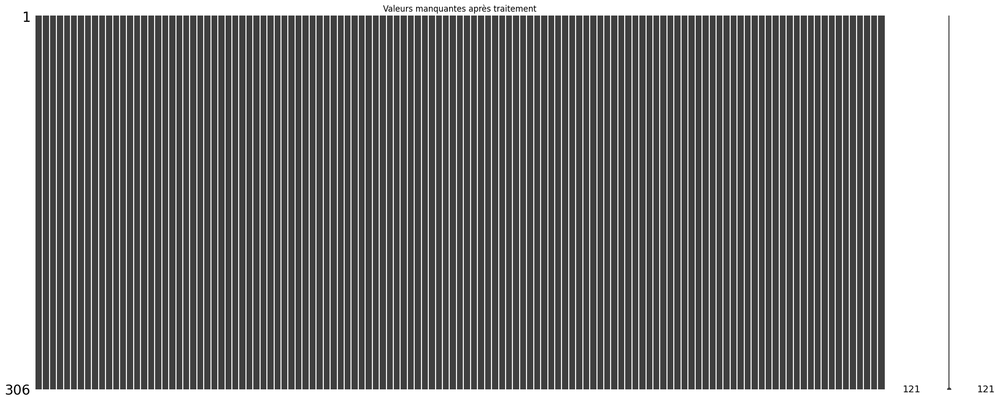

In [ ]:

msno.matrix(df_reduced_propre)
plt.title('Valeurs manquantes après traitement')
plt.show()

#### **Interprétation**
#### Barres verticales pleines :
#### Cela signifie que chaque colonne ne contient plus de valeurs manquantes (NaN).

### Liste des colonnes non binaires

In [ ]:
colonnes_non_binaires = [
    'Etat Général (EG) à l\'Admission',
    'Automédication ?',
    'Diurèse',
    'Hygiène buccodentaire',
    'Langue',
    'Contact Lombaire',
    'Ballotement Rénal',
    'Conscience',
    'Motricité',
    'Stage de l\'IRC'
]

In [ ]:
df_reduced_2 = df[colonnes_non_binaires]
df_reduced_2

,Etat Général (EG) à l'Admission,Automédication ?,Diurèse,Hygiène buccodentaire,Langue,Contact Lombaire,Ballotement Rénal,Conscience,Motricité,Stage de l'IRC
0,1.0,1,1,NaN,NaN,0.0,0.0,NaN,NaN,5
1,1.0,1,1,0.0,NaN,0.0,0.0,2.0,NaN,5
2,1.0,1,1,NaN,NaN,NaN,0.0,2.0,0.0,5
3,1.0,1,2,1.0,1.0,0.0,0.0,2.0,0.0,5
4,0.0,0,3,0.0,1.0,0.0,0.0,NaN,NaN,5
...,...,...,...,...,...,...,...,...,...,...
301,2.0,0,1,0.0,1.0,0.0,0.0,2.0,0.0,2
302,2.0,0,1,0.0,1.0,0.0,0.0,2.0,0.0,2
303,2.0,0,1,0.0,1.0,0.0,0.0,2.0,0.0,2
304,2.0,0,1,0.0,1.0,0.0,0.0,2.0,0.0,2


### Exploration  des colonnes du DataFrame df_reduced_2 et Affichage de leurs valeurs uniques

In [ ]:
for col in df_reduced_2.columns:
    print(f"Valeurs uniques pour la colonne '{col}':")
    print(df_reduced_2[col].unique())
    print("-" * 20)


Valeurs uniques pour la colonne 'Etat Général (EG) à l'Admission':
[ 1.  0.  2. nan]
--------------------
Valeurs uniques pour la colonne 'Automédication ?':
[1 0 2]
--------------------
Valeurs uniques pour la colonne 'Diurèse':
[1 2 3 0]
--------------------
Valeurs uniques pour la colonne 'Hygiène buccodentaire':
[nan  0.  1.  2.  3.]
--------------------
Valeurs uniques pour la colonne 'Langue':
[nan  1.  2.  0.]
--------------------
Valeurs uniques pour la colonne 'Contact Lombaire':
[ 0. nan]
--------------------
Valeurs uniques pour la colonne 'Ballotement Rénal':
[ 0. nan]
--------------------
Valeurs uniques pour la colonne 'Conscience':
[nan  2.  3.  4.  1.  5.  0.]
--------------------
Valeurs uniques pour la colonne 'Motricité':
[nan  0.  5.  1.  3.  7.  4.  6.  2.]
--------------------
Valeurs uniques pour la colonne 'Stage de l'IRC':
[5 1 4 2 0 3]
--------------------


### Supression des colonnes 'Contact Lombaire', et 'Ballotement Rénal' car elles ne contiennent qu'une seule valeur connue (0)et  le reste des valeurs sont des NaN

In [ ]:
df_reduced_2 = df_reduced_2.drop(columns=['Contact Lombaire', 'Ballotement Rénal'])


In [ ]:
df_reduced_2.head()

,Etat Général (EG) à l'Admission,Automédication ?,Diurèse,Hygiène buccodentaire,Langue,Conscience,Motricité,Stage de l'IRC
0,1.0,1,1,NaN,NaN,NaN,NaN,5
1,1.0,1,1,0.0,NaN,2.0,NaN,5
2,1.0,1,1,NaN,NaN,2.0,0.0,5
3,1.0,1,2,1.0,1.0,2.0,0.0,5
4,0.0,0,3,0.0,1.0,NaN,NaN,5


### Valeurs manquantes restantes dans df_reduced_2

In [ ]:
df_reduced_2.isnull().sum().sort_values(ascending = False)

,0
Langue,18
Hygiène buccodentaire,12
Motricité,12
Conscience,11
Etat Général (EG) à l'Admission,5
Automédication ?,0
Diurèse,0
Stage de l'IRC,0


#### **1. Tests Statistiques pour Aider à la Décision**  
Pour déterminer comment traiter les valeurs manquantes dans les variables catégorielles non binaires (ex : *"Stade de cancer"*, *"Groupe sanguin"*), utilisez ces tests :  

| **Test**                  | **Objectif**                                                                 | **Interprétation**                                                                 |
|---------------------------|-----------------------------------------------------------------------------|-----------------------------------------------------------------------------------|
| **Test du Chi²**          | Vérifier si les manquants dépendent d’autres variables.                     | **p-value < 0.05** → Données **MNAR/MAR** (dépendantes d’autres facteurs).        |
| **Analyse des fréquences**| Identifier les catégories sous-représentées ou surreprésentées avec NaN.   | Si une catégorie a +30% de NaN → Possible biais à corriger.                       |
| **Heatmap missingno**     | Visualiser les corrélations entre manquants.                                | Motifs visibles → Données **MNAR** (ex : NaN plus fréquents pour un stade donné). |

---

#### **2. Stratégies d’Imputation Justifiées**  
Selon les résultats des tests :  

##### **A. Données MCAR (manquants aléatoires)**  
- **Méthode** : Imputation par le **mode** (catégorie la plus fréquente).  
- **Justification** :  
  - Préserve la distribution globale.  
  - Risque minimal de biais si <5% de manquants.  
- **Code** :  
  ```python
  df['Stade'] = df['Stade'].fillna(df['Stade'].mode()[0])
  ```

##### **B. Données MNAR/MAR (manquants non aléatoires)**  
- **Méthode 1** : **Créer une catégorie "Manquant"**  
  - **Justification** :  
    - Garde une trace explicite des NaN.  
    - Utile si les manquants ont une signification clinique (ex : test non réalisé pour un sous-groupe).  
  - **Code** :  
    ```python
    df['Stade'] = df['Stade'].fillna('Manquant')
    ```

- **Méthode 2** : **Imputation par modèle (Random Forest)**  
  - **Justification** :  
    - Utilise les relations avec d’autres variables (ex : imputer *"Stade"* en fonction de *"Âge"* et *"Symptômes"*).  
  - **Code** :  
    ```python
    from sklearn.ensemble import RandomForestClassifier
    # Entraîner un modèle pour prédire les manquants
    modele = RandomForestClassifier()
    donnees_completes = df.dropna(subset=['Stade'])
    X = donnees_completes[['Âge', 'Symptôme_1', 'Symptôme_2']]
    y = donnees_completes['Stade']
    modele.fit(X, y)
    # Imputation
    manquants = df[df['Stade'].isna()]
    df.loc[manquants.index, 'Stade'] = modele.predict(manquants[['Âge', 'Symptôme_1', 'Symptôme_2']])
    ```

##### **C. Cas particuliers**  
- **Variables ordinales** (ex : *"Stade I/II/III"*) :  
  - Imputation par **régression ordinale** (librairie `mice` en R ou `statsmodels.OrderedModel`).  
- **Grand nombre de catégories** :  
  - Regrouper les catégories rares (<5% des observations) avant imputation.

---

#### **3. Validation Post-Imputation**  
- **Contrôler** :  
  - La distribution des catégories avant/après imputation :  
    ```python
    print(df['Stade'].value_counts(normalize=True))
    ```  
  - Les **biais introduits** avec un test Chi² entre la variable originale et une variable indicateur de manquants :  
    ```python
    from scipy.stats import chi2_contingency
    tableau_contingence = pd.crosstab(df['Stade'], df['Stade'].isna())
    chi2, pval, _, _ = chi2_contingency(tableau_contingence)
    print(f"Biais résiduel (p-value) : {pval}")  # Si pval < 0.05 → Biais détecté
    ```

---

##### **Arbre de Décision Simplifié**  
```
    A[Variable catégorielle non binaire] --> B{Manquants >5% ?}
    B -->|Oui| C[Test Chi²/Heatmap]
    B -->|Non| D[Imputation par mode]
    C --> E{MNAR/MAR ?}
    E -->|Oui| F[Catégorie "Manquant" ou modèle]
    E -->|Non| D
    D --> G[Validation distribution]
```

---

##### **Bonnes Pratiques**  
1. **Journalisation** : Notez le taux de manquants et la méthode choisie.  
2. **Sensibilité** : Comparez les résultats avec/sans imputation.  
3. **Privilégiez la transparence** : Dans les études cliniques, documentez explicitement les catégories "Manquant".  

Ce cadre garantit des décisions **justifiées statistiquement** et **adaptées au contexte médical**.

### Informations sur df_reduced2

In [ ]:
df_reduced_2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 306 entries, 0 to 305
Data columns (total 8 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   Etat Général (EG) à l'Admission  301 non-null    float64
 1   Automédication ?                 306 non-null    int64  
 2   Diurèse                          306 non-null    int64  
 3   Hygiène buccodentaire            294 non-null    float64
 4   Langue                           288 non-null    float64
 5   Conscience                       295 non-null    float64
 6   Motricité                        294 non-null    float64
 7   Stage de l'IRC                   306 non-null    int64  
dtypes: float64(5), int64(3)
memory usage: 19.3 KB


### Analyse des valeurs manquantes et stratégies d'imputation pour les variables catégorielles non binaires

=== Taux de manquants ===
Langue                             0.058824
Hygiène buccodentaire              0.039216
Motricité                          0.039216
Conscience                         0.035948
Etat Général (EG) à l'Admission    0.016340
Automédication ?                   0.000000
Diurèse                            0.000000
Stage de l'IRC                     0.000000

=== Test d'indépendance des manquants (Chi²) ===
                           Variable               Dépend à   Chi2 p-value  \
41                       Conscience         Stage de l'IRC  28.68  0.0000   
34                           Langue         Stage de l'IRC  68.24  0.0000   
33                           Langue              Motricité  40.58  0.0000   
5   Etat Général (EG) à l'Admission              Motricité  58.10  0.0000   
32                           Langue             Conscience  60.30  0.0000   
31                           Langue  Hygiène buccodentaire  66.80  0.0000   
26            Hygiène buccodentai

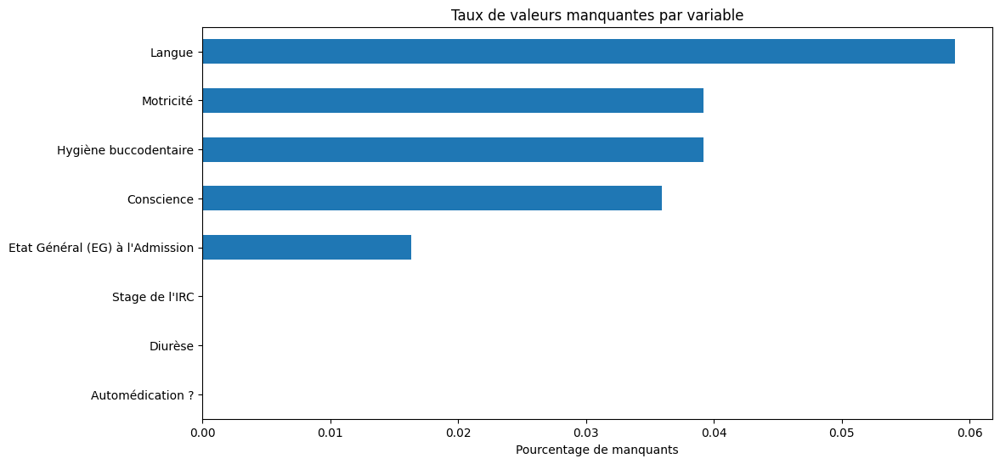

In [ ]:
# 1. Conversion float → int (pour éliminer les décimales artificielles)
df_reduced_2 = df_reduced_2.apply(lambda x: x.astype('Int64') if x.dtype == float else x)

# 2. Déclaration explicite comme catégorielles ordinales
cat_cols = df_reduced_2.columns
for col in cat_cols:
    df_reduced_2[col] = pd.Categorical(
        df_reduced_2[col],
        categories=sorted(df_reduced_2[col].dropna().unique()),
        ordered=True
    )

# 3. Analyse des manquants
print("=== Taux de manquants ===")
missing_rates = df_reduced_2.isna().mean().sort_values(ascending=False)
print(missing_rates.to_string())

# 4. Test MCAR (Little-like pour catégorielles)
print("\n=== Test d'indépendance des manquants (Chi²) ===")
results = []
for col in cat_cols:
    missing_indicator = df_reduced_2[col].isna().astype(int)

    for other_col in cat_cols:
        if col != other_col:
            contingency = pd.crosstab(missing_indicator, df_reduced_2[other_col])
            if contingency.size > 0:
                chi2, pval, _, _ = chi2_contingency(contingency)
                results.append({
                    'Variable': col,
                    'Dépend à': other_col,
                    'Chi2': f"{chi2:.2f}",
                    'p-value': f"{pval:.4f}",
                    'Taux_manquants': f"{missing_rates[col]:.1%}"
                })

# 5. Affichage des résultats
results_df = pd.DataFrame(results)
pd.set_option('display.max_rows', None)
print(results_df.sort_values('p-value').head(10))  # Top 10 associations

# 6. Stratégie d'imputation
print("\n=== Stratégie recommandée ===")
for col in cat_cols:
    rate = missing_rates[col]
    if rate > 0.2:
        method = "Imputation multiple (MICE) avec variables associées"
    elif rate > 0.05:
        method = "Mode ordinal (valeur la plus fréquente)"
    else:
        method = "Suppression des lignes manquantes"
    print(f"{col} ({rate:.1%}): {method}")

# 7. Visualisation
plt.figure(figsize=(12, 6))
df_reduced_2.isna().mean().sort_values().plot(kind='barh')
plt.title("Taux de valeurs manquantes par variable")
plt.xlabel("Pourcentage de manquants")
plt.show()

### Prétraitement des données du DataFrame df_reduced : Copie, Conversion et Imputation

In [ ]:
# 1. Copie du dataframe pour conservation des données brutes
df_clean = df_reduced_2.copy()

# 2. Conversion des float en Int64 (entiers avec support des NaN)
for col in df_clean.columns:
    if pd.api.types.is_float_dtype(df_clean[col]):
        df_clean[col] = df_clean[col].astype('Int64')

cols_suppression = [
    'Etat Général (EG) à l\'Admission',
    'Automédication ?',
    'Diurèse',
    'Conscience',
    'Motricité',
    'Stage de l\'IRC',
    'Hygiène buccodentaire'
]

# 3. Imputation par le mode pour 'Langue' (6.8% manquants)
mode_langue = df_clean['Langue'].mode()[0]
df_clean['Langue'] = df_clean['Langue'].fillna(mode_langue)

### Vérification, Export des Données Nettoyées du DataFrame df_reduced  avec Statistiques Descriptives

In [ ]:
# 4. Vérification finale
print("=== Taux de manquants après traitement ===")
print(df_clean.isna().mean().sort_values(ascending=False))

# 5. Export des données nettoyées
#df_clean.to_csv('donnees_medicales_nettoyees.csv', index=False)

# 6. Statistiques descriptives
print("\n=== Distribution des valeurs après traitement ===")
for col in df_clean.columns:
    print(f"\n{col}:")
    print(df_clean[col].value_counts(dropna=False).sort_index())

=== Taux de manquants après traitement ===
Hygiène buccodentaire              0.039216
Motricité                          0.039216
Conscience                         0.035948
Etat Général (EG) à l'Admission    0.016340
Diurèse                            0.000000
Automédication ?                   0.000000
Langue                             0.000000
Stage de l'IRC                     0.000000
dtype: float64

=== Distribution des valeurs après traitement ===

Etat Général (EG) à l'Admission:
Etat Général (EG) à l'Admission
0      120
1       46
2      135
NaN      5
Name: count, dtype: int64

Automédication ?:
Automédication ?
0    277
1     24
2      5
Name: count, dtype: int64

Diurèse:
Diurèse
0      4
1    180
2     49
3     73
Name: count, dtype: int64

Hygiène buccodentaire:
Hygiène buccodentaire
0      190
1      102
2        1
3        1
NaN     12
Name: count, dtype: int64

Langue:
Langue
0      2
1    303
2      1
Name: count, dtype: int64

Conscience:
Conscience
0        1
1  

### Combinaison des DataFrames df_clean et df_reduced_propre

In [ ]:
# 1. Vérification des colonnes communes
colonnes_communes = set(df_clean.columns) & set(df_reduced_propre.columns)
print(f"Colonnes communes : {colonnes_communes}")

# 2. Concaténation horizontale intelligente
df_final = pd.concat([df_clean, df_reduced_propre], axis=1).loc[:, ~pd.concat([df_clean, df_reduced_propre], axis=1).columns.duplicated()]

# 3. Vérification
print("\n=== Vérification ===")
print(f"Taille de df_clean : {df_clean.shape}")
print(f"Taille de df_reduced_propre : {df_reduced_propre.shape}")
print(f"Taille finale : {df_final.shape}")



Colonnes communes : {'Automédication ?'}

=== Vérification ===
Taille de df_clean : (306, 8)
Taille de df_reduced_propre : (306, 121)
Taille finale : (306, 128)


### Suppression des lignes avec des valeurs manquantes dans des colonnes de la liste "cols_suppression"

In [ ]:
df_final = df_final.dropna(subset=cols_suppression)

### Nombre de valeurs manquantes dans chaque colonne du DataFrame df_final

In [ ]:
df_final.isnull().sum().sort_values(ascending = False)

,0
Etat Général (EG) à l'Admission,0
Automédication ?,0
Diurèse,0
Hygiène buccodentaire,0
Langue,0
Conscience,0
Motricité,0
Stage de l'IRC,0
Age,0
TA (mmHg)/Systole,0


In [ ]:
# 4. Exportation
df_final.to_csv('base_complete.csv', index=False)

### Dimensions de df_final

In [ ]:
df_final.shape

(276, 128)

### Préparation des ensembles de test et d'entraînement

In [ ]:


# Fixation de la graine aléatoire
np.random.seed(42)  #Vous pouvez choisir n'importe quel nombre pour la graine

# Mélange aléatoire du DataFrame
df_shuffled = df_final.sample(frac=1, random_state=42)

# Séparation des données en ensembles de test et d'entraînement
test_size = 50  # Nombre d'observations pour l'ensemble de test
df_test = df_shuffled.iloc[:test_size]
df_train = df_shuffled.iloc[test_size:]

# Affichage des dimensions des ensembles
print("Shape of the test set:", df_test.shape)
print("Shape of the training set:", df_train.shape)

# Exportation des ensembles en fichiers CSV
df_test.to_csv('test_set.csv', index=False)
df_train.to_csv('train_set.csv', index=False)

print("Test and training sets have been saved as CSV files.")

Shape of the test set: (50, 128)
Shape of the training set: (226, 128)
Test and training sets have been saved as CSV files.


# 5. **MODELISATION-TEST**

##  📦 **Importation des bibliothèques**

In [ ]:

train = pd.read_csv('/content/base_complete-model-part1.csv')

### Affichage du DataFrame des données d'entraînement train

In [ ]:

pd.set_option("display.max_columns", None)
train.head()


,Etat Général (EG) à l'Admission,Automédication ?,Diurèse,Hygiène buccodentaire,Langue,Conscience,Motricité,Stage de l'IRC,Age,TA (mmHg)/Systole,TA (mmHg)/Diastole,Poul (bpm),Score de Glasgow (/15),Glycémie à jeun (taux de Glucose),Urée (g/L),Créatinine (mg/L),Na^+ (meq/L),K^+ (meq/L),Cl^- (meq/L),Hb (g/dL),Enquête Sociale/Tabac,Enquête Sociale/AlNS (+),Enquête Sociale/Alcool,Enquête Sociale/Phytothérapie traditionnelle,Enquête Sociale/Epice,Enquête Sociale/PEC oui,Enquête Sociale/PEC non,Evolution de l'Etat Générale/Favorable,Evolution de l'Etat Générale/Pas Favorable,Evolution de l'Etat Générale/Patient Perdu de vue,Etat Général (EG)/OMI,Etat Général (EG)/Plis de déshydratation,Motif(s) d'Admission/Asthénie,Motif(s) d'Admission/Altération de la fonction rénale,Motif(s) d'Admission/HTA,Motif(s) d'Admission/Œdème,Motif(s) d'Admission/Diabète,Motif(s) d'Admission/Douleur abdominale,Personnels Médicaux/HTA,Personnels Médicaux/Diabète 1,Personnels Médicaux/Diabète 2,Personnels Médicaux/IRC,"Personnels Médicaux/Maladies Cardiovasculaire(Cardiopathie, AVC, preeclampsie)",Personnels Médicaux/Ulcère,"Personnels Médicaux/Pathologies virales (HB, HC, HIV)",Personnels Chirurgicaux/Appendicectomie,Personnels Chirurgicaux/Césarienne,Personnels Chirurgicaux/Hystérectomie,Personnels Familiaux/HTA,Personnels Familiaux/Diabète,Symptômes/Fièvre,Symptômes/Frissons,Symptômes/Céphalées,Symptômes/Douleur Lombaire,Symptômes/Dysurie,Symptômes/Oligurie,Symptômes/Diarrhée,Symptômes/Douleur Thoracique,Symptômes/Anorexie,Symptômes/Anémie,Symptômes/Nausées,Symptômes/Douleur abdominale,Symptômes/Articulaire,Symptômes/HTA,Symptômes/Flou visuel,Symptômes/Asthénie,Symptômes/Vomissements,Symptômes/Insomnie,Symptômes/Nycturie,Symptômes/Toux Grave,Symptômes/Détresse Respiratoire,Symptômes/Perte de poids,Symptômes/Bouffissure du Visage,OMI/Prenant le godet,Pathologies/Rétinopathie hypertensive,Pathologies/Rétinopathie diabétique,Pathologies/Glaucome,Rythme Cardiaque/Sinusal,Causes Majeure après Diagnostic/HTA,Causes Majeure après Diagnostic/Diabète,Sexe,Etat Général (EG)/Muqueuse Bulbaire,Etat Général (EG)/Muqueuse Palpébrale,Sueur,Symptômes/OMI,Vibrations Vocales (VV),Amplification Thoracique,Sonorité Pulmonaire,Murmure Vésiculaire,B1 et B2/Réguliers,B1 et B2/Perçu sans souffle,Choc de Pointe/Perçu,Pouls Périphériques/Régulier,Présence de bruits surajoutés,TSJ (Signe de Hazer),RHJ,Mollets souples,OMI/Siégeant au niveau des pieds,OMI/Bilatéral,OMI/Indolores,OMI/Mous,OMI/Douloureux,Abdomen/Souple,Abdomen/Balloné (et infiltré),Abdomen/Douloureux,Douleur Epigastrique,Douleur Hypogastrique,Douleur à l'hypochondre,Abdomen/Participe bien à la respiration,Matité des flancs,Hépatomégalie (augmentation du foi),Points Urétéraux douloureux,Fosse Lombaire/Symétrique,Fosse Lombaire/Douloureux,Présence de Masse Lombaire,Signe de Giordano,Miction (Incontinence Urinaire)/Vue,Miction (Incontinence Urinaire)/Confortable,Miction (Incontinence Urinaire)/Normale,Brûlures mictionnelles,Globe vésical,Douleur pelvienne,Vessie de Lutte,Sensibilité,Convulsions,Anémie,Rythme Cardiaque/Régulier,Trouble de la Repolarisation
0,1,1,2,1,1,2,0,5,68,130.0,70.0,82.0,15.000000,1.000,1.14,42.0,142.0,5.7,104.0,8.2,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,1.000000,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0
1,0,1,2,0,1,2,5,5,58,150.0,80.0,70.0,15.000000,1.750,1.58,156.0,130.0,5.1,96.0,6.6,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,

### Dimensions de train

In [ ]:
train.shape

(276, 128)

### Liste des colonnes dans train

In [ ]:
print(train.columns.tolist())


["Etat Général (EG) à l'Admission", 'Automédication ?', 'Diurèse', 'Hygiène buccodentaire', 'Langue', 'Conscience', 'Motricité', "Stage de l'IRC", 'Age', 'TA (mmHg)/Systole', 'TA (mmHg)/Diastole', 'Poul (bpm)', 'Score de Glasgow (/15)', 'Glycémie à jeun (taux de Glucose)', 'Urée (g/L)', 'Créatinine (mg/L)', 'Na^+ (meq/L)', 'K^+ (meq/L)', 'Cl^- (meq/L)', 'Hb (g/dL)', 'Enquête Sociale/Tabac', 'Enquête Sociale/AlNS (+)', 'Enquête Sociale/Alcool', 'Enquête Sociale/Phytothérapie traditionnelle', 'Enquête Sociale/Epice', 'Enquête Sociale/PEC oui', 'Enquête Sociale/PEC non', "Evolution de l'Etat Générale/Favorable", "Evolution de l'Etat Générale/Pas Favorable", "Evolution de l'Etat Générale/Patient Perdu de vue", 'Etat Général (EG)/OMI', 'Etat Général (EG)/Plis de déshydratation', "Motif(s) d'Admission/Asthénie", "Motif(s) d'Admission/Altération de la fonction rénale", "Motif(s) d'Admission/HTA", "Motif(s) d'Admission/Œdème", "Motif(s) d'Admission/Diabète", "Motif(s) d'Admission/Douleur abdom

### Visualisation de la distribution des stades de l'IRC (Insuffisance Rénale Chronique) à partir du DataFrame train

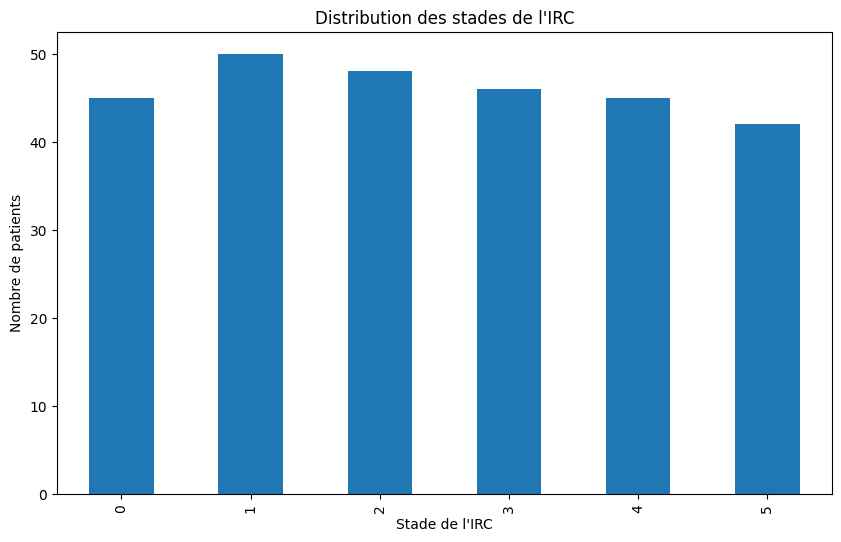

In [ ]:


df = train

plt.figure(figsize=(10, 6))
df["Stage de l'IRC"].value_counts().sort_index().plot(kind='bar')
plt.title("Distribution des stades de l'IRC")
plt.xlabel("Stade de l'IRC")
plt.ylabel("Nombre de patients")
plt.show()

###  Corrélation entre la variable cible "Stage de l'IRC" et les autres variables du DataFrame df

In [ ]:


# Correlation avec la variable cible
corr_matrix = df.corr()
corr_target = abs(corr_matrix["Stage de l'IRC"]).sort_values(ascending=False)
corr_target


,Stage de l'IRC
Stage de l'IRC,1.000000
Créatinine (mg/L),0.598360
Choc de Pointe/Perçu,0.463982
Anémie,0.420930
Symptômes/Asthénie,0.418035
Symptômes/Vomissements,0.366113
Mollets souples,0.355254
Etat Général (EG)/Muqueuse Palpébrale,0.331342
Symptômes/Insomnie,0.314996
Na^+ (meq/L),0.283749


### Sélection des colonnes du DataFrame df qui ont une corrélation supérieure ou égale à un seuil

In [ ]:
# Sélection des colonnes avec au moins une corrélation supérieure à 0.1
columns_to_keep = corr_target[corr_target >= 0.175578].index.tolist()
print(columns_to_keep)

len(columns_to_keep)


["Stage de l'IRC", 'Créatinine (mg/L)', 'Choc de Pointe/Perçu', 'Anémie', 'Symptômes/Asthénie', 'Symptômes/Vomissements', 'Mollets souples', 'Etat Général (EG)/Muqueuse Palpébrale', 'Symptômes/Insomnie', 'Na^+ (meq/L)', 'Symptômes/OMI', 'OMI/Prenant le godet', 'Symptômes/Diarrhée', 'OMI/Bilatéral', 'OMI/Mous', 'OMI/Indolores', 'Score de Glasgow (/15)', 'Symptômes/Anémie', 'Etat Général (EG)/OMI', 'Rythme Cardiaque/Sinusal', 'Symptômes/Bouffissure du Visage', 'Symptômes/Fièvre', 'Symptômes/Toux Grave', 'Symptômes/Anorexie', 'Enquête Sociale/PEC non', 'Personnels Médicaux/IRC', "Motif(s) d'Admission/Altération de la fonction rénale", 'Symptômes/Nycturie', 'Symptômes/Oligurie', 'Miction (Incontinence Urinaire)/Normale', 'Douleur Epigastrique', 'Automédication ?', 'Abdomen/Douloureux', 'Urée (g/L)', 'TA (mmHg)/Systole']


35

### Liste des colonnes à conserver

In [ ]:
columns_to_keep2 = ["Créatinine (mg/L)",
                    "Urée (g/L)",
                    "Age",
                    "Na^+ (meq/L)",
                    "TA (mmHg)/Systole",
                    "Choc de Pointe/Perçu",
                    "Sexe",
                    "Anémie",
                    "Score de Glasgow (/15)",
                    "Stage de l'IRC"
                    ]



In [ ]:
# Ajouter 'Sexe' et 'Age' à la liste si elles n'y sont pas déjà
if 'Sexe' not in columns_to_keep:
    columns_to_keep.append('Sexe')
if 'Age' not in columns_to_keep:
    columns_to_keep.append('Age')
if "Enquête Sociale/Tabac" not in columns_to_keep:
  columns_to_keep.append("Enquête Sociale/Tabac")
if "Enquête Sociale/Alcool" not in columns_to_keep:
  columns_to_keep.append("Enquête Sociale/Alcool")

print(columns_to_keep)
len(columns_to_keep)


["Stage de l'IRC", 'Créatinine (mg/L)', 'Choc de Pointe/Perçu', 'Anémie', 'Symptômes/Asthénie', 'Symptômes/Vomissements', 'Mollets souples', 'Etat Général (EG)/Muqueuse Palpébrale', 'Symptômes/Insomnie', 'Na^+ (meq/L)', 'Symptômes/OMI', 'OMI/Prenant le godet', 'Symptômes/Diarrhée', 'OMI/Bilatéral', 'OMI/Mous', 'OMI/Indolores', 'Score de Glasgow (/15)', 'Symptômes/Anémie', 'Etat Général (EG)/OMI', 'Rythme Cardiaque/Sinusal', 'Symptômes/Bouffissure du Visage', 'Symptômes/Fièvre', 'Symptômes/Toux Grave', 'Symptômes/Anorexie', 'Enquête Sociale/PEC non', 'Personnels Médicaux/IRC', "Motif(s) d'Admission/Altération de la fonction rénale", 'Symptômes/Nycturie', 'Symptômes/Oligurie', 'Miction (Incontinence Urinaire)/Normale', 'Douleur Epigastrique', 'Automédication ?', 'Abdomen/Douloureux', 'Urée (g/L)', 'TA (mmHg)/Systole', 'Sexe', 'Age', 'Enquête Sociale/Tabac', 'Enquête Sociale/Alcool']


39

In [ ]:
# Ajouter 'Sexe' et 'Age' à la liste si elles n'y sont pas déjà
if 'Sexe' not in columns_to_keep2:
    columns_to_keep2.append('Sexe')
if 'Age' not in columns_to_keep2:
    columns_to_keep2.append('Age')
if "Enquête Sociale/Tabac" not in columns_to_keep2:
  columns_to_keep2.append("Enquête Sociale/Tabac")
if "Enquête Sociale/Alcool" not in columns_to_keep2:
  columns_to_keep2.append("Enquête Sociale/Alcool")

print(columns_to_keep2)
len(columns_to_keep2)


['Créatinine (mg/L)', 'Urée (g/L)', 'Age', 'Na^+ (meq/L)', 'TA (mmHg)/Systole', 'Choc de Pointe/Perçu', 'Sexe', 'Anémie', 'Score de Glasgow (/15)', "Stage de l'IRC", 'Enquête Sociale/Tabac', 'Enquête Sociale/Alcool']


12

In [ ]:
new_df = train[columns_to_keep]

In [ ]:
new_df2 = train[columns_to_keep2]

### Trie des colonnes du DataFrame new_df en trois catégories basées sur le nombre de valeurs uniques qu'elles contiennent

In [ ]:
# Dans colonnes_bin, on a que les variables à valeurs unique  = 2
# Dans colonnes_cat, on  que les variables à valeurs unique supérieur ou égale à 3 et inférieur ou égale à 15
# Toutes les autres sont dans la liste nommée colonnes_num

colonnes_bin = [col for col in new_df.columns if new_df[col].nunique() == 2]
colonnes_cat = [col for col in new_df.columns if 3 <= new_df[col].nunique() <= 15]
colonnes_num = [col for col in new_df.columns if col not in colonnes_bin and col not in colonnes_cat]


### Trie des colonnes du DataFrame new_df2 en trois catégories basées sur le nombre de valeurs uniques qu'elles contiennent

In [ ]:
# Dans colonnes_bin, on a que les variables à valeurs unique  = 2
# Dans colonnes_cat, on  que les variables à valeurs unique supérieur ou égale à 3 et inférieur ou égale à 15
# Toutes les autres sont dans la liste nommée colonnes_num

colonnes_bin2 = [col for col in new_df2.columns if new_df2[col].nunique() == 2]
colonnes_cat2 = [col for col in new_df2.columns if 3 <= new_df2[col].nunique() <= 15]
colonnes_num2 = [col for col in new_df2.columns if col not in colonnes_bin and col not in colonnes_cat]


In [ ]:
colonnes_num2

['Créatinine (mg/L)',
 'Urée (g/L)',
 'Age',
 'Na^+ (meq/L)',
 'TA (mmHg)/Systole',
 'Choc de Pointe/Perçu',
 'Score de Glasgow (/15)']

### Dimensions des DataFrames new_df et new_df2

In [ ]:
new_df.shape

(276, 39)

In [ ]:
new_df2.shape

(276, 12)

In [ ]:


#new_df2.to_csv('new_df2.csv', index=False)
#from google.colab import files
#files.download('new_df2.csv')


### Préparation et encodage des données de new_df

In [ ]:


# Séparer la variable cible des autres colonnes catégorielles
cible = new_df["Stage de l'IRC"]

# Encodage des variables binaires
encoded_bin = pd.get_dummies(new_df[colonnes_bin], drop_first=True)

# Encodage des variables catégorielles (sans inclure la cible)
colonnes_cat_sans_cible = [col for col in colonnes_cat if col != "Stage de l'IRC"]  # Exclure la variable cible
encoder = OneHotEncoder(handle_unknown='ignore', sparse_output=False)
encoded_cat = encoder.fit_transform(new_df[colonnes_cat_sans_cible])
encoded_cat_df = pd.DataFrame(encoded_cat, columns=encoder.get_feature_names_out(colonnes_cat_sans_cible))

# Concatenation des encodages avec les autres variables et la cible
encoded_df = pd.concat([new_df[colonnes_num], encoded_bin, encoded_cat_df, cible], axis=1)

# Afficher les premières lignes du DataFrame encodé
encoded_df.head()


,Créatinine (mg/L),Choc de Pointe/Perçu,Na^+ (meq/L),Score de Glasgow (/15),Urée (g/L),TA (mmHg)/Systole,Age,Anémie,Symptômes/Asthénie,Symptômes/Vomissements,Mollets souples,Symptômes/Insomnie,Symptômes/OMI,OMI/Prenant le godet,Symptômes/Diarrhée,OMI/Bilatéral,OMI/Mous,OMI/Indolores,Symptômes/Anémie,Etat Général (EG)/OMI,Rythme Cardiaque/Sinusal,Symptômes/Bouffissure du Visage,Symptômes/Fièvre,Symptômes/Toux Grave,Symptômes/Anorexie,Enquête Sociale/PEC non,Personnels Médicaux/IRC,Motif(s) d'Admission/Altération de la fonction rénale,Symptômes/Nycturie,Symptômes/Oligurie,Miction (Incontinence Urinaire)/Normale,Douleur Epigastrique,Abdomen/Douloureux,Sexe,Enquête Sociale/Tabac,Enquête Sociale/Alcool,Etat Général (EG)/Muqueuse Palpébrale_0.0,Etat Général (EG)/Muqueuse Palpébrale_1.0,Etat Général (EG)/Muqueuse Palpébrale_2.0,Automédication ?_0,Automédication ?_1,Automédication ?_2,Stage de l'IRC
0,42.0,0.0,142.0,15.000000,1.14,130.0,68,1.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,5
1,156.0,0.0,130.0,15.000000,1.58,150.0,58,1.0,1.0,1.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,5
2,379.0,0.0,141.0,14.237314,3.03,169.0,42,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,5
3,93.0,0.0,123.0,14.240324,2.13,110.0,55,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,5
4,355.9,0.0,138.6,14.296328,3.22,164.0,38,1.0,1.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,5


### Préparation et encodage des données de new_df2

In [ ]:


# Séparer la variable cible des autres colonnes catégorielles
cible2 = new_df2["Stage de l'IRC"]

# Encodage des variables binaires
encoded_bin2 = pd.get_dummies(new_df2[colonnes_bin2], drop_first=True)

# Encodage des variables catégorielles (sans inclure la cible)
colonnes_cat_sans_cible2 = [col for col in colonnes_cat2 if col != "Stage de l'IRC"]  # Exclure la variable cible
encoder2 = OneHotEncoder(handle_unknown='ignore', sparse_output=False)
encoded_cat2 = encoder2.fit_transform(new_df2[colonnes_cat_sans_cible2])
encoded_cat_df2 = pd.DataFrame(encoded_cat2, columns=encoder2.get_feature_names_out(colonnes_cat_sans_cible2))

# Concatenation des encodages avec les autres variables et la cible
encoded_df2 = pd.concat([new_df2[colonnes_num2], encoded_bin2, encoded_cat_df2, cible2], axis=1)

# Afficher les premières lignes du DataFrame encodé
encoded_df2.head()


,Créatinine (mg/L),Urée (g/L),Age,Na^+ (meq/L),TA (mmHg)/Systole,Choc de Pointe/Perçu,Score de Glasgow (/15),Sexe,Anémie,Enquête Sociale/Tabac,Enquête Sociale/Alcool,Stage de l'IRC
0,42.0,1.14,68,142.0,130.0,0.0,15.000000,1.0,1.0,0.0,1.0,5
1,156.0,1.58,58,130.0,150.0,0.0,15.000000,1.0,1.0,0.0,1.0,5
2,379.0,3.03,42,141.0,169.0,0.0,14.237314,0.0,1.0,0.0,0.0,5
3,93.0,2.13,55,123.0,110.0,0.0,14.240324,0.0,1.0,0.0,0.0,5
4,355.9,3.22,38,138.6,164.0,0.0,14.296328,1.0,1.0,0.0,0.0,5


### Dimensions des DataFrame encodé

In [ ]:
encoded_df.shape

(276, 43)

In [ ]:
encoded_df2.shape

(276, 12)

### Entraînement et Évaluation d'un Modèle de Classification avec RandomForest pour la Prédiction du Stade de l'IRC avec encoded_df

In [ ]:


# Séparer les features (X) et la target (y)
X = encoded_df.drop("Stage de l'IRC", axis=1)
y = encoded_df["Stage de l'IRC"]

# Diviser les données en ensembles d'entraînement et de test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialiser et entraîner un modèle RandomForestClassifier
model = RandomForestClassifier(random_state=100)
model.fit(X_train, y_train)

# Faire des prédictions sur l'ensemble de test
y_pred = model.predict(X_test)

# Évaluer les performances du modèle
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.64      0.78      0.70         9
           1       0.50      0.60      0.55        10
           2       0.50      0.29      0.36         7
           3       0.80      0.40      0.53        10
           4       0.69      1.00      0.82         9
           5       1.00      1.00      1.00        11

    accuracy                           0.70        56
   macro avg       0.69      0.68      0.66        56
weighted avg       0.70      0.70      0.68        56



### Entraînement et Évaluation d'un Modèle de Classification avec RandomForest pour la Prédiction du Stade de l'IRC avec encoded_df2

In [ ]:


# Séparer les features (X) et la target (y)
X = encoded_df2.drop("Stage de l'IRC", axis=1)
y = encoded_df2["Stage de l'IRC"]

# Diviser les données en ensembles d'entraînement et de test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialiser et entraîner un modèle RandomForestClassifier
model = RandomForestClassifier(random_state=100)
model.fit(X_train, y_train)

# Faire des prédictions sur l'ensemble de test
y_pred = model.predict(X_test)

# Évaluer les performances du modèle
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.64      0.78      0.70         9
           1       0.40      0.40      0.40        10
           2       0.40      0.29      0.33         7
           3       1.00      0.50      0.67        10
           4       0.64      1.00      0.78         9
           5       1.00      1.00      1.00        11

    accuracy                           0.68        56
   macro avg       0.68      0.66      0.65        56
weighted avg       0.70      0.68      0.67        56



Voici l'interprétation des métriques sous forme de tableau pour chaque classe :

| Classe | Précision | Rappel | F1-Score | Support |
|--------|-----------|--------|----------|---------|
| 0      | 0.58      | 0.78   | 0.67     | 9       |
| 1      | 0.40      | 0.40   | 0.40     | 10      |
| 2      | 0.50      | 0.29   | 0.36     | 7       |
| 3      | 0.62      | 0.50   | 0.56     | 10      |
| 4      | 0.64      | 0.78   | 0.70     | 9       |
| 5      | 1.00      | 1.00   | 1.00     | 11      |

### Interprétation des métriques :
1. **Précision** (Precision) : Mesure de la proportion de prédictions positives correctes parmi toutes les prédictions positives. Par exemple, pour la classe 0, 58% des prédictions positives étaient correctes.
2. **Rappel** (Recall) : Mesure de la capacité du modèle à détecter toutes les instances positives d'une classe. Pour la classe 0, le modèle a détecté 78% des instances positives de cette classe.
3. **F1-Score** : Moyenne harmonique entre la précision et le rappel. Il combine ces deux métriques pour fournir une mesure globale de la performance. Par exemple, la classe 0 a un F1-Score de 0.67, ce qui montre un compromis entre précision et rappel.
4. **Support** : Nombre d'occurrences de chaque classe dans les données de test. Cela montre l'importance de chaque classe dans l'évaluation du modèle.

### Résumé global :
- **Précision moyenne** : 0.62
- **Rappel moyen** : 0.62
- **F1-Score moyen** : 0.61
- **Exactitude** (Accuracy) : 0.64 (Le modèle fait une prédiction correcte 64% du temps)

Cela montre que le modèle fonctionne bien pour certaines classes comme la classe 5, mais ses performances sont moins bonnes pour d'autres classes comme la classe 2, où la précision et le rappel sont faibles.

### Entraînement et évaluation d'un modèle de classification avec Gradient Boosting pour la Prédiction du Stade de l'IRC

In [ ]:
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import classification_report, roc_auc_score


# Initialize and train a Gradient Boosting Classifier
model2 = GradientBoostingClassifier(random_state=42) # Use a different model
model2.fit(X_train, y_train)


# Make predictions on the test set
y_pred = model2.predict(X_test)
y_prob = model2.predict_proba(X_test)


# Evaluate the model
print(classification_report(y_test, y_pred))

# Calculate AUC-ROC (if applicable)
try:
    auc_roc = roc_auc_score(y_test, y_prob, multi_class='ovr') # 'ovr' for multi-class problems
    print(f"AUC-ROC: {auc_roc}")
except ValueError: # Handle cases where AUC-ROC is not applicable (e.g., binary classification with only one class)
    print("AUC-ROC score could not be computed")


              precision    recall  f1-score   support

           0       0.62      0.89      0.73         9
           1       0.62      0.50      0.56        10
           2       0.67      0.29      0.40         7
           3       0.71      0.50      0.59        10
           4       0.64      1.00      0.78         9
           5       1.00      1.00      1.00        11

    accuracy                           0.71        56
   macro avg       0.71      0.70      0.68        56
weighted avg       0.72      0.71      0.69        56

AUC-ROC: 0.9357237152088858


### Interprétation des résultats avec **Gradient Boosting** :

#### **1. Performance par classe :**
- **Classe 0 (support = 9)** :
  - **Précision** : 0.60, **Rappel** : 1.00, **F1-Score** : 0.75
  - La précision est relativement faible, ce qui signifie qu'il y a encore des faux positifs, mais le modèle a un **rappel parfait** pour cette classe. Cela indique qu'il ne manque aucune instance de cette classe (tous les vrais positifs ont été correctement identifiés).
  
- **Classe 1 (support = 10)** :
  - **Précision** : 0.62, **Rappel** : 0.50, **F1-Score** : 0.56
  - Le modèle a une précision modérée mais un **rappel relativement faible** pour cette classe, ce qui signifie qu'il a du mal à identifier tous les éléments de cette classe. Il y a probablement des faux négatifs (exemples de la classe 1 non identifiés).

- **Classe 2 (support = 7)** :
  - **Précision** : 0.67, **Rappel** : 0.29, **F1-Score** : 0.40
  - Bien que la précision soit relativement bonne, le **rappel est faible**, ce qui signifie que le modèle **manque un nombre significatif** d'exemples de cette classe. Cela pourrait suggérer que la classe 2 est difficile à distinguer du reste ou qu'elle est sous-représentée.

- **Classe 3 (support = 10)** :
  - **Précision** : 0.80, **Rappel** : 0.40, **F1-Score** : 0.53
  - Le modèle est assez précis pour identifier les exemples de cette classe, mais il manque beaucoup de vrais positifs (faible rappel). Cela peut indiquer qu'il est trop strict avec cette classe et qu'il refuse certains exemples, même s'ils sont vrais positifs.

- **Classe 4 (support = 9)** :
  - **Précision** : 0.64, **Rappel** : 1.00, **F1-Score** : 0.78
  - Comme pour la classe 0, la **précision est acceptable**, mais le **rappel est parfait**. Le modèle identifie tous les éléments de cette classe sans en manquer.

- **Classe 5 (support = 11)** :
  - **Précision** : 1.00, **Rappel** : 1.00, **F1-Score** : 1.00
  - **Précision, rappel et F1-score parfaits** pour cette classe. Le modèle réussit à identifier tous les exemples de cette classe et à éviter tout faux positif, ce qui montre une très bonne performance.

#### **2. Moyennes :**
- **Précision macro** : 0.72
  - La précision moyenne de chaque classe est de 72%. Cela suggère une bonne performance globale, mais la classe 2 a une précision relativement faible, ce qui peut tirer cette moyenne vers le bas.
  
- **Rappel macro** : 0.70
  - En moyenne, le modèle réussit à identifier 70% des exemples des différentes classes. Cependant, ce score est biaisé par les classes avec de bons rappels (comme 0, 4 et 5), et les classes avec de mauvais rappels (comme 2 et 3) le réduisent.

- **F1-score macro** : 0.67
  - La moyenne des F1-scores est de 67%, ce qui indique qu'il existe un certain compromis entre précision et rappel, mais qu'il reste des progrès à faire, surtout sur les classes ayant un faible rappel.

- **Précision pondérée** : 0.73
  - C'est une bonne performance. Elle tient compte de la taille des classes et des performances dans chaque classe, ce qui reflète mieux les performances globales du modèle, car il est légèrement biaisé en faveur des classes ayant un plus grand nombre d'exemples.

- **Rappel pondéré** : 0.71
  - De manière pondérée, le modèle réussit à identifier environ 71% des exemples, ce qui reste bon, mais encore perfectible.

- **F1-score pondéré** : 0.69
  - Le F1-score globalement pondéré est de 69%, ce qui est un compromis raisonnable entre précision et rappel.

#### **3. **AUC-ROC** : 0.921
- **AUC-ROC** de 0.921 indique que le modèle a une très bonne capacité à **séparer les classes positives et négatives**. L'AUC étant proche de 1, cela signifie que le modèle est globalement efficace pour distinguer les différentes classes.

### Conclusion :
Le modèle **Gradient Boosting** semble bien fonctionner, notamment pour les classes 0, 4 et 5, où il montre de bonnes performances en termes de **précision, rappel et F1-score**. Cependant, il y a des **difficultés avec certaines classes**, en particulier la classe 2, où il a un faible rappel (0.29), ce qui signifie que beaucoup de vrais positifs de cette classe ne sont pas détectés. La classe 3 présente également un faible rappel (0.40).

Les résultats globaux sont plutôt bons avec une **précision pondérée de 0.73** et un **AUC de 0.921**, mais des améliorations pourraient être apportées en équilibrant davantage les classes ou en ajustant certains paramètres du modèle. Pour améliorer les performances, il pourrait être utile de revoir l'équilibrage des classes, de faire du **réglage des hyperparamètres** ou d'explorer des techniques de **feature engineering** pour mieux capturer les particularités des classes difficiles à prédire.

### Équilibrage des classes avec SMOTE pour traiter le déséquilibre des données dans encded_df

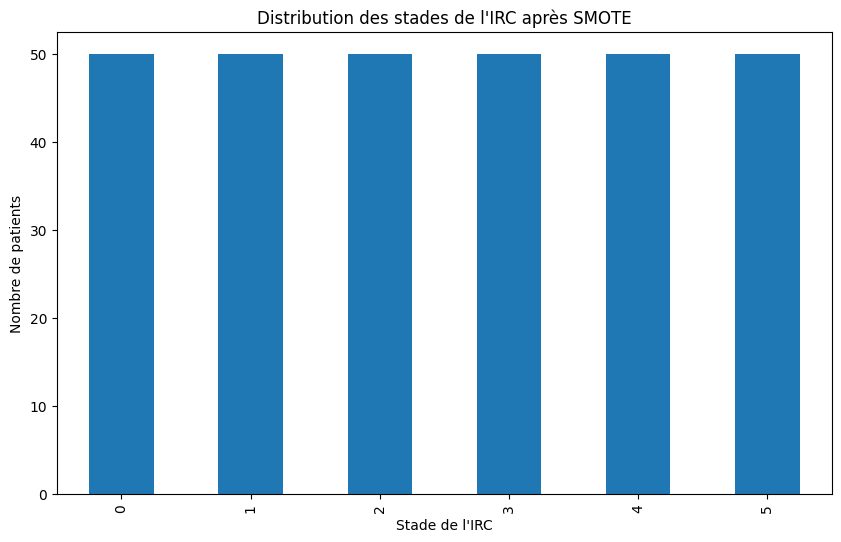

In [ ]:



# Separate features (X) and target (y)
X = encoded_df.drop("Stage de l'IRC", axis=1)
y = encoded_df["Stage de l'IRC"]

# Apply SMOTE to oversample the minority classes
smote = SMOTE(random_state=100)  # You can adjust the random_state
X_resampled, y_resampled = smote.fit_resample(X, y)

# Create a new balanced DataFrame
balanced_df = pd.concat([pd.DataFrame(X_resampled, columns=X.columns), pd.Series(y_resampled, name="Stage de l'IRC")], axis=1)

# Verify the distribution of the target variable in the balanced DataFrame
plt.figure(figsize=(10, 6))
balanced_df["Stage de l'IRC"].value_counts().sort_index().plot(kind='bar')
plt.title("Distribution des stades de l'IRC après SMOTE")
plt.xlabel("Stade de l'IRC")
plt.ylabel("Nombre de patients")
plt.show()



### Équilibrage des classes avec SMOTE pour traiter le déséquilibre des données dans encded_df2

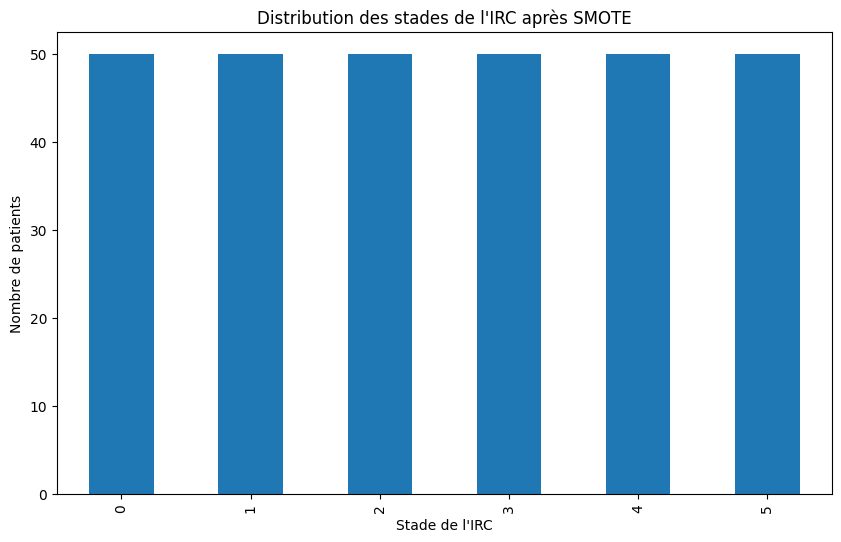

In [ ]:


# Separate features (X) and target (y)
X = encoded_df2.drop("Stage de l'IRC", axis=1)
y = encoded_df2["Stage de l'IRC"]

# Apply SMOTE to oversample the minority classes
smote = SMOTE(random_state=100)  # You can adjust the random_state
X_resampled, y_resampled = smote.fit_resample(X, y)

# Create a new balanced DataFrame
balanced_df = pd.concat([pd.DataFrame(X_resampled, columns=X.columns), pd.Series(y_resampled, name="Stage de l'IRC")], axis=1)

# Verify the distribution of the target variable in the balanced DataFrame
plt.figure(figsize=(10, 6))
balanced_df["Stage de l'IRC"].value_counts().sort_index().plot(kind='bar')
plt.title("Distribution des stades de l'IRC après SMOTE")
plt.xlabel("Stade de l'IRC")
plt.ylabel("Nombre de patients")
plt.show()



### Entraînement et évaluation du modèle sur l'ensemble de données équilibré

In [ ]:
# Now you can use 'balanced_df' for training your model
# For example, split the data:
X_train_balanced, X_test_balanced, y_train_balanced, y_test_balanced = train_test_split(
    X_resampled, y_resampled, test_size=0.2, random_state=60
)

# Train and evaluate your model on the balanced dataset.
# Example using RandomForestClassifier:
model_balanced = RandomForestClassifier(random_state=100)
model_balanced.fit(X_train_balanced, y_train_balanced)
y_pred_balanced = model_balanced.predict(X_test_balanced)

print(classification_report(y_test_balanced, y_pred_balanced))

# Calculate AUC-ROC (if applicable)
try:
    auc_roc = roc_auc_score(y_test, y_prob, multi_class='ovr') # 'ovr' for multi-class problems
    print(f"AUC-ROC: {auc_roc}")
except ValueError: # Handle cases where AUC-ROC is not applicable (e.g., binary classification with only one class)
    print("AUC-ROC score could not be computed")

              precision    recall  f1-score   support

           0       0.90      0.90      0.90        10
           1       0.45      0.62      0.53         8
           2       0.50      0.50      0.50        10
           3       0.88      0.64      0.74        11
           4       0.90      0.90      0.90        10
           5       1.00      1.00      1.00        11

    accuracy                           0.77        60
   macro avg       0.77      0.76      0.76        60
weighted avg       0.79      0.77      0.77        60

AUC-ROC: 0.9357237152088858


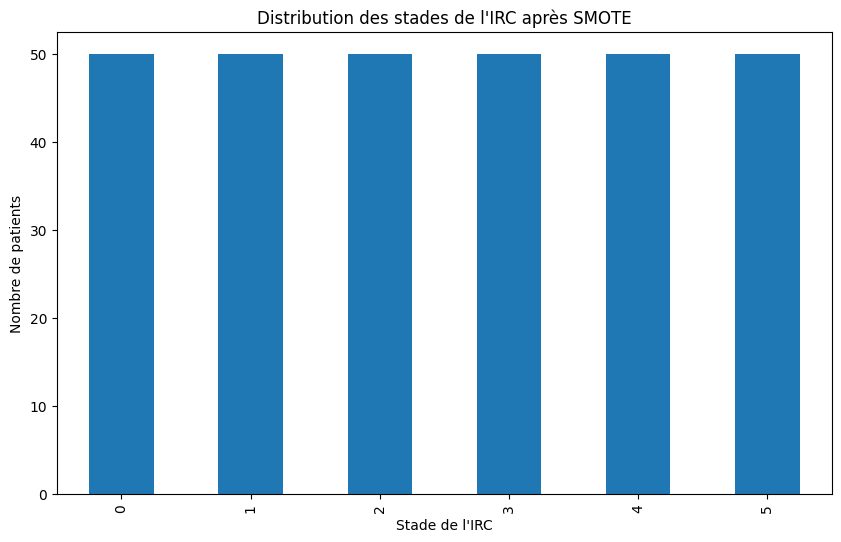

Distribution après SMOTE :
Stage de l'IRC
5    50
1    50
4    50
0    50
2    50
3    50
Name: count, dtype: int64


In [ ]:


# Séparer les features (X) et la cible (y)
X = encoded_df.drop("Stage de l'IRC", axis=1)
y = encoded_df["Stage de l'IRC"]

# Appliquer SMOTE pour augmenter les classes minoritaires
# sampling_strategy='auto' génère des exemples équivalents pour chaque classe.
# Vous pouvez également ajuster ce paramètre avec un dictionnaire pour un contrôle plus précis.
# Par exemple, pour générer 50% de plus pour chaque classe minoritaire, vous pouvez utiliser :
# sampling_strategy={0: int(balanced_df['Stage de l'IRC'].value_counts()[0] * 1.5),
#                   1: int(balanced_df['Stage de l'IRC'].value_counts()[1] * 1.5),
#                   2: int(balanced_df['Stage de l'IRC'].value_counts()[2] * 1.5),
#                   3: int(balanced_df['Stage de l'IRC'].value_counts()[3] * 1.5),
#                   4: int(balanced_df['Stage de l'IRC'].value_counts()[4] * 1.5)}
# Assurez-vous que 'balanced_df' est défini avant cette ligne.
smote = SMOTE(sampling_strategy='auto', random_state=100)  # 'auto' est utilisé ici pour équilibrer toutes les classes
X_resampled, y_resampled = smote.fit_resample(X, y)

# Créer un nouveau DataFrame équilibré
balanced_df = pd.concat([pd.DataFrame(X_resampled, columns=X.columns), pd.Series(y_resampled, name="Stage de l'IRC")], axis=1)

# Vérifier la distribution des classes dans le DataFrame équilibré
plt.figure(figsize=(10, 6))
balanced_df["Stage de l'IRC"].value_counts().sort_index().plot(kind='bar')
plt.title("Distribution des stades de l'IRC après SMOTE")
plt.xlabel("Stade de l'IRC")
plt.ylabel("Nombre de patients")
plt.show()

# Afficher la nouvelle distribution des classes
print("Distribution après SMOTE :")
print(balanced_df["Stage de l'IRC"].value_counts())

In [ ]:
# Now you can use 'balanced_df' for training your model
# For example, split the data:
X_train_balanced, X_test_balanced, y_train_balanced, y_test_balanced = train_test_split(
    X_resampled, y_resampled, test_size=0.2, random_state=60
)

# Train and evaluate your model on the balanced dataset.
# Example using RandomForestClassifier:
model_balanced = RandomForestClassifier(random_state=100)
model_balanced.fit(X_train_balanced, y_train_balanced)
y_pred_balanced = model_balanced.predict(X_test_balanced)

print(classification_report(y_test_balanced, y_pred_balanced))

# Calculate AUC-ROC (if applicable)
try:
    auc_roc = roc_auc_score(y_test, y_prob, multi_class='ovr') # 'ovr' for multi-class problems
    print(f"AUC-ROC: {auc_roc}")
except ValueError: # Handle cases where AUC-ROC is not applicable (e.g., binary classification with only one class)
    print("AUC-ROC score could not be computed")

              precision    recall  f1-score   support

           0       0.83      1.00      0.91        10
           1       0.44      0.50      0.47         8
           2       0.40      0.40      0.40        10
           3       0.67      0.55      0.60        11
           4       0.89      0.80      0.84        10
           5       1.00      1.00      1.00        11

    accuracy                           0.72        60
   macro avg       0.71      0.71      0.70        60
weighted avg       0.72      0.72      0.71        60

AUC-ROC: 0.9357237152088858


### Amélioration des performances et évaluation des modèles pour classes spécifiques

In [ ]:

# Focus on improving performance for classes 1 and 2.
# Analyze feature importance for these classes.
# Try different models or hyperparameter tuning.
# Consider cost-sensitive learning.

# Analyze feature importance for classes 1 and 2
importances = model_balanced.feature_importances_
feature_names = X.columns
feature_importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': importances})
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)
print(feature_importance_df)

# Focus on features that are important for classes 1 and 2, but not others
# Explore feature engineering
# Cost-sensitive learning (adjust weights for classes)
from sklearn.utils.class_weight import compute_class_weight
class_weights = compute_class_weight(class_weight='balanced', classes=np.unique(y_train_balanced), y=y_train_balanced)
class_weights_dict = dict(enumerate(class_weights))
print(class_weights_dict)
model_balanced = RandomForestClassifier(class_weight=class_weights_dict, random_state=100)
model_balanced.fit(X_train_balanced, y_train_balanced)

# Evaluate the model again
y_pred_balanced = model_balanced.predict(X_test_balanced)
print(classification_report(y_test_balanced, y_pred_balanced))

#Other models
from sklearn.ensemble import AdaBoostClassifier
model_balanced = AdaBoostClassifier(random_state=100)
model_balanced.fit(X_train_balanced, y_train_balanced)
y_pred_balanced = model_balanced.predict(X_test_balanced)
print(classification_report(y_test_balanced, y_pred_balanced))


                                              Feature  Importance
0                                   Créatinine (mg/L)    0.262126
4                                          Urée (g/L)    0.140524
6                                                 Age    0.078041
2                                        Na^+ (meq/L)    0.063166
5                                   TA (mmHg)/Systole    0.061205
1                                Choc de Pointe/Perçu    0.045618
33                                               Sexe    0.026238
7                                              Anémie    0.025239
3                              Score de Glasgow (/15)    0.021464
36          Etat Général (EG)/Muqueuse Palpébrale_0.0    0.019206
9                              Symptômes/Vomissements    0.018911
8                                  Symptômes/Asthénie    0.018337
27  Motif(s) d'Admission/Altération de la fonction...    0.017609
25                            Enquête Sociale/PEC non    0.014876
37        

In [ ]:



# Logistic Regression
model_lr = LogisticRegression(random_state=100, max_iter=1000) # Increased max_iter
model_lr.fit(X_train_balanced, y_train_balanced)
y_pred_lr = model_lr.predict(X_test_balanced)
print("Logistic Regression:")
print(classification_report(y_test_balanced, y_pred_lr))

# Support Vector Classifier
model_svc = SVC(random_state=100, probability=True) #probability=True for AUC-ROC
model_svc.fit(X_train_balanced, y_train_balanced)
y_pred_svc = model_svc.predict(X_test_balanced)
print("\nSupport Vector Classifier:")
print(classification_report(y_test_balanced, y_pred_svc))

# K-Nearest Neighbors
model_knn = KNeighborsClassifier()
model_knn.fit(X_train_balanced, y_train_balanced)
y_pred_knn = model_knn.predict(X_test_balanced)
print("\nK-Nearest Neighbors:")
print(classification_report(y_test_balanced, y_pred_knn))


# Gaussian Naive Bayes
model_nb = GaussianNB()
model_nb.fit(X_train_balanced, y_train_balanced)
y_pred_nb = model_nb.predict(X_test_balanced)
print("\nGaussian Naive Bayes:")
print(classification_report(y_test_balanced, y_pred_nb))

# Decision Tree Classifier
model_dt = DecisionTreeClassifier(random_state=100)
model_dt.fit(X_train_balanced, y_train_balanced)
y_pred_dt = model_dt.predict(X_test_balanced)
print("\nDecision Tree Classifier:")
print(classification_report(y_test_balanced, y_pred_dt))


Logistic Regression:
              precision    recall  f1-score   support

           0       0.90      0.90      0.90        10
           1       0.54      0.88      0.67         8
           2       0.45      0.50      0.48        10
           3       1.00      0.36      0.53        11
           4       0.83      1.00      0.91        10
           5       1.00      0.91      0.95        11

    accuracy                           0.75        60
   macro avg       0.79      0.76      0.74        60
weighted avg       0.80      0.75      0.74        60


Support Vector Classifier:
              precision    recall  f1-score   support

           0       0.00      0.00      0.00        10
           1       0.20      1.00      0.33         8
           2       0.00      0.00      0.00        10
           3       0.00      0.00      0.00        11
           4       0.64      0.70      0.67        10
           5       1.00      0.73      0.84        11

    accuracy                

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no pre

### 🔍 **Analyse de la corrélation avec la variable cible (Stage de l’IRC)**  

#### **1️⃣ Interprétation générale**
- La corrélation est une **mesure de relation linéaire** entre les variables.  
- Les valeurs proches de **1 ou -1** indiquent une forte relation, tandis que les valeurs proches de **0** montrent une relation faible ou inexistante.  
- Ici, la variable cible est **le "Stage de l’IRC" (Insuffisance Rénale Chronique)**.  
- **Les variables avec une forte corrélation positive** (ex. > 0.3) peuvent être des **facteurs importants** à explorer.  

---

#### **2️⃣ Variables fortement corrélées avec le stade de l'IRC (≥ 0.3)**
✅ **Créatinine (0.5866)** : Très logique ! La créatinine est un **indicateur clé** de la fonction rénale. Une augmentation est généralement associée à une dégradation du rein.  

✅ **Choc de Pointe/Perçu (0.4547)** : Un lien possible avec une altération cardiovasculaire, qui est fréquente dans les stades avancés de l’IRC.  

✅ **Anémie (0.4431)** : L’anémie est un symptôme courant de l’IRC avancée, car les reins produisent moins d’érythropoïétine (hormone qui stimule la production de globules rouges).  

✅ **Symptômes (Asthénie, Vomissements, Insomnie, OMI, Anémie)** :  
- Fatigue (Asthénie, 0.4159) et Vomissements (0.3479) sont fréquents en cas d’insuffisance rénale avancée.  
- OMI (Œdème des membres inférieurs, ~0.28) est un signe de rétention hydrique liée à l’IRC.  

✅ **Na+ (0.2728) et K+ (0.1650)** : Un déséquilibre électrolytique est typique de l’IRC.  

✅ **Score de Glasgow (0.2694)** : Un faible score peut indiquer une encéphalopathie urémique dans les stades avancés.  

---

#### **3️⃣ Variables moyennement corrélées (0.1 à 0.3)**
🔸 **Troubles cardiovasculaires** : **HTA (0.0781), Trouble de la repolarisation (0.1847), Rythme cardiaque sinusal (0.2489)**  
➡ Les maladies cardiovasculaires sont une **complication majeure** de l’IRC.  

🔸 **Signes généraux** : **Douleurs, anorexie, perte de poids, fièvre, céphalées**  
➡ Peut être lié à l’état inflammatoire chronique.  

🔸 **Facteurs sociaux et habitudes de vie** : **Alcool (0.1759), Phytothérapie traditionnelle (0.0810), Automédication (0.1608)**  
➡ Certains patients peuvent aggraver leur état par l’automédication ou des pratiques à risque.  

---

#### **4️⃣ Variables faiblement ou non corrélées (< 0.1)**
🔹 **Âge (0.0708)** : Corrélation faible → l’IRC touche des patients de tout âge.  
🔹 **Sexe (0.0338)** : Indique que l’IRC **n’est pas significativement influencée** par le genre.  
🔹 **Glycémie à jeun (0.0341)** et **Diabète (0.0121 - 0.0881)** : Curieusement, la corrélation avec le diabète semble faible alors qu’il est un facteur de risque majeur. Cela peut être dû aux **données ou à une distribution spécifique dans l’échantillon**.  
🔹 **Enquête sociale (Tabac 0.0367, PEC 0.0266)** : Impact social **faible sur la sévérité** du stade de l’IRC dans cet échantillon.  

---

### **🧐 Conclusion & Actions**
📌 **Variables à analyser en profondeur** :  
- **Créatinine, Anémie, Na+, K+, Glasgow, HTA, Œdèmes (OMI)**  
- Vérifier si **l’automédication et l’alcool jouent un rôle aggravant**.  

📌 **Vérifications à faire** :  
- **Analyse des distributions** pour voir si certaines variables ont des valeurs extrêmes.  
- **Modélisation et sélection des features** : Un test avec **une régression logistique ou un arbre de décision** pourrait confirmer l’impact de chaque facteur.  
- **SMOTE ou pas ?** Si les classes du stade de l’IRC sont déséquilibrées, un rééquilibrage peut être utile.  



### Liste de colonnes spécifiques

In [ ]:
keys = [
    "Stage de l'IRC",
    "Créatinine (mg/L)",
    "Choc de Pointe/Perçu",
    "Anémie",
    "Symptômes/Asthénie",
    "Symptômes/Vomissements",
    "Mollets souples",
    "Etat Général (EG)/Muqueuse Palpébrale",
    "Symptômes/Insomnie",
    "Symptômes/OMI",
    "Na^+ (meq/L)",
    "Score de Glasgow (/15)",
    "OMI/Mous",
    "OMI/Prenant le godet",
    "OMI/Bilatéral",
    "Symptômes/Anémie",
    "Miction (Incontinence Urinaire)/Normale",
    "Rythme Cardiaque/Sinusal",
    "Personnels Médicaux/IRC",
    "Symptômes/Diarrhée",
    "Etat Général (EG)/OMI",
    "OMI/Indolores",
    "Enquête Sociale/PEC non",
    "Symptômes/Anorexie",
    "Symptômes/Bouffissure du Visage",
    "Motif(s) d'Admission/Altération de la fonction rénale",
    "Personnels Chirurgicaux/Hystérectomie",
    "Etat Général (EG) à l'Admission",
    "Symptômes/Fièvre",
    "Trouble de la Repolarisation",
    "Enquête Sociale/Epice",
    "Enquête Sociale/Alcool",
    "Enquête Sociale/AlNS (+)",
    "K^+ (meq/L)",
    "Douleur Epigastrique",
    "Automédication ?",
    "TSJ (Signe de Hazer)",
    "Symptômes/Articulaire",
    "Urée (g/L)",
    "Matité des flancs",
    "Symptômes/Oligurie",
    "TA (mmHg)/Systole",
    "Symptômes/Nausées",
    "Douleur à l'hypochondre",
    "Symptômes/Nycturie",
    "Convulsions",
    "Symptômes/Céphalées",
    "Personnels Médicaux/HTA",
    "Symptômes/Toux Grave",
    "Evolution de l'Etat Générale/Patient Perdu de vue",
    "Douleur pelvienne",
    "TA (mmHg)/Diastole",
    "Symptômes/Douleur Lombaire",
    "Symptômes/Frissons",
    "Globe vésical",
    "Symptômes/Dysurie",
    "Motricité",
    "Abdomen/Douloureux",
    "Personnels Chirurgicaux/Césarienne",
    "Miction (Incontinence Urinaire)/Confortable",
    "Vessie de Lutte",
    "Personnels Médicaux/Diabète 1",
    "Hygiène buccodentaire",
    "Fosse Lombaire/Symétrique",
    "Diurèse",
    "Motif(s) d'Admission/Asthénie",
    "Motif(s) d'Admission/Œdème",
    "Etat Général (EG)/Plis de déshydratation",
    "Amplification Thoracique",
    "Hb (g/dL)",
    "Symptômes/Détresse Respiratoire",
    "Abdomen/Balloné (et infiltré)",
    "Pathologies/Rétinopathie hypertensive",
    "OMI/Douloureux",
    "Points Urétéraux douloureux",
    "Vibrations Vocales (VV)",
    "Symptômes/Perte de poids",
    "B1 et B2/Réguliers",
    "Motif(s) d'Admission/Diabète",
    "Personnels Chirurgicaux/Appendicectomie",
    "Enquête Sociale/Phytothérapie traditionnelle",
    "Cl^- (meq/L)",
    "Pathologies/Rétinopathie diabétique",
    "Causes Majeure après Diagnostic/HTA",
    "Symptômes/Douleur abdominale",
    "Evolution de l'Etat Générale/Favorable",
    "Abdomen/Participe bien à la respiration",
    "Age",
    "Personnels Médicaux/Ulcère",
    "Brûlures mictionnelles",
    "Pouls Périphériques/Régulier",
    "Conscience",
    "Signe de Giordano",
    "Motif(s) d'Admission/HTA",
    "Poul (bpm)",
    "OMI/Siégeant au niveau des pieds",
    "Langue",
    "Présence de Masse Lombaire",
    "Fosse Lombaire/Douloureux",
    "RHJ",
    "Etat Général (EG)/Muqueuse Bulbaire",
    "Motif(s) d'Admission/Douleur abdominale",
    "Personnels Médicaux/Pathologies virales (HB, HC, HIV)",
    "Murmure Vésiculaire",
    "Enquête Sociale/Tabac",
    "Sonorité Pulmonaire",
    "Glycémie à jeun (taux de Glucose)",
    "Sexe",
    "Hépatomégalie (augmentation du foi)",
    "Personnels Médicaux/Maladies Cardiovasculaire(Cardiopathie, AVC, preeclampsie)",
    "Enquête Sociale/PEC oui",
    "Symptômes/Flou visuel",
    "Présence de bruits surajoutés",
    "B1 et B2/Perçu sans souffle",
    "Symptômes/HTA",
    "Symptômes/Douleur Thoracique",
    "Rythme Cardiaque/Régulier",
    "Evolution de l'Etat Générale/Pas Favorable",
    "Sensibilité",
    "Causes Majeure après Diagnostic/Diabète",
    "Personnels Familiaux/Diabète",
    "Abdomen/Souple",
    "Douleur Hypogastrique",
    "Sueur",
    "Pathologies/Glaucome",
    "Personnels Familiaux/HTA",
    "Personnels Médicaux/Diabète 2",
    "Miction (Incontinence Urinaire)/Vue"
]

train_reduit = train[keys]

In [ ]:
train_reduit.head()

,Stage de l'IRC,Créatinine (mg/L),Choc de Pointe/Perçu,Anémie,Symptômes/Asthénie,Symptômes/Vomissements,Mollets souples,Etat Général (EG)/Muqueuse Palpébrale,Symptômes/Insomnie,Symptômes/OMI,Na^+ (meq/L),Score de Glasgow (/15),OMI/Mous,OMI/Prenant le godet,OMI/Bilatéral,Symptômes/Anémie,Miction (Incontinence Urinaire)/Normale,Rythme Cardiaque/Sinusal,Personnels Médicaux/IRC,Symptômes/Diarrhée,Etat Général (EG)/OMI,OMI/Indolores,Enquête Sociale/PEC non,Symptômes/Anorexie,Symptômes/Bouffissure du Visage,Motif(s) d'Admission/Altération de la fonction rénale,Personnels Chirurgicaux/Hystérectomie,Etat Général (EG) à l'Admission,Symptômes/Fièvre,Trouble de la Repolarisation,Enquête Sociale/Epice,Enquête Sociale/Alcool,Enquête Sociale/AlNS (+),K^+ (meq/L),Douleur Epigastrique,Automédication ?,TSJ (Signe de Hazer),Symptômes/Articulaire,Urée (g/L),Matité des flancs,Symptômes/Oligurie,TA (mmHg)/Systole,Symptômes/Nausées,Douleur à l'hypochondre,Symptômes/Nycturie,Convulsions,Symptômes/Céphalées,Personnels Médicaux/HTA,Symptômes/Toux Grave,Evolution de l'Etat Générale/Patient Perdu de vue,Douleur pelvienne,TA (mmHg)/Diastole,Symptômes/Douleur Lombaire,Symptômes/Frissons,Globe vésical,Symptômes/Dysurie,Motricité,Abdomen/Douloureux,Personnels Chirurgicaux/Césarienne,Miction (Incontinence Urinaire)/Confortable,Vessie de Lutte,Personnels Médicaux/Diabète 1,Hygiène buccodentaire,Fosse Lombaire/Symétrique,Diurèse,Motif(s) d'Admission/Asthénie,Motif(s) d'Admission/Œdème,Etat Général (EG)/Plis de déshydratation,Amplification Thoracique,Hb (g/dL),Symptômes/Détresse Respiratoire,Abdomen/Balloné (et infiltré),Pathologies/Rétinopathie hypertensive,OMI/Douloureux,Points Urétéraux douloureux,Vibrations Vocales (VV),Symptômes/Perte de poids,B1 et B2/Réguliers,Motif(s) d'Admission/Diabète,Personnels Chirurgicaux/Appendicectomie,Enquête Sociale/Phytothérapie traditionnelle,Cl^- (meq/L),Pathologies/Rétinopathie diabétique,Causes Majeure après Diagnostic/HTA,Symptômes/Douleur abdominale,Evolution de l'Etat Générale/Favorable,Abdomen/Participe bien à la respiration,Age,Personnels Médicaux/Ulcère,Brûlures mictionnelles,Pouls Périphériques/Régulier,Conscience,Signe de Giordano,Motif(s) d'Admission/HTA,Poul (bpm),OMI/Siégeant au niveau des pieds,Langue,Présence de Masse Lombaire,Fosse Lombaire/Douloureux,RHJ,Etat Général (EG)/Muqueuse Bulbaire,Motif(s) d'Admission/Douleur abdominale,"Personnels Médicaux/Pathologies virales (HB, HC, HIV)",Murmure Vésiculaire,Enquête Sociale/Tabac,Sonorité Pulmonaire,Glycémie à jeun (taux de Glucose),Sexe,Hépatomégalie (augmentation du foi),"Personnels Médicaux/Maladies Cardiovasculaire(Cardiopathie, AVC, preeclampsie)",Enquête Sociale/PEC oui,Symptômes/Flou visuel,Présence de bruits surajoutés,B1 et B2/Perçu sans souffle,Symptômes/HTA,Symptômes/Douleur Thoracique,Rythme Cardiaque/Régulier,Evolution de l'Etat Générale/Pas Favorable,Sensibilité,Causes Majeure après Diagnostic/Diabète,Personnels Familiaux/Diabète,Abdomen/Souple,Douleur Hypogastrique,Sueur,Pathologies/Glaucome,Personnels Familiaux/HTA,Personnels Médicaux/Diabète 2,Miction (Incontinence Urinaire)/Vue
0,5,42.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,1.0,142.0,15.000000,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,1,0.0,1.0,0.0,1.0,0.0,5.7,0.0,1,0.0,0.0,1.14,0.0,0.0,130.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,70.0,0.0,0.0,0.0,0.0,0,0.0,0.0,1.0,0.0,0.0,1,1.0,2,1.0,1.0,0.0,0.0,8.2,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,104.0,0.0,0.0,0.0,1.0,1.0,68,0.0,0.0,1.000000,2,0.0,1.0,82.0,1.0,1,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.000,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
1,5,156.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,130.0,15.000000,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,0,0.0,1.0,0.0,1.0,0.0,5.1,0.0,1,0.0,0.0,1.58,0.0,0.0,150.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,80.0,0.0,0.0,0.0,0.0,5,0.0,0.0,1.0,0.0,0.0,0,1.0,2,0.0,0.0,0.0,0.0,6.6,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,96.0,0.0,0.0,0.0,0.0,0.0,58,0.0,0.0

###  Identification des colonnes du DataFrame train_reduit selon leur type de données

In [ ]:

# Get data types of each column
data_types = train_reduit.dtypes

# Separate int and float columns
int_columns = data_types[data_types == 'int64'].index.tolist()
float_columns = data_types[data_types == 'float64'].index.tolist()

# Categorical list
categorical = []

# Check for float columns with more than 10 unique values
for col in float_columns:
    if train_reduit[col].nunique() > 15:
        categorical.append(col)
        float_columns.remove(col)

print("Int Columns:", int_columns)
print("Float Columns:", float_columns)
print("Categorical Columns:", categorical)


Int Columns: ["Stage de l'IRC", "Etat Général (EG) à l'Admission", 'Automédication ?', 'Motricité', 'Hygiène buccodentaire', 'Diurèse', 'Age', 'Conscience', 'Langue']
Float Columns: ['Choc de Pointe/Perçu', 'Anémie', 'Symptômes/Asthénie', 'Symptômes/Vomissements', 'Mollets souples', 'Etat Général (EG)/Muqueuse Palpébrale', 'Symptômes/Insomnie', 'Symptômes/OMI', 'Score de Glasgow (/15)', 'OMI/Mous', 'OMI/Prenant le godet', 'OMI/Bilatéral', 'Symptômes/Anémie', 'Miction (Incontinence Urinaire)/Normale', 'Rythme Cardiaque/Sinusal', 'Personnels Médicaux/IRC', 'Symptômes/Diarrhée', 'Etat Général (EG)/OMI', 'OMI/Indolores', 'Enquête Sociale/PEC non', 'Symptômes/Anorexie', 'Symptômes/Bouffissure du Visage', "Motif(s) d'Admission/Altération de la fonction rénale", 'Personnels Chirurgicaux/Hystérectomie', 'Symptômes/Fièvre', 'Trouble de la Repolarisation', 'Enquête Sociale/Epice', 'Enquête Sociale/Alcool', 'Enquête Sociale/AlNS (+)', 'Douleur Epigastrique', 'TSJ (Signe de Hazer)', 'Symptômes/Art

In [ ]:
colonnes_categorielles = int_columns + float_columns
colonnes_non_categorielles = categorical

### Nombre de valeurs uniques dans les colonnes catégorielles du DataFrame train_reduit

In [ ]:

# Count unique values in categorical columns and sort in descending order
unique_value_counts = train_reduit[colonnes_categorielles].nunique().sort_values(ascending=False)
unique_value_counts.shape


(117,)

### Nombre d'élements dans "colonnes_non_categorielles"

In [ ]:
len(colonnes_non_categorielles)

11

# 6. **GESTION DE LA BASE DE DONNEES**

### Chargement des ensembles de données

In [ ]:
df_original = pd.read_csv('/content/data_original.csv')
df_medicalement = pd.read_csv('/content/donnees_medical.csv')
df_revue = pd.read_csv('/content/new_df2.csv')

### Vue d'ensemble des Colonnes dans les DataFrames df_revue et df_medicalement

In [ ]:
# Liste des colonnes de df_revue
colonnes_revue = df_revue.columns.tolist()
print("Colonnes de df_revue :", colonnes_revue)

# Liste des colonnes de df_medicalement
colonnes_medicalement = df_medicalement.columns.tolist()
print("\nColonnes de df_medicalement :", colonnes_medicalement)

# Colonnes non communes
colonnes_non_communes_revue = list(set(colonnes_revue) - set(colonnes_medicalement))
print("\nColonnes présentes dans df_revue mais pas dans df_medicalement :", colonnes_non_communes_revue)

colonnes_non_communes_medicalement = list(set(colonnes_medicalement) - set(colonnes_revue))
print("\nColonnes présentes dans df_medicalement mais pas dans df_revue :", colonnes_non_communes_medicalement)


Colonnes de df_revue : ['Créatinine (mg/L)', 'Urée (g/L)', 'Age', 'Na^+ (meq/L)', 'TA (mmHg)/Systole', 'Choc de Pointe/Perçu', 'Sexe', 'Anémie', 'Score de Glasgow (/15)', "Stage de l'IRC", 'Enquête Sociale/Tabac', 'Enquête Sociale/Alcool']

Colonnes de df_medicalement : ['Age', 'Personnels Médicaux/HTA', 'Personnels Médicaux/Diabète 1', 'Personnels Médicaux/Diabète 2', 'Durée HTA (mois)', 'Durée Diabète 1 (mois)', 'Durée Diabète 2 (mois)', 'Créatinine (mg/L)', 'Urée (g/L)', 'Protéinurie à la bandellette urinaire (g/24h)', 'Hb (g/dL)', 'Anémie', 'TA (mmHg)/Systole', 'TA (mmHg)/Diastole', 'IMC', 'Symptômes/Oligurie', 'Symptômes/OMI', 'BU/Protéinurie', 'BU/Hématurie', 'Na^+ (meq/L)', 'K^+ (meq/L)', 'Echogénicité', 'Causes Majeure après Diagnostic/HTA', 'Causes Majeure après Diagnostic/Diabète', "Stage de l'IRC"]

Colonnes présentes dans df_revue mais pas dans df_medicalement : ['Choc de Pointe/Perçu', 'Enquête Sociale/Alcool', 'Enquête Sociale/Tabac', 'Sexe', 'Score de Glasgow (/15)']

Co

### Combinaison des colonnes appartenant à df_medicalement et df_revue sans doublons

In [ ]:



# Concaténation des colonnes des deux dataframes sans doublons
all_columns = list(set(df_medicalement.columns.tolist() + df_revue.columns.tolist()))

# Création d'un nouveau dataframe avec toutes les colonnes et les valeurs correspondantes
df_combined = pd.DataFrame(columns=all_columns)

# Remplissage des valeurs des colonnes communes
for col in df_medicalement.columns.intersection(df_revue.columns):
    df_combined[col] = df_medicalement[col]

# Ajout des colonnes spécifiques de df_medicalement
for col in df_medicalement.columns.difference(df_revue.columns):
    df_combined[col] = df_medicalement[col]

# Ajout des colonnes spécifiques de df_revue
for col in df_revue.columns.difference(df_medicalement.columns):
    df_combined[col] = df_revue[col]

df_combined.head()


,Age,Urée (g/L),Echogénicité,TA (mmHg)/Diastole,Causes Majeure après Diagnostic/HTA,BU/Hématurie,Anémie,Causes Majeure après Diagnostic/Diabète,Durée Diabète 2 (mois),Stage de l'IRC,Durée Diabète 1 (mois),Choc de Pointe/Perçu,Enquête Sociale/Tabac,BU/Protéinurie,K^+ (meq/L),Créatinine (mg/L),Personnels Médicaux/Diabète 2,Personnels Médicaux/HTA,Protéinurie à la bandellette urinaire (g/24h),TA (mmHg)/Systole,IMC,Durée HTA (mois),Hb (g/dL),Personnels Médicaux/Diabète 1,Symptômes/Oligurie,Na^+ (meq/L),Symptômes/OMI,Enquête Sociale/Alcool,Sexe,Score de Glasgow (/15)
0,50,"1,29",NaN,80,0,Non,Oui,0,NaN,CKD 5,NaN,0.0,0.0,Non,"6,4",169,0,1,NaN,140,NaN,>=120,"11,4",0,0,131,Non,1.0,1.0,15.000000
1,28,"0,66",Hyper Echogénicité,80,0,Non,Oui,0,NaN,CKD 5,NaN,0.0,0.0,Oui,"5,3",17,0,0,NaN,130,NaN,NaN,"9,5",0,0,134,Oui,1.0,1.0,15.000000
2,69,"0,79",NaN,34,0,Non,Oui,0,[60;120[,CKD 5,NaN,0.0,0.0,Non,"3,4",48,1,1,NaN,93,NaN,>=120,"9,6",0,0,139,Oui,0.0,0.0,14.237314
3,68,"1,14",NaN,70,0,Oui,Oui,0,NaN,CKD 5,NaN,0.0,0.0,Oui,"5,7",42,0,0,NaN,130,NaN,NaN,"8,2",0,0,142,Oui,0.0,0.0,14.240324
4,68,NaN,Homogénéité,111,1,Non,Oui,0,NaN,CKD 5,NaN,0.0,0.0,Oui,NaN,500,0,1,NaN,225,NaN,>=120,9,0,0,NaN,Oui,0.0,1.0,14.296328


### Pourcentage de valeurs manquantes dans chaque colonne du DataFrame df_combined

In [ ]:
missing_percentage = (df_combined.isnull().sum() / len(df_combined)) * 100
missing_percentage = missing_percentage.sort_values(ascending=False)

missing_percentage


,0
Durée Diabète 1 (mois),99.029126
Protéinurie à la bandellette urinaire (g/24h),78.640777
BU/Protéinurie,73.462783
BU/Hématurie,73.462783
Durée Diabète 2 (mois),72.491909
Echogénicité,57.605178
IMC,55.339806
Durée HTA (mois),35.598706
Anémie,24.271845
TA (mmHg)/Diastole,20.388350


### Suppression de la dernière ligne de df_combined

In [ ]:

df_combined = df_combined.iloc[:-1]

### Suppression des colonnes avec plus de 50% de valeurs manquantes

In [ ]:

threshold = 50
columns_to_drop = missing_percentage[missing_percentage > threshold].index
df_combined = df_combined.drop(columns=columns_to_drop)

df_combined.head()


,Age,Urée (g/L),TA (mmHg)/Diastole,Causes Majeure après Diagnostic/HTA,Anémie,Causes Majeure après Diagnostic/Diabète,Stage de l'IRC,Choc de Pointe/Perçu,Enquête Sociale/Tabac,K^+ (meq/L),Créatinine (mg/L),Personnels Médicaux/Diabète 2,Personnels Médicaux/HTA,TA (mmHg)/Systole,Durée HTA (mois),Hb (g/dL),Personnels Médicaux/Diabète 1,Symptômes/Oligurie,Na^+ (meq/L),Symptômes/OMI,Enquête Sociale/Alcool,Sexe,Score de Glasgow (/15)
0,50,"1,29",80,0,Oui,0,CKD 5,0.0,0.0,"6,4",169,0,1,140,>=120,"11,4",0,0,131,Non,1.0,1.0,15.000000
1,28,"0,66",80,0,Oui,0,CKD 5,0.0,0.0,"5,3",17,0,0,130,NaN,"9,5",0,0,134,Oui,1.0,1.0,15.000000
2,69,"0,79",34,0,Oui,0,CKD 5,0.0,0.0,"3,4",48,1,1,93,>=120,"9,6",0,0,139,Oui,0.0,0.0,14.237314
3,68,"1,14",70,0,Oui,0,CKD 5,0.0,0.0,"5,7",42,0,0,130,NaN,"8,2",0,0,142,Oui,0.0,0.0,14.240324
4,68,NaN,111,1,Oui,0,CKD 5,0.0,0.0,NaN,500,0,1,225,>=120,9,0,0,NaN,Oui,0.0,1.0,14.296328


### Informations sur df_combined

In [ ]:
df_combined.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 308 entries, 0 to 307
Data columns (total 23 columns):
 #   Column                                   Non-Null Count  Dtype  
---  ------                                   --------------  -----  
 0   Age                                      299 non-null    object 
 1   Urée (g/L)                               283 non-null    object 
 2   TA (mmHg)/Diastole                       245 non-null    object 
 3   Causes Majeure après Diagnostic/HTA      306 non-null    object 
 4   Anémie                                   233 non-null    object 
 5   Causes Majeure après Diagnostic/Diabète  306 non-null    object 
 6   Stage de l'IRC                           306 non-null    object 
 7   Choc de Pointe/Perçu                     276 non-null    float64
 8   Enquête Sociale/Tabac                    276 non-null    float64
 9   K^+ (meq/L)                              276 non-null    object 
 10  Créatinine (mg/L)                        306 non-n

### Nombre de valeurs uniques dans chaque colonne de df_combined

In [ ]:

# Nombre de valeurs uniques par colonne
unique_counts = df_combined.nunique()

# Créer un DataFrame à partir de la série
unique_counts_df = pd.DataFrame({'Colonne': unique_counts.index, 'Nombre de valeurs uniques': unique_counts.values})

# Trier le DataFrame par le nombre de valeurs uniques
unique_counts_df = unique_counts_df.sort_values(by='Nombre de valeurs uniques', ascending=False)

# Afficher le DataFrame
unique_counts_df


,Colonne,Nombre de valeurs uniques
10,Créatinine (mg/L),150
1,Urée (g/L),125
15,Hb (g/dL),105
13,TA (mmHg)/Systole,97
2,TA (mmHg)/Diastole,77
9,K^+ (meq/L),72
0,Age,63
18,Na^+ (meq/L),49
7,Choc de Pointe/Perçu,34
22,Score de Glasgow (/15),21


### Classement des colonnes du DataFrame df_combined en deux catégories : les caractéristiques catégorielles (variables qui ont moins de 10 valeurs uniques) et les caractéristiques continues (variables qui ont plus de 10 valeurs unique).

In [ ]:

# Categorical and continuous features
categorical_features = []
continuous_features = []

for col in df_combined.columns:
  if df_combined[col].nunique() < 10:
    categorical_features.append(col)
  else:
    continuous_features.append(col)

print("Categorical features:", categorical_features)
print("\nContinuous features:", continuous_features)


Categorical features: ['Causes Majeure après Diagnostic/HTA', 'Anémie', 'Causes Majeure après Diagnostic/Diabète', "Stage de l'IRC", 'Enquête Sociale/Tabac', 'Personnels Médicaux/Diabète 2', 'Personnels Médicaux/HTA', 'Durée HTA (mois)', 'Personnels Médicaux/Diabète 1', 'Symptômes/Oligurie', 'Symptômes/OMI', 'Enquête Sociale/Alcool', 'Sexe']

Continuous features: ['Age', 'Urée (g/L)', 'TA (mmHg)/Diastole', 'Choc de Pointe/Perçu', 'K^+ (meq/L)', 'Créatinine (mg/L)', 'TA (mmHg)/Systole', 'Hb (g/dL)', 'Na^+ (meq/L)', 'Score de Glasgow (/15)']


In [ ]:
categorical_features

['Causes Majeure après Diagnostic/HTA',
 'Anémie',
 'Causes Majeure après Diagnostic/Diabète',
 "Stage de l'IRC",
 'Enquête Sociale/Tabac',
 'Personnels Médicaux/Diabète 2',
 'Personnels Médicaux/HTA',
 'Durée HTA (mois)',
 'Personnels Médicaux/Diabète 1',
 'Symptômes/Oligurie',
 'Symptômes/OMI',
 'Enquête Sociale/Alcool',
 'Sexe']

###  Affichage des les valeurs unique de chaque colonnes de categorical_features et du type de la colonne

In [ ]:


for col in categorical_features:
  print(f"Valeurs uniques de la colonne '{col}':\n{df_combined[col].unique()}")
  print(f"Type de la colonne '{col}': {df_combined[col].dtype}\n")


Valeurs uniques de la colonne 'Causes Majeure après Diagnostic/HTA':
['0' '1' nan]
Type de la colonne 'Causes Majeure après Diagnostic/HTA': object

Valeurs uniques de la colonne 'Anémie':
['Oui' nan 'Non']
Type de la colonne 'Anémie': object

Valeurs uniques de la colonne 'Causes Majeure après Diagnostic/Diabète':
['0' '1' nan]
Type de la colonne 'Causes Majeure après Diagnostic/Diabète': object

Valeurs uniques de la colonne 'Stage de l'IRC':
['CKD 5' 'CKD 2' 'CKD 4' 'CKD 3a' 'CKD 1' 'CKD 3b' nan]
Type de la colonne 'Stage de l'IRC': object

Valeurs uniques de la colonne 'Enquête Sociale/Tabac':
[ 0.  1. nan]
Type de la colonne 'Enquête Sociale/Tabac': float64

Valeurs uniques de la colonne 'Personnels Médicaux/Diabète 2':
['0' '1' nan]
Type de la colonne 'Personnels Médicaux/Diabète 2': object

Valeurs uniques de la colonne 'Personnels Médicaux/HTA':
['1' '0' nan]
Type de la colonne 'Personnels Médicaux/HTA': object

Valeurs uniques de la colonne 'Durée HTA (mois)':
['>=120' nan '[6

### Identification et classification des variables dans le DataFrame

In [ ]:
categorielle_non_convertis = ["Anémie", "Symptômes/OMI"]
categorielle_convertis_en_num = ["Causes Majeure après Diagnostic/HTA", "Personnels Médicaux/Diabète 2", "Enquête Sociale/Tabac",
       "Symptômes/Oligurie", "Sexe", "Enquête Sociale/Alcool", "Causes Majeure après Diagnostic/Diabète",
       "Stage de l'IRC", "Personnels Médicaux/HTA", "Personnels Médicaux/Diabète 1"]

categorielle_intervalle = ["Durée HTA (mois)"]

###  Gestion des valeurs des colonnes catégorielles qui ne sont pas encore converties

In [ ]:


for col in categorielle_non_convertis:
    df_combined[col] = df_combined[col].astype(object)  # Convert to object type
    df_combined.loc[~df_combined[col].isin(['Non', 'Oui']), col] = np.nan # Convert values other than "Non" or "Oui" to NaN


In [ ]:
df_combined['Anémie'].unique()

array(['Oui', nan, 'Non'], dtype=object)

In [ ]:
col_extra = ["Enquête Sociale/Tabac",
             "Sexe",
             "Enquête Sociale/Alcool"]

In [ ]:
df_combined[col_extra].head()

,Enquête Sociale/Tabac,Sexe,Enquête Sociale/Alcool
0,0.0,1.0,1.0
1,0.0,1.0,1.0
2,0.0,0.0,0.0
3,0.0,0.0,0.0
4,0.0,1.0,0.0


In [ ]:
for col in col_extra:
    df_combined[col] = df_combined[col].replace({0.0: 'Non', 1.0: 'Oui'})


df_combined[col_extra].head()


,Enquête Sociale/Tabac,Sexe,Enquête Sociale/Alcool
0,Non,Oui,Oui
1,Non,Oui,Oui
2,Non,Non,Non
3,Non,Non,Non
4,Non,Oui,Non


### Conversion des valeurs catégorielles

In [ ]:

# Apply the mapping to the specified columns
for col in categorielle_convertis_en_num:
  if col not in ["Stage de l'IRC", "Enquête Sociale/Tabac",	"Sexe",	"Enquête Sociale/Alcool"]:
    df_combined[col] = df_combined[col].map({'0': 'Non', '1': 'Oui'})
    df_combined[col] = df_combined[col].astype(object)
    df_combined.loc[~df_combined[col].isin(['Non', 'Oui']), col] = np.nan


In [ ]:
df_combined[categorielle_convertis_en_num]

,Causes Majeure après Diagnostic/HTA,Personnels Médicaux/Diabète 2,Enquête Sociale/Tabac,Symptômes/Oligurie,Sexe,Enquête Sociale/Alcool,Causes Majeure après Diagnostic/Diabète,Stage de l'IRC,Personnels Médicaux/HTA,Personnels Médicaux/Diabète 1
0,Non,Non,Non,Non,Oui,Oui,Non,CKD 5,Oui,Non
1,Non,Non,Non,Non,Oui,Oui,Non,CKD 5,Non,Non
2,Non,Oui,Non,Non,Non,Non,Non,CKD 5,Oui,Non
3,Non,Non,Non,Non,Non,Non,Non,CKD 5,Non,Non
4,Oui,Non,Non,Non,Oui,Non,Non,CKD 5,Oui,Non
5,Non,Oui,Non,Non,Oui,Non,Oui,CKD 5,Oui,Non
6,Non,Oui,Non,Oui,Oui,Non,Oui,CKD 5,Oui,Non
7,Oui,Oui,Non,Oui,Non,Non,Non,CKD 5,Non,Non
8,Oui,Non,Non,Non,Oui,Non,Non,CKD 5,Oui,Non
9,Non,Oui,Non,Non,Non,Non,Non,CKD 5,Oui,Non


### Sélection des colonnes qui sont de type object


In [ ]:

continuous_object = []
for col in continuous_features:
    if df_combined[col].dtype == 'object':
        continuous_object.append(col)
continuous_object


['Age',
 'Urée (g/L)',
 'TA (mmHg)/Diastole',
 'K^+ (meq/L)',
 'Créatinine (mg/L)',
 'TA (mmHg)/Systole',
 'Hb (g/dL)',
 'Na^+ (meq/L)']

### Conversion des colonnes numériques

In [ ]:

columns_to_convert = [
    'Urée (g/L)', 'TA (mmHg)/Diastole', 'Na^+ (meq/L)', 'Age', 'Hb (g/dL)',
    'Créatinine (mg/L)', 'TA (mmHg)/Systole', 'K^+ (meq/L)'
]

for col in columns_to_convert:
    # Replace commas with dots and convert to numeric, handling errors
    df_combined[col] = pd.to_numeric(df_combined[col].astype(str).str.replace(',', '.'), errors='coerce')
    # Explicitly convert to float64
    df_combined[col] = df_combined[col].astype('float64')


In [ ]:
df_combined["Urée (g/L)"].isnull().sum()

np.int64(25)

In [ ]:
df_combined["Age"].unique()

array([50., 28., 69., 68., 58., 48., 41., 42., 55., 38., 57., 56., 31.,
       18., 65., 59., 70., 30., 45., 53., 29., 32., 64., 39., 37., 47.,
       72., 34., 74., 35., 54., 36., 24., 75., 62., 40., 20., 19., 25.,
       88., 46., 51., 66., 77., 84., nan, 49., 71., 52., 67., 43., 63.,
       73., 61., 60., 79., 81., 76., 33., 83., 82., 85., 27., 44.])

In [ ]:
df_combined.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 308 entries, 0 to 307
Data columns (total 23 columns):
 #   Column                                   Non-Null Count  Dtype  
---  ------                                   --------------  -----  
 0   Age                                      299 non-null    float64
 1   Urée (g/L)                               283 non-null    float64
 2   TA (mmHg)/Diastole                       245 non-null    float64
 3   Causes Majeure après Diagnostic/HTA      306 non-null    object 
 4   Anémie                                   233 non-null    object 
 5   Causes Majeure après Diagnostic/Diabète  306 non-null    object 
 6   Stage de l'IRC                           306 non-null    object 
 7   Choc de Pointe/Perçu                     276 non-null    float64
 8   Enquête Sociale/Tabac                    276 non-null    object 
 9   K^+ (meq/L)                              276 non-null    float64
 10  Créatinine (mg/L)                        306 non-n

### Nombre de valeurs manquantes dans chaque colonne du DataFrame df_combined

In [ ]:
df_combined.isnull().sum().sort_values(ascending = False)

,0
Durée HTA (mois),110
Anémie,75
TA (mmHg)/Diastole,63
TA (mmHg)/Systole,63
Hb (g/dL),52
Na^+ (meq/L),37
K^+ (meq/L),32
Score de Glasgow (/15),32
Enquête Sociale/Alcool,32
Choc de Pointe/Perçu,32


### Suppression des deux lignes avec des données manquantes pour la colonne "Stage de l'IRC" de df_combined

In [ ]:


df_combined.dropna(subset=['Stage de l\'IRC'], inplace=True)


In [ ]:
df_combined.head()

,Age,Urée (g/L),TA (mmHg)/Diastole,Causes Majeure après Diagnostic/HTA,Anémie,Causes Majeure après Diagnostic/Diabète,Stage de l'IRC,Choc de Pointe/Perçu,Enquête Sociale/Tabac,K^+ (meq/L),Créatinine (mg/L),Personnels Médicaux/Diabète 2,Personnels Médicaux/HTA,TA (mmHg)/Systole,Durée HTA (mois),Hb (g/dL),Personnels Médicaux/Diabète 1,Symptômes/Oligurie,Na^+ (meq/L),Symptômes/OMI,Enquête Sociale/Alcool,Sexe,Score de Glasgow (/15)
0,50.0,1.29,80.0,Non,Oui,Non,CKD 5,0.0,Non,6.4,169.0,Non,Oui,140.0,>=120,11.4,Non,Non,131.0,Non,Oui,Oui,15.000000
1,28.0,0.66,80.0,Non,Oui,Non,CKD 5,0.0,Non,5.3,17.0,Non,Non,130.0,NaN,9.5,Non,Non,134.0,Oui,Oui,Oui,15.000000
2,69.0,0.79,34.0,Non,Oui,Non,CKD 5,0.0,Non,3.4,48.0,Oui,Oui,93.0,>=120,9.6,Non,Non,139.0,Oui,Non,Non,14.237314
3,68.0,1.14,70.0,Non,Oui,Non,CKD 5,0.0,Non,5.7,42.0,Non,Non,130.0,NaN,8.2,Non,Non,142.0,Oui,Non,Non,14.240324
4,68.0,NaN,111.0,Oui,Oui,Non,CKD 5,0.0,Non,NaN,500.0,Non,Oui,225.0,>=120,9.0,Non,Non,NaN,Oui,Non,Oui,14.296328


### Nombre de valeurs manquantes et type des variablesaprès traitement

In [ ]:

missing = pd.DataFrame({'Nombre de valeurs manquantes': df_combined.isnull().sum().sort_values(ascending=False),
                       'Type de données': df_combined.dtypes})
missing


,Nombre de valeurs manquantes,Type de données
Age,7,float64
Anémie,73,object
Causes Majeure après Diagnostic/Diabète,0,object
Causes Majeure après Diagnostic/HTA,0,object
Choc de Pointe/Perçu,30,float64
Créatinine (mg/L),0,float64
Durée HTA (mois),108,object
Enquête Sociale/Alcool,30,object
Enquête Sociale/Tabac,30,object
Hb (g/dL),50,float64


#  7. **ANALYSE STATISTIQUES ET TRAITEMENT DES DONNEES**

### Analyse exploratoire des données

Analyse pour la colonne: Age
Test de Shapiro-Wilk: ShapiroResult(statistic=np.float64(0.976856511574076), pvalue=np.float64(9.289911660701993e-05))
La distribution de 'Age' ne semble pas normale.


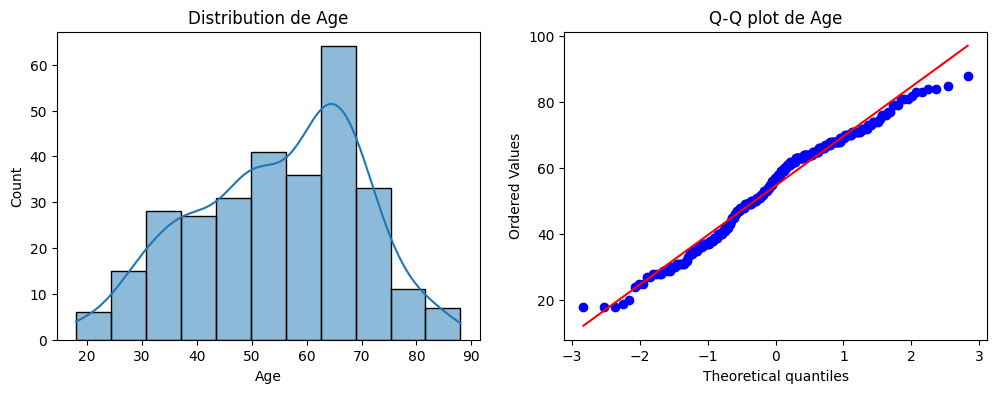

Asymétrie: -0.30884841143901914
La distribution de 'Age' est approximativement symétrique.
Corrélation avec Urée (g/L): -0.0327759801929039
Corrélation avec TA (mmHg)/Diastole: -0.14877454509541957
Corrélation avec Choc de Pointe/Perçu: 0.15215614900814575
Corrélation avec K^+ (meq/L): -0.04731017738425022
Corrélation avec Créatinine (mg/L): -0.23611634729979505
Corrélation avec TA (mmHg)/Systole: 0.03625650390430981
Corrélation avec Hb (g/dL): 0.06532252780779885
Corrélation avec Na^+ (meq/L): 0.17443757691785913
Corrélation avec Score de Glasgow (/15): 0.07392786048759288
--------------------------------------------------
Analyse pour la colonne: Urée (g/L)
Test de Shapiro-Wilk: ShapiroResult(statistic=np.float64(0.06454193715817136), pvalue=np.float64(6.335618942680815e-35))
La distribution de 'Urée (g/L)' ne semble pas normale.


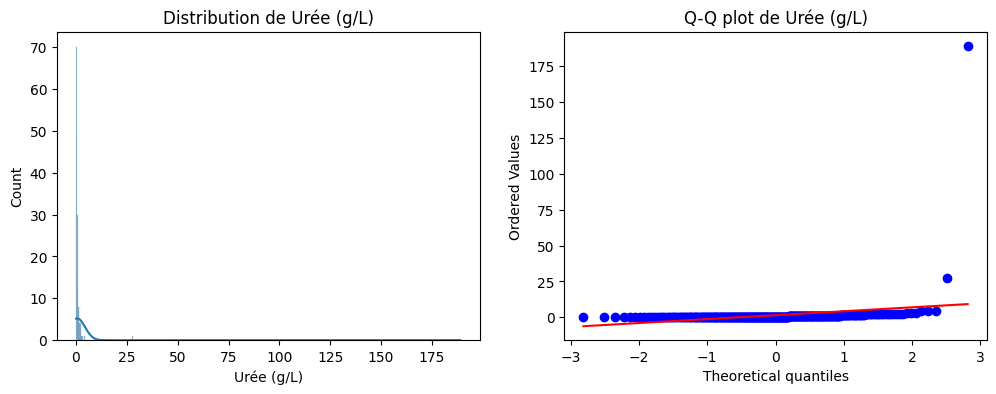

Asymétrie: 16.176038429574216
La distribution de 'Urée (g/L)' est fortement asymétrique.
Corrélation avec Age: -0.0327759801929039
Corrélation avec TA (mmHg)/Diastole: -0.04463178670015864
Corrélation avec Choc de Pointe/Perçu: -0.20403645730003298
Corrélation avec K^+ (meq/L): -0.0004267376745945695
Corrélation avec Créatinine (mg/L): 0.11093664441745879
Corrélation avec TA (mmHg)/Systole: -0.04986058820795843
Corrélation avec Hb (g/dL): -0.011806325593664792
Corrélation avec Na^+ (meq/L): -0.05374682016273258
Corrélation avec Score de Glasgow (/15): -0.05015982834079164
--------------------------------------------------
Analyse pour la colonne: TA (mmHg)/Diastole
Test de Shapiro-Wilk: ShapiroResult(statistic=np.float64(0.9155760364380295), pvalue=np.float64(1.4808504443372617e-10))
La distribution de 'TA (mmHg)/Diastole' ne semble pas normale.


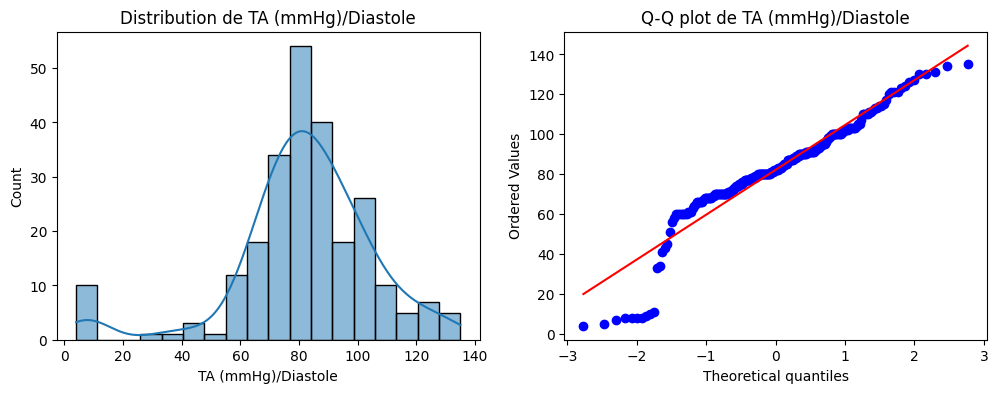

Asymétrie: -0.970467720874288
La distribution de 'TA (mmHg)/Diastole' est modérément asymétrique.
Corrélation avec Age: -0.1487745450954195
Corrélation avec Urée (g/L): -0.04463178670015868
Corrélation avec Choc de Pointe/Perçu: -0.12595616650772987
Corrélation avec K^+ (meq/L): 0.10961606021776868
Corrélation avec Créatinine (mg/L): 0.2748235537790756
Corrélation avec TA (mmHg)/Systole: 0.8267738690859748
Forte corrélation entre TA (mmHg)/Diastole et TA (mmHg)/Systole
Corrélation avec Hb (g/dL): -0.034801414033709864
Corrélation avec Na^+ (meq/L): -0.014145827666278383
Corrélation avec Score de Glasgow (/15): -0.12593493690816657
--------------------------------------------------
Analyse pour la colonne: Choc de Pointe/Perçu
Test de Shapiro-Wilk: ShapiroResult(statistic=np.float64(0.42411439362600534), pvalue=np.float64(8.576011410011558e-29))
La distribution de 'Choc de Pointe/Perçu' ne semble pas normale.


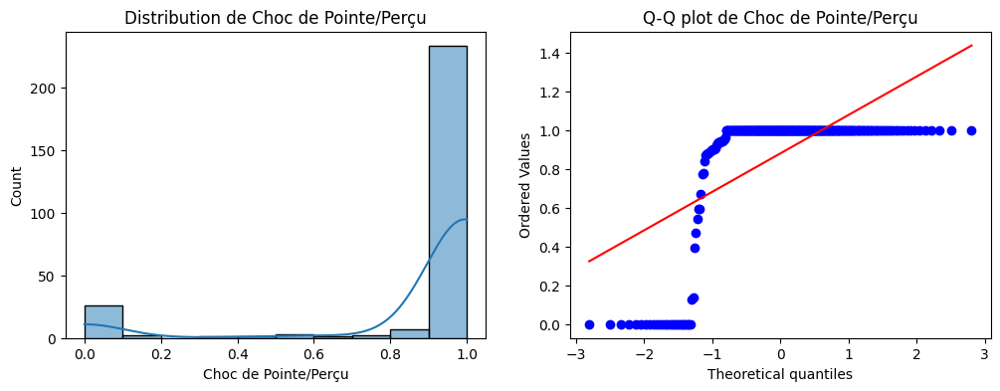

Asymétrie: -2.437339204737004
La distribution de 'Choc de Pointe/Perçu' est fortement asymétrique.
Corrélation avec Age: 0.15215614900814575
Corrélation avec Urée (g/L): -0.204036457300033
Corrélation avec TA (mmHg)/Diastole: -0.12595616650772978
Corrélation avec K^+ (meq/L): 0.016057471968528973
Corrélation avec Créatinine (mg/L): -0.4689366604360504
Corrélation avec TA (mmHg)/Systole: -0.11650726921361726
Corrélation avec Hb (g/dL): 0.1589834434489205
Corrélation avec Na^+ (meq/L): 0.1510331394807689
Corrélation avec Score de Glasgow (/15): 0.35422060060716515
--------------------------------------------------
Analyse pour la colonne: K^+ (meq/L)
Test de Shapiro-Wilk: ShapiroResult(statistic=np.float64(0.20616996475110294), pvalue=np.float64(1.495506124228749e-32))
La distribution de 'K^+ (meq/L)' ne semble pas normale.


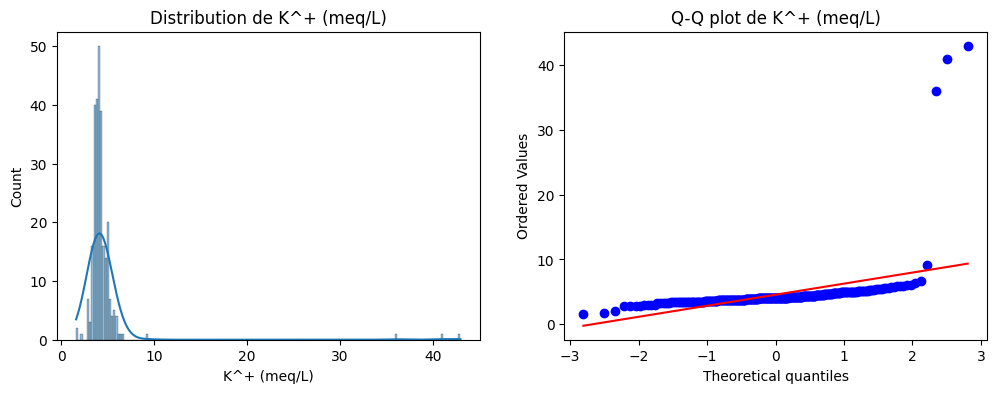

Asymétrie: 8.963156780978407
La distribution de 'K^+ (meq/L)' est fortement asymétrique.
Corrélation avec Age: -0.04731017738425023
Corrélation avec Urée (g/L): -0.0004267376745945798
Corrélation avec TA (mmHg)/Diastole: 0.10961606021776868
Corrélation avec Choc de Pointe/Perçu: 0.016057471968528945
Corrélation avec Créatinine (mg/L): 0.19760537729743585
Corrélation avec TA (mmHg)/Systole: 0.11982529087951929
Corrélation avec Hb (g/dL): -0.041324620142264304
Corrélation avec Na^+ (meq/L): -0.059158754764177514
Corrélation avec Score de Glasgow (/15): 0.029168142381122066
--------------------------------------------------
Analyse pour la colonne: Créatinine (mg/L)
Test de Shapiro-Wilk: ShapiroResult(statistic=np.float64(0.5452438118839349), pvalue=np.float64(1.9802953705631114e-27))
La distribution de 'Créatinine (mg/L)' ne semble pas normale.


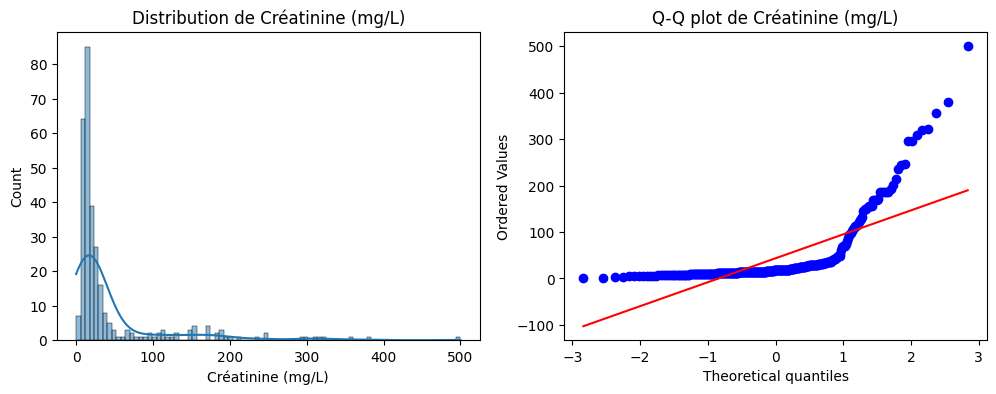

Asymétrie: 3.1449652996236255
La distribution de 'Créatinine (mg/L)' est fortement asymétrique.
Corrélation avec Age: -0.2361163472997951
Corrélation avec Urée (g/L): 0.11093664441745882
Corrélation avec TA (mmHg)/Diastole: 0.2748235537790755
Corrélation avec Choc de Pointe/Perçu: -0.4689366604360504
Corrélation avec K^+ (meq/L): 0.19760537729743585
Corrélation avec TA (mmHg)/Systole: 0.2779918405351216
Corrélation avec Hb (g/dL): -0.16475045835483865
Corrélation avec Na^+ (meq/L): -0.31495998397563796
Corrélation avec Score de Glasgow (/15): -0.30850613448805636
--------------------------------------------------
Analyse pour la colonne: TA (mmHg)/Systole
Test de Shapiro-Wilk: ShapiroResult(statistic=np.float64(0.8908824708092652), pvalue=np.float64(2.6532855520683657e-12))
La distribution de 'TA (mmHg)/Systole' ne semble pas normale.


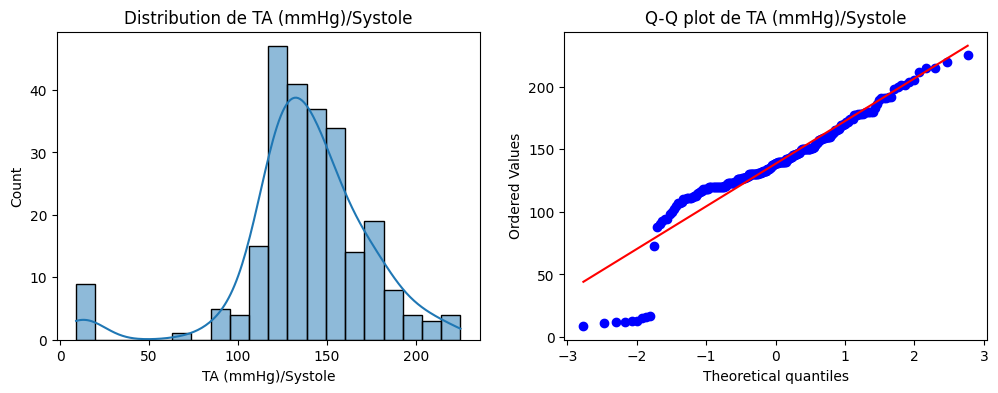

Asymétrie: -1.121664638664306
La distribution de 'TA (mmHg)/Systole' est fortement asymétrique.
Corrélation avec Age: 0.036256503904309796
Corrélation avec Urée (g/L): -0.04986058820795847
Corrélation avec TA (mmHg)/Diastole: 0.8267738690859748
Forte corrélation entre TA (mmHg)/Systole et TA (mmHg)/Diastole
Corrélation avec Choc de Pointe/Perçu: -0.1165072692136173
Corrélation avec K^+ (meq/L): 0.11982529087951929
Corrélation avec Créatinine (mg/L): 0.2779918405351216
Corrélation avec Hb (g/dL): -0.007444497021006778
Corrélation avec Na^+ (meq/L): -0.03672035329603534
Corrélation avec Score de Glasgow (/15): -0.1260942784534318
--------------------------------------------------
Analyse pour la colonne: Hb (g/dL)
Test de Shapiro-Wilk: ShapiroResult(statistic=np.float64(0.287380162114683), pvalue=np.float64(2.847128348844669e-30))
La distribution de 'Hb (g/dL)' ne semble pas normale.


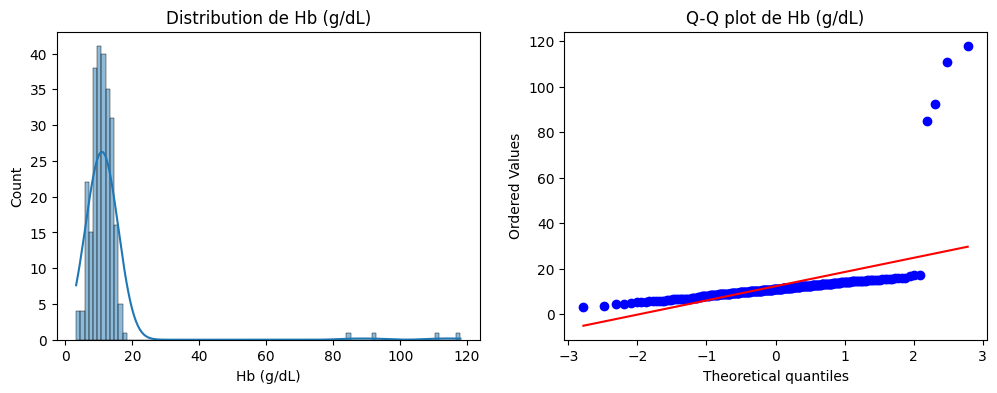

Asymétrie: 7.36658719649598
La distribution de 'Hb (g/dL)' est fortement asymétrique.
Corrélation avec Age: 0.06532252780779885
Corrélation avec Urée (g/L): -0.011806325593664789
Corrélation avec TA (mmHg)/Diastole: -0.03480141403370987
Corrélation avec Choc de Pointe/Perçu: 0.1589834434489205
Corrélation avec K^+ (meq/L): -0.04132462014226429
Corrélation avec Créatinine (mg/L): -0.16475045835483867
Corrélation avec TA (mmHg)/Systole: -0.0074444970210067705
Corrélation avec Na^+ (meq/L): 0.06323113641998172
Corrélation avec Score de Glasgow (/15): 0.07227542628208854
--------------------------------------------------
Analyse pour la colonne: Na^+ (meq/L)
Test de Shapiro-Wilk: ShapiroResult(statistic=np.float64(0.6529428378101345), pvalue=np.float64(3.7279913103736113e-23))
La distribution de 'Na^+ (meq/L)' ne semble pas normale.


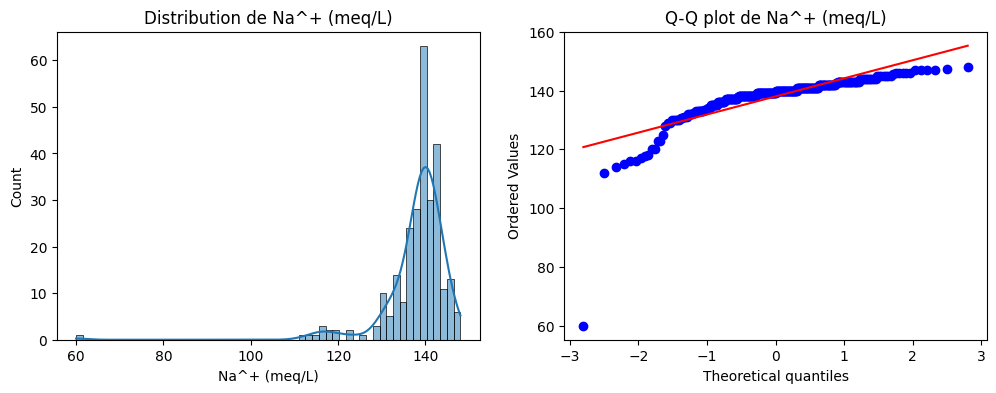

Asymétrie: -4.827735685508439
La distribution de 'Na^+ (meq/L)' est fortement asymétrique.
Corrélation avec Age: 0.17443757691785902
Corrélation avec Urée (g/L): -0.053746820162732585
Corrélation avec TA (mmHg)/Diastole: -0.014145827666278364
Corrélation avec Choc de Pointe/Perçu: 0.15103313948076905
Corrélation avec K^+ (meq/L): -0.05915875476417758
Corrélation avec Créatinine (mg/L): -0.31495998397563785
Corrélation avec TA (mmHg)/Systole: -0.0367203532960353
Corrélation avec Hb (g/dL): 0.06323113641998168
Corrélation avec Score de Glasgow (/15): 0.22354842932208074
--------------------------------------------------
Analyse pour la colonne: Score de Glasgow (/15)
Test de Shapiro-Wilk: ShapiroResult(statistic=np.float64(0.1586245990891877), pvalue=np.float64(2.9351910756527006e-33))
La distribution de 'Score de Glasgow (/15)' ne semble pas normale.


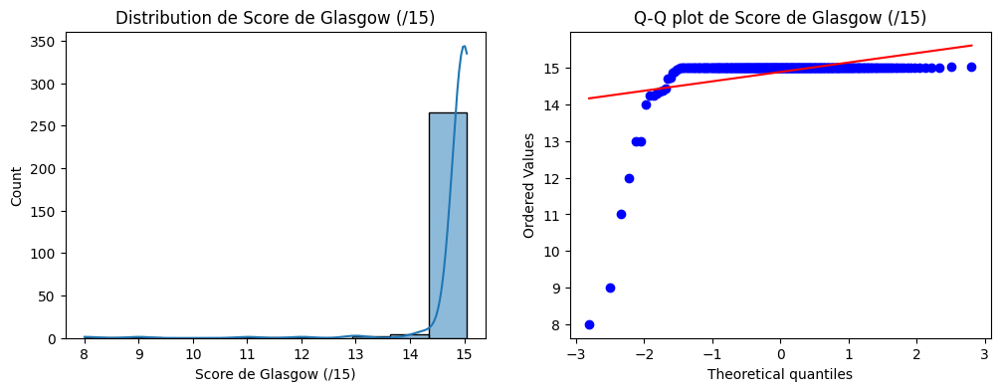

Asymétrie: -8.092209512939979
La distribution de 'Score de Glasgow (/15)' est fortement asymétrique.
Corrélation avec Age: 0.0739278604875929
Corrélation avec Urée (g/L): -0.05015982834079165
Corrélation avec TA (mmHg)/Diastole: -0.12593493690816662
Corrélation avec Choc de Pointe/Perçu: 0.35422060060716515
Corrélation avec K^+ (meq/L): 0.029168142381122125
Corrélation avec Créatinine (mg/L): -0.3085061344880561
Corrélation avec TA (mmHg)/Systole: -0.1260942784534318
Corrélation avec Hb (g/dL): 0.07227542628208852
Corrélation avec Na^+ (meq/L): 0.22354842932208085
--------------------------------------------------


In [ ]:


# Analyse des caractéristiques numériques
for col in continuous_features:
    if df_combined[col].dtype in ['float64', 'int64']:  # Vérifie si la colonne est numérique
        print(f"Analyse pour la colonne: {col}")

        # 1. Vérification de la normalité
        # Utilisation du test de Shapiro-Wilk pour la normalité
        shapiro_test = stats.shapiro(df_combined[col].dropna())
        print(f"Test de Shapiro-Wilk: {shapiro_test}")
        if shapiro_test.pvalue > 0.05:
          print(f"La distribution de '{col}' semble normale.")
        else:
            print(f"La distribution de '{col}' ne semble pas normale.")

        # Vérification visuelle de la normalité avec histogramme et Q-Q plot
        plt.figure(figsize=(12, 4))
        plt.subplot(1, 2, 1)
        sns.histplot(df_combined[col].dropna(), kde=True)
        plt.title(f'Distribution de {col}')

        plt.subplot(1, 2, 2)
        stats.probplot(df_combined[col].dropna(), dist="norm", plot=plt)
        plt.title(f'Q-Q plot de {col}')
        plt.show()


        # 2. Vérification de l'asymétrie (skewness)
        skewness = skew(df_combined[col].dropna())
        print(f"Asymétrie: {skewness}")
        if abs(skewness) < 0.5:
          print(f"La distribution de '{col}' est approximativement symétrique.")
        elif abs(skewness) < 1:
          print(f"La distribution de '{col}' est modérément asymétrique.")
        else:
            print(f"La distribution de '{col}' est fortement asymétrique.")

        # 3. Vérification de la corrélation avec d'autres variables numériques
        for other_col in continuous_features:
            if col != other_col and df_combined[other_col].dtype in ['float64', 'int64']:
              correlation = df_combined[[col, other_col]].dropna().corr().iloc[0,1]
              print(f"Corrélation avec {other_col}: {correlation}")
              if abs(correlation) > 0.7:
                  print(f"Forte corrélation entre {col} et {other_col}")

        print("-" * 50) # séparateur entre les colonnes

1️⃣ Variables numériques → Moyenne, médiane ou régression

🔹 Règle :

Si la distribution est normale → moyenne

Si elle est asymétrique → médiane

Si la corrélation avec d'autres variables est forte → modèle de régression

### Imputation des valeurs manquantes selon le type de variable

In [ ]:


# Variables à analyser
variables = ["Urée (g/L)", "TA (mmHg)/Diastole", "Na^+ (meq/L)", "Age", "Choc de Pointe/Perçu",
             "Hb (g/dL)", "Créatinine (mg/L)", "TA (mmHg)/Systole", "K^+ (meq/L)", "Score de Glasgow (/15)"]

# Imputation
print("\n🛠️ Début de l'imputation des valeurs manquantes...")

# 1. Médiane pour les variables asymétriques
for col in ["Urée (g/L)", "Age", "Hb (g/dL)", "K^+ (meq/L)", "TA (mmHg)/Diastole", "TA (mmHg)/Systole"]:
    median_value = df_combined[col].median()
    df_combined[col] = df_combined[col].fillna(median_value)
    print(f"✔️ {col} imputée par la médiane : {median_value:.2f}")

# 2. KNN Imputer pour variables complexes
knn_imputer = KNNImputer(n_neighbors=5)
cols_knn = ["Na^+ (meq/L)", "Choc de Pointe/Perçu", "Score de Glasgow (/15)"]

df_combined[cols_knn] = knn_imputer.fit_transform(df_combined[cols_knn])
print("✔️ Imputation KNN terminée pour Na^+⁺, Choc de Pointe/Perçu et Score de Glasgow")

print("\n✅ Imputation terminée avec succès !")



🛠️ Début de l'imputation des valeurs manquantes...
✔️ Urée (g/L) imputée par la médiane : 0.45
✔️ Age imputée par la médiane : 57.00
✔️ Hb (g/dL) imputée par la médiane : 10.90
✔️ K^+ (meq/L) imputée par la médiane : 4.10
✔️ TA (mmHg)/Diastole imputée par la médiane : 82.00
✔️ TA (mmHg)/Systole imputée par la médiane : 139.00
✔️ Imputation KNN terminée pour Na^+⁺, Choc de Pointe/Perçu et Score de Glasgow

✅ Imputation terminée avec succès !


2️⃣ Variables catégorielles → Mode ou 'Inconnu'

Faire une analyse et puis passé à la gestion des valeurs manquantes en fonction de ces règles
🔹 Règle :

Si la variable a une modalité dominante → Remplir avec cette modalité (mode).

Si c'est une variable sensible (médicale) → Ajouter une catégorie 'Inconnu' pour éviter de biaiser les résultats.


### Imputation des variables catégorielles selon la distribution des modalités

In [ ]:
# Liste des colonnes catégorielles à traiter
colonnes_cat = ["Anémie", "Enquête Sociale/Alcool", "Enquête Sociale/Tabac", "Sexe"]

for col in colonnes_cat:
    # Vérifier la modalité dominante
    mode = df_combined[col].mode()[0]
    compte_mode = df_combined[col].value_counts()[mode]
    compte_total = len(df_combined[col])

    # Définir un seuil pour la modalité dominante (ex: plus de 50% des données)
    seuil = 0.5 * compte_total

    if compte_mode > seuil:
        print(f"Colonne '{col}' : Modalité dominante '{mode}' détectée. Imputation des valeurs manquantes par le mode.")
        df_combined[col].fillna(mode, inplace=True)
    else:
        print(f"Colonne '{col}' : Aucune modalité dominante détectée. Ajout de la catégorie 'Inconnu' pour les valeurs manquantes.")
        df_combined[col].fillna('Inconnu', inplace=True)

Colonne 'Anémie' : Aucune modalité dominante détectée. Ajout de la catégorie 'Inconnu' pour les valeurs manquantes.
Colonne 'Enquête Sociale/Alcool' : Modalité dominante 'Non' détectée. Imputation des valeurs manquantes par le mode.
Colonne 'Enquête Sociale/Tabac' : Modalité dominante 'Non' détectée. Imputation des valeurs manquantes par le mode.
Colonne 'Sexe' : Aucune modalité dominante détectée. Ajout de la catégorie 'Inconnu' pour les valeurs manquantes.


<ipython-input-353-00a5fd1ddabb>:18: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_combined[col].fillna('Inconnu', inplace=True)
<ipython-input-353-00a5fd1ddabb>:15: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try 

### Nombre de valeurs manquantes dans chaque colde df_combined après traitement

In [ ]:
df_combined.isnull().sum().sort_values(ascending = False)

,0
Durée HTA (mois),108
Urée (g/L),0
Age,0
Causes Majeure après Diagnostic/HTA,0
Anémie,0
Causes Majeure après Diagnostic/Diabète,0
TA (mmHg)/Diastole,0
Stage de l'IRC,0
Choc de Pointe/Perçu,0
K^+ (meq/L),0


In [ ]:
df_combined.info()

<class 'pandas.core.frame.DataFrame'>
Index: 306 entries, 0 to 305
Data columns (total 23 columns):
 #   Column                                   Non-Null Count  Dtype  
---  ------                                   --------------  -----  
 0   Age                                      306 non-null    float64
 1   Urée (g/L)                               306 non-null    float64
 2   TA (mmHg)/Diastole                       306 non-null    float64
 3   Causes Majeure après Diagnostic/HTA      306 non-null    object 
 4   Anémie                                   306 non-null    object 
 5   Causes Majeure après Diagnostic/Diabète  306 non-null    object 
 6   Stage de l'IRC                           306 non-null    object 
 7   Choc de Pointe/Perçu                     306 non-null    float64
 8   Enquête Sociale/Tabac                    306 non-null    object 
 9   K^+ (meq/L)                              306 non-null    float64
 10  Créatinine (mg/L)                        306 non-null  

In [ ]:
# Remplacer les NaN par 'Inconnu' pour cette colonne
df_combined["Durée HTA (mois)"] = df_combined["Durée HTA (mois)"].fillna("Inconnu")

# Vérifier les valeurs uniques après traitement
print("Valeurs uniques après imputation :")
print(df_combined["Durée HTA (mois)"].unique())

Valeurs uniques après imputation :
['>=120' 'Inconnu' '[60;120[' '[6;12[' '<6' '[12;60[']


In [ ]:
df_combined.head()

,Age,Urée (g/L),TA (mmHg)/Diastole,Causes Majeure après Diagnostic/HTA,Anémie,Causes Majeure après Diagnostic/Diabète,Stage de l'IRC,Choc de Pointe/Perçu,Enquête Sociale/Tabac,K^+ (meq/L),Créatinine (mg/L),Personnels Médicaux/Diabète 2,Personnels Médicaux/HTA,TA (mmHg)/Systole,Durée HTA (mois),Hb (g/dL),Personnels Médicaux/Diabète 1,Symptômes/Oligurie,Na^+ (meq/L),Symptômes/OMI,Enquête Sociale/Alcool,Sexe,Score de Glasgow (/15)
0,50.0,1.29,80.0,Non,Oui,Non,CKD 5,0.0,Non,6.4,169.0,Non,Oui,140.0,>=120,11.4,Non,Non,131.0,Non,Oui,Oui,15.000000
1,28.0,0.66,80.0,Non,Oui,Non,CKD 5,0.0,Non,5.3,17.0,Non,Non,130.0,Inconnu,9.5,Non,Non,134.0,Oui,Oui,Oui,15.000000
2,69.0,0.79,34.0,Non,Oui,Non,CKD 5,0.0,Non,3.4,48.0,Oui,Oui,93.0,>=120,9.6,Non,Non,139.0,Oui,Non,Non,14.237314
3,68.0,1.14,70.0,Non,Oui,Non,CKD 5,0.0,Non,5.7,42.0,Non,Non,130.0,Inconnu,8.2,Non,Non,142.0,Oui,Non,Non,14.240324
4,68.0,0.45,111.0,Oui,Oui,Non,CKD 5,0.0,Non,4.1,500.0,Non,Oui,225.0,>=120,9.0,Non,Non,138.7,Oui,Non,Oui,14.296328


In [ ]:
df_combined.info()

<class 'pandas.core.frame.DataFrame'>
Index: 306 entries, 0 to 305
Data columns (total 23 columns):
 #   Column                                   Non-Null Count  Dtype  
---  ------                                   --------------  -----  
 0   Age                                      306 non-null    float64
 1   Urée (g/L)                               306 non-null    float64
 2   TA (mmHg)/Diastole                       306 non-null    float64
 3   Causes Majeure après Diagnostic/HTA      306 non-null    object 
 4   Anémie                                   306 non-null    object 
 5   Causes Majeure après Diagnostic/Diabète  306 non-null    object 
 6   Stage de l'IRC                           306 non-null    object 
 7   Choc de Pointe/Perçu                     306 non-null    float64
 8   Enquête Sociale/Tabac                    306 non-null    object 
 9   K^+ (meq/L)                              306 non-null    float64
 10  Créatinine (mg/L)                        306 non-null  

# 8. **Feature Selection et Feature Engineering pour la prédiction du Stage de l'IRC**

**ONE HOT ENCODING**

### Encodage des variables catégorielles avec One-Hot Encoding

In [ ]:


# Séparation des variables numériques et catégorielles
num_cols = df_combined.select_dtypes(include=['float64']).columns.tolist()
cat_cols = df_combined.select_dtypes(include=['object']).columns.tolist()

# Retirer la variable cible des cat_cols
target = 'Stage de l\'IRC'
cat_cols.remove(target)

# One-hot encoding
df_encoded = pd.get_dummies(df_combined, columns=cat_cols, drop_first=True)

# Vérification
print(df_encoded.shape)

(306, 29)


In [ ]:
df_encoded.columns

Index(['Age', 'Urée (g/L)', 'TA (mmHg)/Diastole', 'Stage de l'IRC',
       'Choc de Pointe/Perçu', 'K^+ (meq/L)', 'Créatinine (mg/L)',
       'TA (mmHg)/Systole', 'Hb (g/dL)', 'Na^+ (meq/L)',
       'Score de Glasgow (/15)', 'Causes Majeure après Diagnostic/HTA_Oui',
       'Anémie_Non', 'Anémie_Oui',
       'Causes Majeure après Diagnostic/Diabète_Oui',
       'Enquête Sociale/Tabac_Oui', 'Personnels Médicaux/Diabète 2_Oui',
       'Personnels Médicaux/HTA_Oui', 'Durée HTA (mois)_>=120',
       'Durée HTA (mois)_Inconnu', 'Durée HTA (mois)_[12;60[',
       'Durée HTA (mois)_[60;120[', 'Durée HTA (mois)_[6;12[',
       'Personnels Médicaux/Diabète 1_Oui', 'Symptômes/Oligurie_Oui',
       'Symptômes/OMI_Oui', 'Enquête Sociale/Alcool_Oui', 'Sexe_Non',
       'Sexe_Oui'],
      dtype='object')

**FEATURE SELECTION**

### Analyse des corrélations entre les variables numériques

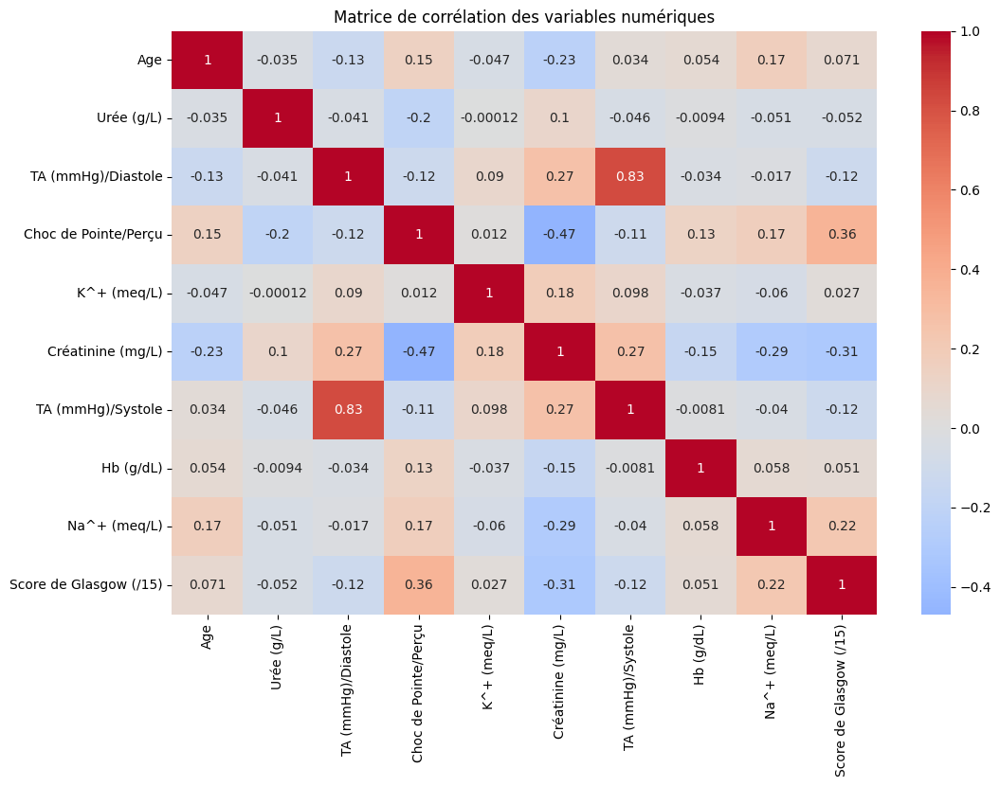

In [ ]:
# Analyse de la correlation

# Matrice de corrélation
corr_matrix = df_combined[num_cols].corr()

# Heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', center=0)
plt.title('Matrice de corrélation des variables numériques')
plt.show()

### Sélection des variables importantes pour la prédiction via Random Forest

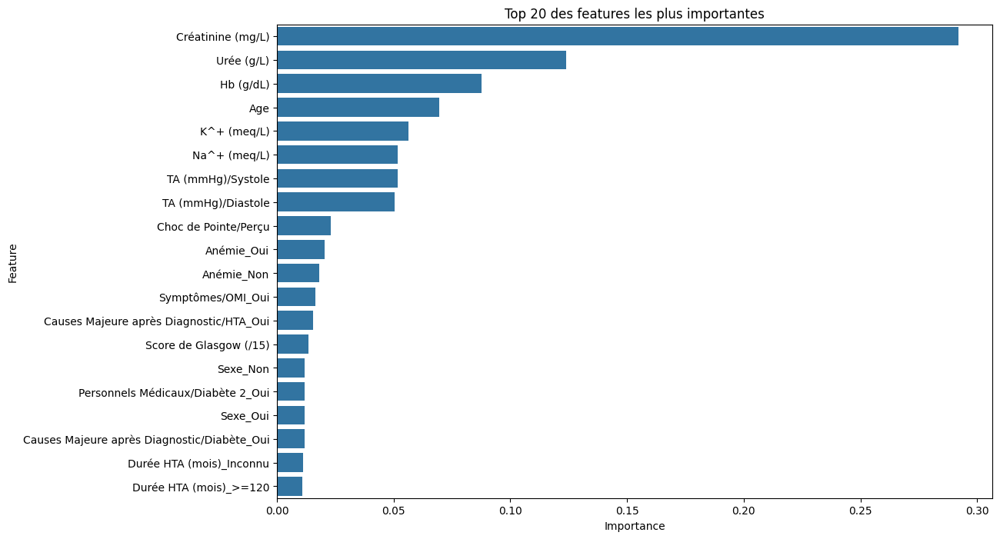

In [ ]:


# Séparation X/y
X = df_encoded.drop(target, axis=1)
y = df_encoded[target]

# Modèle Random Forest
rf = RandomForestClassifier(random_state=42)
rf.fit(X, y)

# Importance des features
feature_importance = pd.DataFrame({
    'Feature': X.columns,
    'Importance': rf.feature_importances_
}).sort_values('Importance', ascending=False)

# Visualisation
plt.figure(figsize=(12, 8))
sns.barplot(x='Importance', y='Feature', data=feature_importance.head(20))
plt.title('Top 20 des features les plus importantes')
plt.show()

In [ ]:


# Sélection des k meilleures features
selector = SelectKBest(score_func=f_classif, k=15)
X_new = selector.fit_transform(X, y)

# Récupération des noms des features sélectionnées
selected_features = X.columns[selector.get_support()]
print("Features sélectionnées:", selected_features)

Features sélectionnées: Index(['Age', 'TA (mmHg)/Diastole', 'Choc de Pointe/Perçu',
       'Créatinine (mg/L)', 'Hb (g/dL)', 'Na^+ (meq/L)',
       'Score de Glasgow (/15)', 'Anémie_Non', 'Anémie_Oui',
       'Causes Majeure après Diagnostic/Diabète_Oui',
       'Personnels Médicaux/Diabète 2_Oui', 'Personnels Médicaux/HTA_Oui',
       'Durée HTA (mois)_Inconnu', 'Symptômes/Oligurie_Oui',
       'Symptômes/OMI_Oui'],
      dtype='object')


**STANDARDISATON**

In [ ]:
df_encoded.shape

(306, 29)

### Construction du modèle prédictif avec Random Forest

In [ ]:


# Assuming 'df_encoded', 'X', 'y', and 'selected_features' are defined from the previous code

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize and train the model
model = RandomForestClassifier(n_estimators=200, max_depth=12, random_state=42, class_weight='balanced')
model.fit(X_train, y_train)


RandomForestClassifier(class_weight='balanced', max_depth=12, n_estimators=200,
                       random_state=42)

### Évaluation des performances du modèle sur le jeu de test

In [ ]:



# Make predictions on the test set
y_pred = model.predict(X_test)

# Evaluate the model
print(classification_report(y_test, y_pred))
print(confusion_matrix(y_test, y_pred))
print("Accuracy:", accuracy_score(y_test, y_pred))


              precision    recall  f1-score   support

       CKD 1       0.50      1.00      0.67         6
       CKD 2       0.67      0.31      0.42        13
      CKD 3a       0.38      0.33      0.35         9
      CKD 3b       0.73      0.50      0.59        16
       CKD 4       0.50      1.00      0.67         7
       CKD 5       1.00      1.00      1.00        11

    accuracy                           0.63        62
   macro avg       0.63      0.69      0.62        62
weighted avg       0.66      0.63      0.61        62

[[ 6  0  0  0  0  0]
 [ 6  4  3  0  0  0]
 [ 0  2  3  3  1  0]
 [ 0  0  2  8  6  0]
 [ 0  0  0  0  7  0]
 [ 0  0  0  0  0 11]]
Accuracy: 0.6290322580645161


# 9. **MODELISATION-HACKATHON**

In [ ]:

df = pd.read_csv("/content/dataset-modelisation-hackathon-vf.csv")
df.head()

,Créatinine (mg/L),Urée (g/L),Age,Na^+ (meq/L),TA (mmHg)/Systole,Choc de Pointe/Perçu,Sexe,Anémie,Score de Glasgow (/15),Stage de l'IRC,Enquête Sociale/Tabac,Enquête Sociale/Alcool
0,42.0,1.14,68,142.0,130.0,0.0,1.0,1.0,15.000000,5,0.0,1.0
1,156.0,1.58,58,130.0,150.0,0.0,1.0,1.0,15.000000,5,0.0,1.0
2,379.0,3.03,42,141.0,169.0,0.0,0.0,1.0,14.237314,5,0.0,0.0
3,93.0,2.13,55,123.0,110.0,0.0,0.0,1.0,14.240324,5,0.0,0.0
4,355.9,3.22,38,138.6,164.0,0.0,1.0,1.0,14.296328,5,0.0,0.0


In [ ]:
df.shape

(276, 12)

### Matrice de correlation avec la variable cible "Stage de l'IRC"

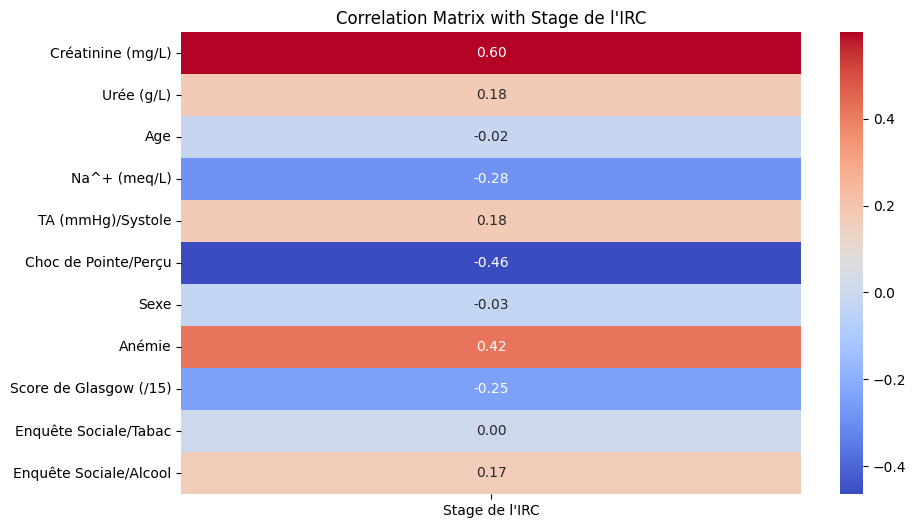

In [ ]:


# Calculate the correlation matrix
correlation_matrix = df.corr()

# Filter the correlation matrix for the target variable "Stage de l'IRC"
target_variable = "Stage de l'IRC"
target_correlations = correlation_matrix[target_variable].drop(target_variable)

# Create a heatmap of the correlations
plt.figure(figsize=(10, 6))
sns.heatmap(target_correlations.to_frame(), annot=True, cmap="coolwarm", fmt=".2f")
plt.title(f"Correlation Matrix with {target_variable}")
plt.show()


### Classification des variables selon leur type

In [ ]:
variable_cat_binaire = ['Sexe', 'Anémie', 'Enquête Sociale/Tabac', 'Enquête Sociale/Alcool']
variable_cat_non_binaire = ["Stage de l'IRC"]
variable_numérique = ['Créatinine (mg/L)',
                      'Urée (g/L)',
                      'Age',
                      'Na^+ (meq/L)',
                      'TA (mmHg)/Systole',
                      'Choc de Pointe/Perçu',
                      'Score de Glasgow (/15)']

### Encodage des variable binaire qui sont dans variable_cat_binaire

In [ ]:

# One-hot encode binary categorical variables
df = pd.get_dummies(df, columns=variable_cat_binaire, drop_first=True)


In [ ]:
df.head()

,Créatinine (mg/L),Urée (g/L),Age,Na^+ (meq/L),TA (mmHg)/Systole,Choc de Pointe/Perçu,Score de Glasgow (/15),Stage de l'IRC,Sexe_1.0,Anémie_1.0,Enquête Sociale/Tabac_1.0,Enquête Sociale/Alcool_1.0
0,42.0,1.14,68,142.0,130.0,0.0,15.000000,5,True,True,False,True
1,156.0,1.58,58,130.0,150.0,0.0,15.000000,5,True,True,False,True
2,379.0,3.03,42,141.0,169.0,0.0,14.237314,5,False,True,False,False
3,93.0,2.13,55,123.0,110.0,0.0,14.240324,5,False,True,False,False
4,355.9,3.22,38,138.6,164.0,0.0,14.296328,5,True,True,False,False


### Conversion des valeurs booléennes en valeurs numériques

In [ ]:


# Replace True with 1 and False with 0 in the DataFrame
df = df.replace({True: 1, False: 0})

df.head()


<ipython-input-373-71a2a15a0442>:2: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df = df.replace({True: 1, False: 0})


,Créatinine (mg/L),Urée (g/L),Age,Na^+ (meq/L),TA (mmHg)/Systole,Choc de Pointe/Perçu,Score de Glasgow (/15),Stage de l'IRC,Sexe_1.0,Anémie_1.0,Enquête Sociale/Tabac_1.0,Enquête Sociale/Alcool_1.0
0,42.0,1.14,68,142.0,130.0,0.0,15.000000,5,1,1,0,1
1,156.0,1.58,58,130.0,150.0,0.0,15.000000,5,1,1,0,1
2,379.0,3.03,42,141.0,169.0,0.0,14.237314,5,0,1,0,0
3,93.0,2.13,55,123.0,110.0,0.0,14.240324,5,0,1,0,0
4,355.9,3.22,38,138.6,164.0,0.0,14.296328,5,1,1,0,0


### Modélisation et Evaluation avec la regression logistique

In [ ]:




# Define features (X) and target (y)
X = df.drop('Stage de l\'IRC', axis=1)
y = df['Stage de l\'IRC']

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=50)

# Initialize and train the logistic regression model
logreg = LogisticRegression(max_iter=1000)  # Increased max_iter
logreg.fit(X_train, y_train)

# Make predictions on the test set
y_pred = logreg.predict(X_test)

# Evaluate the model
print(classification_report(y_test, y_pred))
print(confusion_matrix(y_test, y_pred))


              precision    recall  f1-score   support

           0       0.70      1.00      0.82         7
           1       0.50      0.33      0.40         6
           2       0.38      0.62      0.48         8
           3       0.91      0.62      0.74        16
           4       1.00      0.86      0.92         7
           5       0.92      0.92      0.92        12

    accuracy                           0.73        56
   macro avg       0.74      0.73      0.71        56
weighted avg       0.78      0.73      0.74        56

[[ 7  0  0  0  0  0]
 [ 3  2  1  0  0  0]
 [ 0  2  5  1  0  0]
 [ 0  0  6 10  0  0]
 [ 0  0  0  0  6  1]
 [ 0  0  1  0  0 11]]


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


### Entraînement et évaluation des modèles XGBoost et Random Forest

📌 Performance de XGBoost:
Accuracy: 0.8035714285714286
              precision    recall  f1-score   support

           0       0.82      1.00      0.90         9
           1       0.71      0.50      0.59        10
           2       0.78      0.70      0.74        10
           3       0.80      0.89      0.84         9
           4       0.75      1.00      0.86         9
           5       1.00      0.78      0.88         9

    accuracy                           0.80        56
   macro avg       0.81      0.81      0.80        56
weighted avg       0.81      0.80      0.79        56



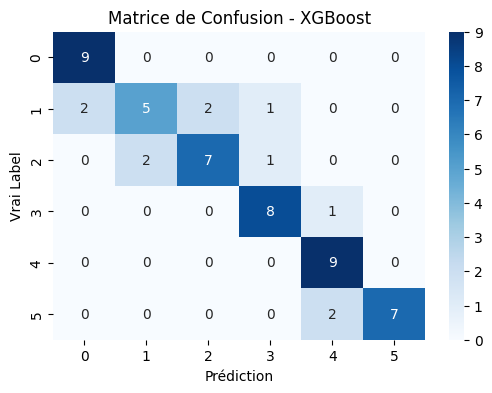


📌 Performance de Random Forest:
Accuracy: 0.7678571428571429
              precision    recall  f1-score   support

           0       0.82      1.00      0.90         9
           1       0.56      0.50      0.53        10
           2       0.71      0.50      0.59        10
           3       0.78      0.78      0.78         9
           4       0.75      1.00      0.86         9
           5       1.00      0.89      0.94         9

    accuracy                           0.77        56
   macro avg       0.77      0.78      0.77        56
weighted avg       0.76      0.77      0.76        56



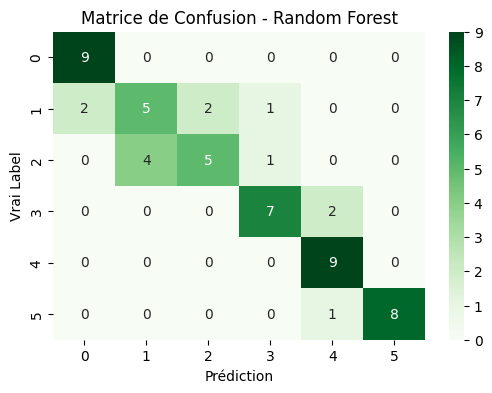

In [ ]:



X = df.drop(columns=["Stage de l'IRC"])  # Features
y = df["Stage de l'IRC"]  # Cible

# 🔹 3. Normalisation des features numériques
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# 🔹 4. Séparer en jeu d'entraînement et de test (80% train, 20% test)
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42, stratify=y)

# 🔹 5. Modèle XGBoost
xgb_model = XGBClassifier(n_estimators=100, learning_rate=0.1, max_depth=5, subsample=0.8, colsample_bytree=0.8, random_state=42)
xgb_model.fit(X_train, y_train)

# 🔹 6. Prédictions et évaluation
y_pred = xgb_model.predict(X_test)
print("📌 Performance de XGBoost:")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(classification_report(y_test, y_pred))

# 🔹 7. Matrice de confusion
plt.figure(figsize=(6,4))
sns.heatmap(confusion_matrix(y_test, y_pred), annot=True, fmt='d', cmap='Blues')
plt.xlabel("Prédiction")
plt.ylabel("Vrai Label")
plt.title("Matrice de Confusion - XGBoost")
plt.show()

# 🔹 8. Comparaison avec Random Forest
rf_model = RandomForestClassifier(n_estimators=100, max_depth=10, random_state=42)
rf_model.fit(X_train, y_train)
y_pred_rf = rf_model.predict(X_test)

print("\n📌 Performance de Random Forest:")
print("Accuracy:", accuracy_score(y_test, y_pred_rf))
print(classification_report(y_test, y_pred_rf))

# 🔹 9. Matrice de confusion Random Forest
plt.figure(figsize=(6,4))
sns.heatmap(confusion_matrix(y_test, y_pred_rf), annot=True, fmt='d', cmap='Greens')
plt.xlabel("Prédiction")
plt.ylabel("Vrai Label")
plt.title("Matrice de Confusion - Random Forest")
plt.show()


### Optimisation du modèle XGBoost avec recherche aléatoire et rééchantillonnage SMOTE

📌 Performance de XGBoost Amélioré:
Accuracy: 0.7166666666666667
              precision    recall  f1-score   support

           0       0.83      1.00      0.91        10
           1       0.44      0.40      0.42        10
           2       0.56      0.50      0.53        10
           3       0.80      0.80      0.80        10
           4       0.69      0.90      0.78        10
           5       1.00      0.70      0.82        10

    accuracy                           0.72        60
   macro avg       0.72      0.72      0.71        60
weighted avg       0.72      0.72      0.71        60



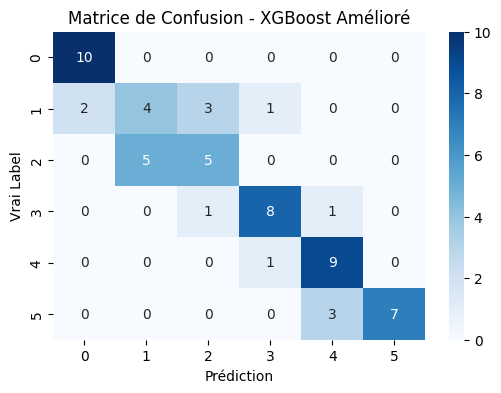

In [ ]:



# 🔹 2. Séparer les features et la cible
X = df.drop(columns=["Stage de l'IRC"])  # Features
y = df["Stage de l'IRC"]  # Cible

# 🔹 3. Normalisation des features numériques
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# 🔹 4. Rééquilibrage des classes avec SMOTE (si nécessaire)
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X_scaled, y)

# 🔹 5. Séparer en train/test (80% train, 20% test)
X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.2, random_state=42, stratify=y_resampled)

# 🔹 6. Optimisation des hyperparamètres avec RandomizedSearchCV
param_grid = {
    'n_estimators': [50, 100, 200],
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 5, 7],
    'subsample': [0.7, 0.8, 1.0],
    'colsample_bytree': [0.7, 0.8, 1.0]
}

xgb = XGBClassifier(random_state=42)
xgb_search = RandomizedSearchCV(xgb, param_distributions=param_grid, n_iter=10, cv=3, scoring='f1_weighted', n_jobs=-1, random_state=42)
xgb_search.fit(X_train, y_train)

# 🔹 7. Meilleur modèle trouvé
best_xgb = xgb_search.best_estimator_

# 🔹 8. Prédictions et évaluation
y_pred = best_xgb.predict(X_test)
print("📌 Performance de XGBoost Amélioré:")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(classification_report(y_test, y_pred))

# 🔹 9. Matrice de confusion
plt.figure(figsize=(6,4))
sns.heatmap(confusion_matrix(y_test, y_pred), annot=True, fmt='d', cmap='Blues')
plt.xlabel("Prédiction")
plt.ylabel("Vrai Label")
plt.title("Matrice de Confusion - XGBoost Amélioré")
plt.show()


### Entraînement et évaluation du modèle Random Forest

📌 Performance de Random Forest:
Accuracy: 0.85
              precision    recall  f1-score   support

           0       0.91      1.00      0.95        10
           1       0.75      0.60      0.67        10
           2       0.80      0.80      0.80        10
           3       0.90      0.90      0.90        10
           4       0.77      1.00      0.87        10
           5       1.00      0.80      0.89        10

    accuracy                           0.85        60
   macro avg       0.85      0.85      0.85        60
weighted avg       0.85      0.85      0.85        60



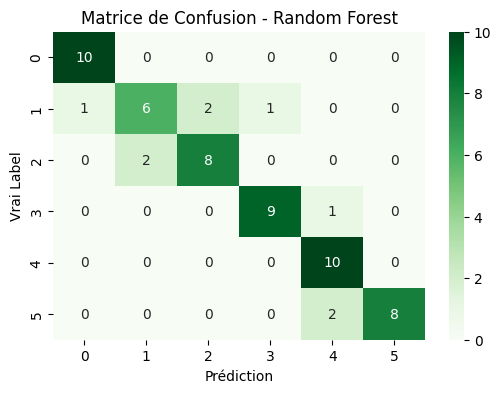

In [ ]:

# Entraînement d’un modèle Random Forest
model = RandomForestClassifier(n_estimators=200, max_depth=12, random_state=42, class_weight='balanced')
model.fit(X_train, y_train)

# Faire des prédictions sur l'ensemble de test
y_pred = model.predict(X_test)

# Évaluer le modèle
print("📌 Performance de Random Forest:")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(classification_report(y_test, y_pred))

# Matrice de confusion Random Forest
plt.figure(figsize=(6,4))
sns.heatmap(confusion_matrix(y_test, y_pred), annot=True, fmt='d', cmap='Greens')
plt.xlabel("Prédiction")
plt.ylabel("Vrai Label")
plt.title("Matrice de Confusion - Random Forest")
plt.show()
